This Jupyter notebook contains the GNNExplainer method.

In [1]:
import os

import pandas as pd
import networkx as nx
import numpy as np
import torch

import pickle
import copy

import matplotlib.pyplot as plt

from gensim.models import KeyedVectors

import data_params as input_data_params

# Set Parameters

In [2]:
dataset_prefix = input_data_params.dataset

disease_prefix = input_data_params.disease
assert disease_prefix == 'dmd' or 'hd' or 'oi'

embedding_method = 'e2v'

seeded_emb = input_data_params.e2v_seed

if seeded_emb:
    fixed_emb = '_seeded'
else:
    fixed_emb = ''
    
threshold_nr_runs = '5'   # i.e. '5' for 50% match
num_hops = 1

print(f'{dataset_prefix} {disease_prefix} {threshold_nr_runs}')

restr dmd 6


# Set Folder

In [3]:
curr_working_dir = os.path.dirname(os.getcwd())
curr_output_dir = os.path.join(curr_working_dir, 'output', disease_prefix)
dataset_output_dir = os.path.join(curr_output_dir, f'{dataset_prefix}_{embedding_method}{fixed_emb}')

if not os.path.exists(dataset_output_dir):
    print('First, run the edge2vec embedding and predictor script. Then, run this script.')
else:
    print(f'Output folder for dataset {dataset_prefix} {disease_prefix} exists and will be used: {dataset_output_dir}')
    
run_folders_list = []
for item in os.listdir(dataset_output_dir):
    curr_path = os.path.join(dataset_output_dir, item)
    if os.path.isdir(curr_path) and 'run' in item:
        run_folders_list.append(item)

expl_output_dir = os.path.join(dataset_output_dir, f'expl_{threshold_nr_runs}')
if not os.path.exists(expl_output_dir):
    os.mkdir(expl_output_dir)
    print(f'Output folder for predictions from dataset {dataset_prefix} {disease_prefix} using method {embedding_method} is created: {expl_output_dir}')
else:
    print(f'Output folder for predictions from dataset {dataset_prefix} {disease_prefix} using method {embedding_method} already exists and will be used: {expl_output_dir}')

run_folders_paths = []
if len(run_folders_list) > 0:
    for run_folder in run_folders_list:
        latest_run = run_folder
        
        run_dir = os.path.join(dataset_output_dir, latest_run)
        run_folders_paths.append(run_dir)
    
else:
    print('First, run the edge2vec embedding and predictor script. Then, run this script.')

Output folder for dataset restr dmd exists and will be used: c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v
Output folder for predictions from dataset restr dmd using method e2v is created: c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6


# Load all data

Load the nodes

In [4]:
nodes = pd.read_csv(f'../output/{disease_prefix}/{dataset_prefix}_{disease_prefix}_indexed_nodes.csv')
nodes

,index_id,id,semantic,label,semantic_id
0,0,MP:0003087,phenotype,absent allantois,8
1,1,MP:0005399,phenotype,increased susceptibility to fungal infection,8
2,2,ENSEMBL:ENSECAG00000017410,gene,ENSEMBL:ENSECAG00000017410,4
3,3,FlyBase:FBgn0003429,gene,slo,4
4,4,dbSNP:rs1426040,variant,rs1426040-?,10
...,...,...,...,...,...
11062,11062,MP:0005079,phenotype,decreased cytotoxic T cell cytolysis,8
11063,11063,ENSEMBL:ENSSSCG00000005316,gene,TPM2,4
11064,11064,RGD:621052,gene,Lamc1,4
11065,11065,WormBase:WBGene00007167,gene,rbg-3,4


In [5]:
nodes.iloc[5487]

index_id                             5487
id             ENSEMBL:ENSSSCG00000002690
semantic                             gene
label                                 GAN
semantic_id                             4
Name: 5487, dtype: object

In [6]:
node_labels_dict = nodes[['semantic_id', 'semantic']].drop_duplicates().set_index('semantic_id').to_dict()['semantic']
node_labels_dict

{8: 'phenotype',
 4: 'gene',
 10: 'variant',
 3: 'drug',
 0: 'biological artifact',
 9: 'taxon',
 6: 'genotype',
 7: 'molecular function',
 5: 'gene product',
 2: 'disease',
 1: 'biological process'}

Load the edges

In [7]:
edges = pd.read_csv(f'../output/{disease_prefix}/{dataset_prefix}_{disease_prefix}_indexed_edges.csv')
edges

,head,label_head,class_head,index_head,relation,tail,label_tail,class_tail,index_tail,type
0,HGNC:7582,MYL1,4,3634,in orthology relationship with,WormBase:WBGene00023451,mlc-7,4,4018,0
1,dictyBase:DDB_G0287981,DDB0187718,4,5696,in orthology relationship with,FlyBase:FBgn0000046,Act87E,4,10290,0
2,WormBase:WBGene00015704,tiam-1,4,3890,in orthology relationship with,HGNC:11805,TIAM1,4,3028,0
3,ENSEMBL:ENSPTRG00000013519,ENSEMBL:ENSPTRG00000013519,4,8053,in orthology relationship with,WormBase:R02C2.4b,nhr-204,4,8454,0
4,ENSEMBL:ENSGALG00000000209,ENSEMBL:ENSGALG00000000209,4,4564,in orthology relationship with,ENSEMBL:ENSMODG00000011569,ENSEMBL:ENSMODG00000011569,4,5422,0
...,...,...,...,...,...,...,...,...,...,...
96372,HGNC:26068,LAMTOR1,4,8065,in orthology relationship with,ENSEMBL:ENSOANG00000042128,ENSEMBL:ENSOANG00000042128,4,1822,0
96373,ENSEMBL:ENSCAFG00000014976,MARK2,4,5181,in orthology relationship with,WormBase:WBGene00003916,par-1,4,3574,0
96374,HGNC:19181,KIF14,4,6696,interacts with,HGNC:12011,TPM2,4,1526,3
96375,HGNC:9863,RAPSN,4,285,in orthology relationship with,RGD:1311592,Rapsn,4,1962,0


In [8]:
def loadEdge2VecEmbedding(current_run_dir): 
    node_feat = KeyedVectors.load(f'{current_run_dir}/w2v_{dataset_prefix}_{disease_prefix}.dvectors', mmap='r')
    e2v_embedding = pd.DataFrame(columns = ['Node', 'Embedding'])
    for idx, key in enumerate(node_feat.index_to_key):
        e2v_embedding.loc[int(key)] = pd.Series({'Node':int(key), 'Embedding':list(node_feat[key])})
        
    return e2v_embedding.sort_values('Node')

In [9]:
def create_graph(embedding):
    G = nx.Graph() # TODO: DiGraph?
    for ind, node in embedding.iterrows(): 
        G.add_node(int(node['Node']), node_feature=torch.Tensor(node['Embedding']))
    for ind, edge in edges.iterrows(): 
        G.add_edge(int(edge['index_head']), int(edge['index_tail']), edge_label = edge['relation'])
    
    for node in G.nodes(data=True):
        print(node)
        break
    for edge in G.edges(data=True):
        print(edge)
        break

    print("Number of edges is {}".format(G.number_of_edges()))
    print("Number of nodes is {}".format(G.number_of_nodes()))
    
    return G

In [10]:
from gnn.linkpred_model import LinkPredModel

def load_trained_model(current_run_dir, embedding):
    with open(f'{current_run_dir}/{dataset_prefix}_{disease_prefix}_best_model_{embedding_method}_args.pkl', 'rb') as f:
        loaded_args = pickle.load(f)
        
    best_model = LinkPredModel(len(embedding['Embedding'][0]), 
                            loaded_args['hidden_dim'], loaded_args['output_dim'], 
                            loaded_args['layers'], loaded_args['aggr'], 
                            loaded_args['dropout'], loaded_args['device']).to(loaded_args['device'])
    best_model.load_state_dict(torch.load(f'{run_dir}/{dataset_prefix}_{disease_prefix}_best_model_{embedding_method}.pth'))
    
    return best_model

# Explain predictions

In [11]:
from gnn.gnnexplainer import GNNExplainer, visualize_subgraph

def explain_edge(node_idx1, node_idx2, model, x, edge_index, G):
    explainer = GNNExplainer(model,
                             epochs=700, num_hops=num_hops, lr=0.01)
    
    trigger = False
    early_stop = 0
    size = 15       	# change size of the explanation graph
    iterations = 10     # number of times GNNExplainer is executed
    
    while not trigger:
        _, edge_mask = explainer.explain_link(node_idx1=node_idx1, node_idx2=node_idx2,
                                              x=x, edge_index=edge_index,
                                              G=G)
        
        G2 = copy.deepcopy(G)
        
        if size is not None:
            limit = edge_mask.sort(descending = True)[0][size]
            print('Contribution threshold is', limit)
        else:
            limit = 0.5
        
        for indx, edge in enumerate(G.edges): 
            if edge_mask[indx] < limit:
                G2.remove_edge(edge[0], edge[1])
        
        if nx.has_path(G2, node_idx1, node_idx2) and torch.is_nonzero(limit):
            trigger = True
            
        early_stop += 1
        
        if early_stop == iterations and not trigger:
            print('No good explanation found after {} iterations'.format(early_stop))
            trigger = True
            complete = False
        elif trigger: 
            print('Explanation found!')
            complete = True
            return edge_mask, limit, complete
        
    if torch.is_nonzero(limit):
        return edge_mask, limit, complete
    else:
        return None, None, complete
    

In [12]:
with open(f'{dataset_output_dir}/symptom_drug_pair_overlapping_{threshold_nr_runs}_runs_{disease_prefix}_{dataset_prefix}_{embedding_method}.pkl', 'rb') as f:
    overlapping_symptom_drug_pairs = pickle.load(f)

overlapping_symptoms_drugs = {}

for overlapping_pair in overlapping_symptom_drug_pairs:
    symptom = overlapping_pair[0]
    drug = overlapping_pair[1]
    
    if symptom in overlapping_symptoms_drugs:
        overlapping_symptoms_drugs[symptom].append(drug)
    else:
        overlapping_symptoms_drugs[symptom] = [drug]
        
overlapping_symptoms_drugs

{'HP:0003323': ['231', '1576'],
 'HP:0003307': ['1795', '231', '5359'],
 'HP:0001328': ['1795', '5359', '269'],
 'HP:0003391': ['231', '269'],
 'HP:0001252': ['5359', '269', '1795'],
 'HP:0100543': ['1795', '5359', '269'],
 'HP:0001290': ['269', '1795', '5359'],
 'HP:0003560': ['231', '1576'],
 'HP:0001371': ['1795', '5359', '269'],
 'HP:0002650': ['5359', '269', '1795'],
 'HP:0001270': ['1795', '5359', '269'],
 'HP:0003707': ['231'],
 'HP:0008981': ['231'],
 'HP:0001256': ['5359', '269'],
 'HP:0003701': ['1795', '231', '1576', '5359'],
 'HP:0011675': ['1576'],
 'HP:0003236': ['231', '1576', '5359'],
 'HP:0001265': ['231', '5359', '269', '1795'],
 'HP:0003202': ['5359', '231'],
 'HP:0002791': ['269', '1795'],
 'HP:0002515': ['5359', '269', '1795'],
 'HP:0001263': ['5359', '269', '1795'],
 'HP:0001638': ['231', '1576', '5359'],
 'HP:0000750': ['5359', '269', '1795'],
 'HP:0001644': ['231', '1576'],
 'HP:0002093': ['5359', '269', '1795'],
 'HP:0003115': ['231', '1576'],
 'HP:0001635': ['

In [13]:
def get_graph_to_save(G):
    G_save = copy.deepcopy(G)

    for node in G_save.nodes(data=True):
        key = node[1]['y2']
        node[1]['type'] = node_labels_dict[key]
        
    for node in G_save.nodes():
        G_save.nodes[node].pop('y')
        G_save.nodes[node].pop('y2')
        
    for edge in G_save.edges():
        G_save.edges[edge].pop('att')
        G_save.edges[edge].pop('edge_color')

    for node in G_save.nodes(data=True):
        print(node)
    for edge in G_save.edges(data=True):
        print(edge)
        
    return G_save

def visualize_explanation(nr, explanation, edge_index, edge_labels_dict):
    nodes_idxs = torch.Tensor([explanation['node_idx1'], explanation['node_idx2']]).long()
    
    drug_id = explanation['drug']
    drug_name = nodes.loc[nodes['id'] == drug_id]['label'].iloc[0]
    
    symptom_id = explanation['symptom']
    symptom_name = nodes.loc[nodes['id'] == symptom_id]['label'].iloc[0]
    
    run_name = explanation['run']
    
    is_complete = explanation['complete']
    
    complete_str = ''
    if not is_complete:
        complete_str = 'incomplete_'
    
    explanation_title = f"Explanation for link between {drug_name} ({drug_id}) and {symptom_name} ({symptom_id}) from {run_name} on {dataset_prefix.upper()} {disease_prefix.upper()}"

    plt.figure(figsize=(10, 10))
    plt.title(explanation_title)
    ax, G_sub = visualize_subgraph(nodes_idxs, edge_index, explanation['found_edge_mask'], 
                                nodes=nodes, node_labels_dict=node_labels_dict, y=torch.Tensor(nodes.semantic_id), 
                                seed=667, num_hops=num_hops, 
                                threshold=explanation['found_limit'], 
                                node_label='label', edge_labels=edge_labels_dict, 
                                show_inactive=False, remove_unconnected=True)
    
    plt.savefig(f'{expl_output_dir}/{complete_str}explanation_{nr}_{run_name}.png', bbox_inches='tight')
    plt.show()

    # See https://networkx.org/documentation/stable/release/migration_guide_from_2.x_to_3.0.html#deprecated-code
    with open(f'{expl_output_dir}/{complete_str}explanation_{nr}_{run_name}_graph.gpickle', 'wb') as f:
        pickle.dump(get_graph_to_save(G_sub), f, pickle.HIGHEST_PROTOCOL)
    
    print(f'Explanation graph saved at {expl_output_dir}/{complete_str}explanation_{nr}_{run_name}_graph.gpickle')

    with open(f'{expl_output_dir}/{complete_str}explanation_{nr}_{run_name}_pair.pkl', 'wb') as f:
        pickle.dump({'drug_id': drug_id, 'drug_name': drug_name, 'symptom_id': symptom_id, 'symptom_name': symptom_name, 'complete': is_complete}, f)
    
    print(f'Explanation pair ids and names saved at {expl_output_dir}/{complete_str}explanation_{nr}_{run_name}_pair.pkl')

c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\run_001
(0, {'node_feature': tensor([-0.2066, -0.1381, -0.1773, -0.0269, -0.0642,  0.4101, -0.0090, -0.0777,
        -0.0930, -0.2137,  0.0127,  0.2298, -0.2546, -0.2197, -0.3055,  0.2239,
         0.4041, -0.2646, -0.3270,  0.0029,  0.1056, -0.1432, -0.3086,  0.0470,
         0.2886, -0.3106,  0.4623,  0.0287, -0.1055,  0.1751, -0.1837,  0.0598,
        -0.3249, -0.1337, -0.0538,  0.1123,  0.1431,  0.0093,  0.0844,  0.1143,
        -0.0084, -0.0034,  0.3447,  0.0683, -0.0022,  0.0506, -0.1408, -0.3127,
         0.1322,  0.0417, -0.2109, -0.0597, -0.0400, -0.2382,  0.0644,  0.1204,
         0.1388,  0.1524, -0.1533, -0.1317, -0.0819,  0.0359, -0.6265, -0.0645])})
(0, 7009, {'edge_label': 'causes condition'})
Number of edges is 60668
Number of nodes is 11067
node1:
      index_id          id   semantic                 label  semantic_id
5560      5560  HP:0100543  phenotype  Cognitive impairment            8
node2:
   

Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 448.46it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7879], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 442.27it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9717], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 434.59it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8270], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 438.90it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9624], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 384.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8160], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 401.75it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6368], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 306.44it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7393], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 364.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8709], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 362.45it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7053], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 417.14it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                 label  semantic_id
5560      5560  HP:0100543  phenotype  Cognitive impairment            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9150], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 352.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9855], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:02<00:00, 304.38it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6864], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 374.67it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9278], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 399.08it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9977], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 391.87it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8377], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 377.43it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6714], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 384.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5707], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 374.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8107], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 401.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9631], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 411.67it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic            label  semantic_id
10980     10980  HP:0002791  phenotype  Hypoventilation            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.6596], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 378.08it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7264], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 438.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3141], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 441.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9099], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 453.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9374], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 433.77it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8729], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 428.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5930], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 430.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4974], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 396.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8952], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 431.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7342], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 455.80it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic            label  semantic_id
10980     10980  HP:0002791  phenotype  Hypoventilation            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.5031], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 437.94it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0658], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 458.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7437], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 456.15it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7523], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 453.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3742], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 385.68it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6248], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 387.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1194], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 397.76it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6635], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 429.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9274], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 456.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9063], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 455.26it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                       label  semantic_id
8020      8020  HP:0001263  phenotype  Global developmental delay            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9556], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 325.21it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9967], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 360.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9980], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 344.90it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9933], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 349.49it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8128], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 252.20it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7968], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 336.47it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7815], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 326.64it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 342.43it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9510], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 345.26it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9913], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 341.17it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


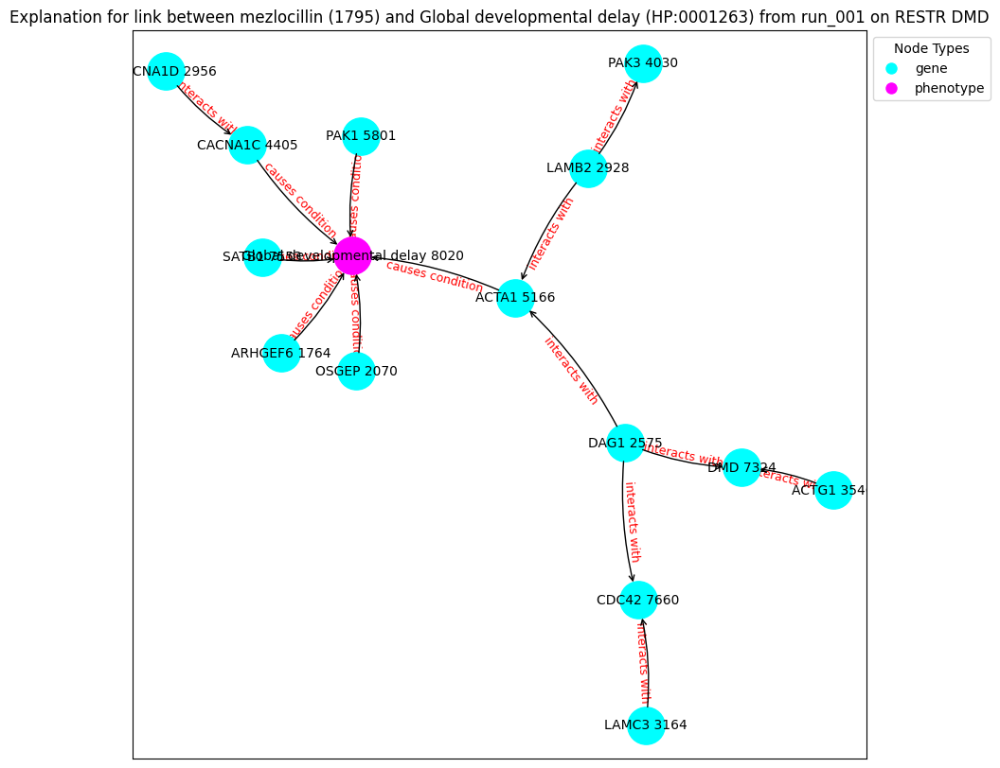

('ARHGEF6 1764', {'type': 'gene'})
('OSGEP 2070', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('CACNA1D 2956', {'type': 'gene'})
('LAMC3 3164', {'type': 'gene'})
('ACTG1 3546', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('CACNA1C 4405', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SATB1 7553', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('Global developmental delay 8020', {'type': 'phenotype'})
('ARHGEF6 1764', 'Global developmental delay 8020', {'label': 'causes condition'})
('OSGEP 2070', 'Global developmental delay 8020', {'label': 'causes condition'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'CDC42 7660', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('LAMB2 2928', 'PAK3 4030', {'label': 'interacts with'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('CACNA1D 2956', 'CACNA1C 4405

Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 319.66it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9841], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 345.40it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9841], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 338.85it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.2399], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 342.05it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.7283], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 350.81it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9776], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 339.24it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 335.93it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 336.64it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9998], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 331.68it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 331.33it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


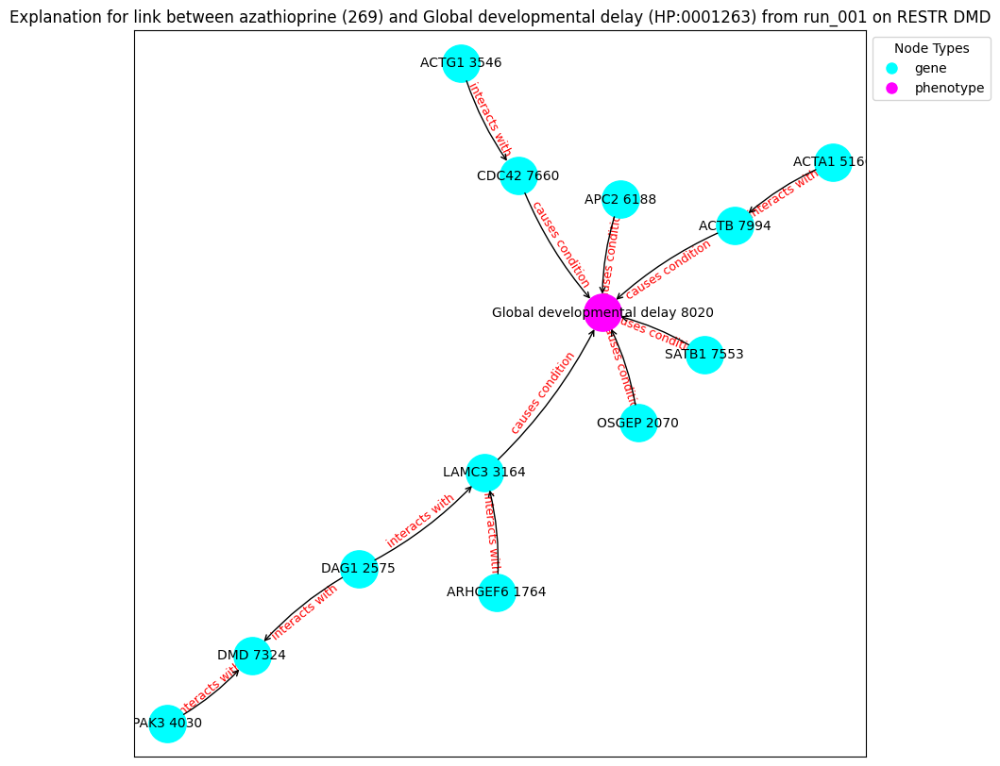

('ARHGEF6 1764', {'type': 'gene'})
('OSGEP 2070', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMC3 3164', {'type': 'gene'})
('ACTG1 3546', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('APC2 6188', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SATB1 7553', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('Global developmental delay 8020', {'type': 'phenotype'})
('ARHGEF6 1764', 'LAMC3 3164', {'label': 'interacts with'})
('OSGEP 2070', 'Global developmental delay 8020', {'label': 'causes condition'})
('DAG1 2575', 'LAMC3 3164', {'label': 'interacts with'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('LAMC3 3164', 'Global developmental delay 8020', {'label': 'causes condition'})
('ACTG1 3546', 'CDC42 7660', {'label': 'interacts with'})
('PAK3 4030', 'DMD 7324', {'label': 'interacts with'})
('ACTA1 5166', 'ACTB 7994', {'label': 'interacts with'})
('APC2 6188', 'Global developmental delay 802

Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 351.32it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9999], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 380.51it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9706], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 404.60it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9995], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 450.33it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8673], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 443.69it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9850], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 466.85it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9573], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 467.93it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9965], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 452.58it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9989], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 463.21it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6166], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 435.38it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


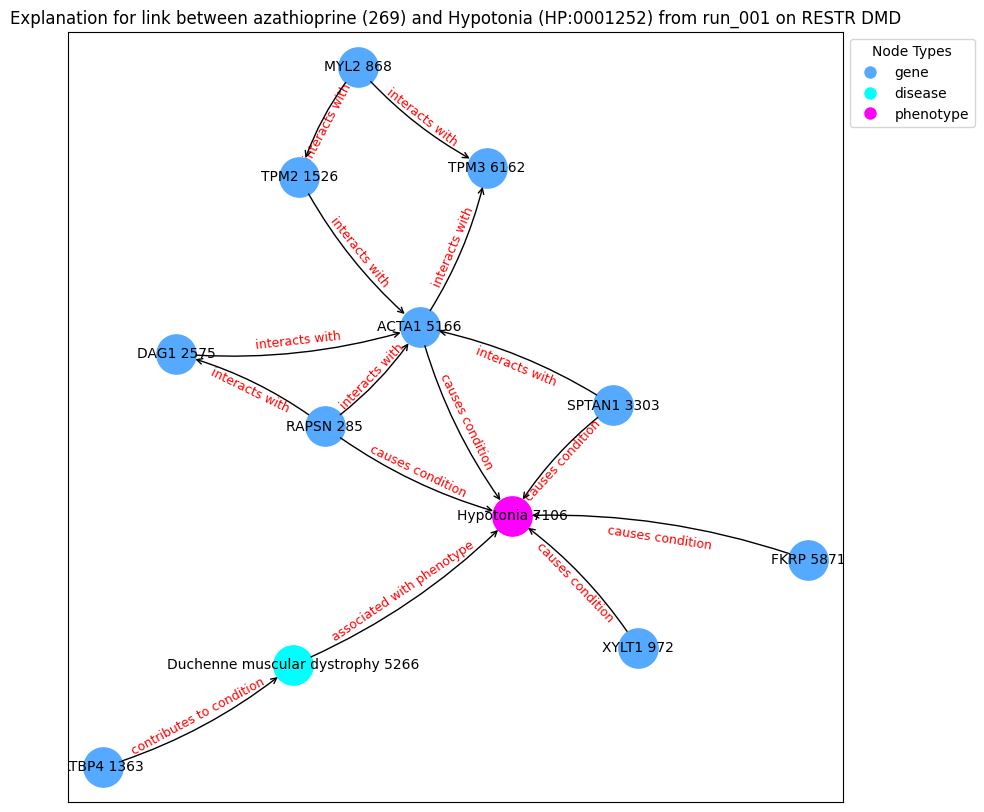

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('XYLT1 972', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SPTAN1 3303', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Hypotonia 7106', {'type': 'phenotype'})
('RAPSN 285', 'ACTA1 5166', {'label': 'interacts with'})
('RAPSN 285', 'Hypotonia 7106', {'label': 'causes condition'})
('RAPSN 285', 'DAG1 2575', {'label': 'interacts with'})
('MYL2 868', 'TPM2 1526', {'label': 'interacts with'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('XYLT1 972', 'Hypotonia 7106', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('SPTAN1 3303', 'ACTA1 5

Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 438.48it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7709], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 420.98it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8849], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 448.85it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9952], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 475.68it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.3920], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 452.05it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9749], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 430.59it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7649], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 443.64it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8686], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 463.98it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.5586], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 475.73it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.8534], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 427.79it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


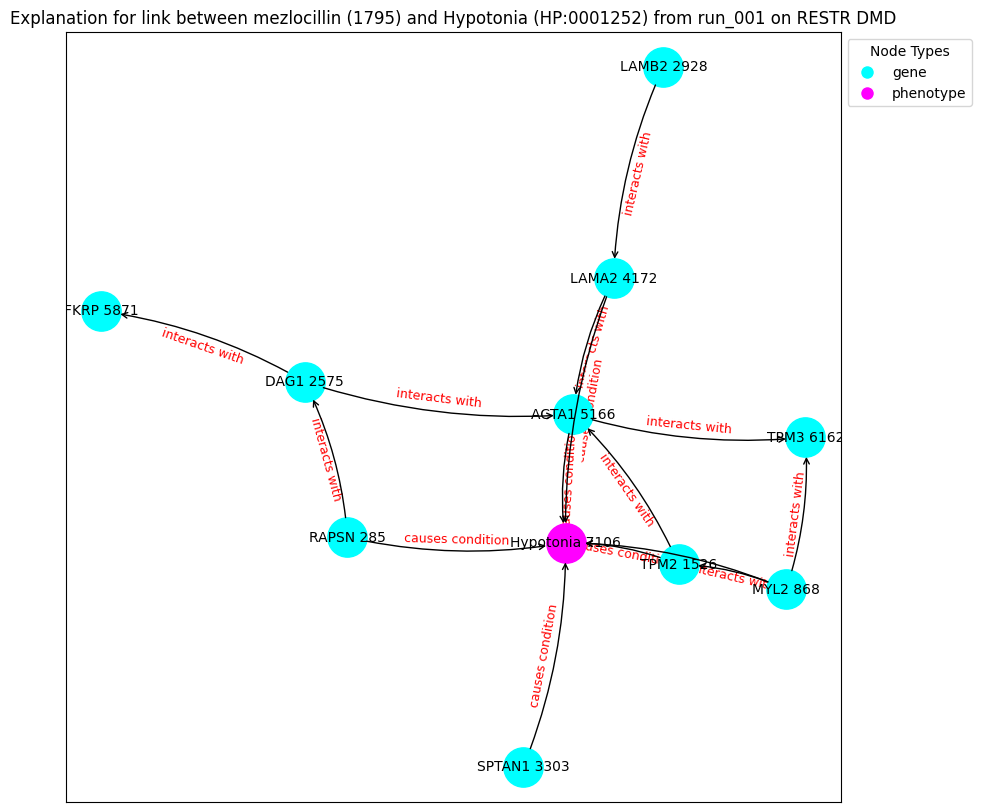

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SPTAN1 3303', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Hypotonia 7106', {'type': 'phenotype'})
('RAPSN 285', 'Hypotonia 7106', {'label': 'causes condition'})
('RAPSN 285', 'DAG1 2575', {'label': 'interacts with'})
('MYL2 868', 'Hypotonia 7106', {'label': 'causes condition'})
('MYL2 868', 'TPM2 1526', {'label': 'interacts with'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'Hypotonia 7106', {'label': 'causes condition'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('SPTAN1 3303', 'Hypotonia 7106', {'label': 'causes 

Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 499.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9955], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 491.39it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4813], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 510.41it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7856], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 485.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6162], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 489.16it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9756], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 538.69it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9968], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 531.16it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8409], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 497.66it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9630], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 512.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9673], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 511.61it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                         label  \
6618      6618  HP:0001328  phenotype  Specific learning disability   

      semantic_id  
6618            8  
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.4901], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 500.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8856], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 520.06it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9523], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 526.51it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3409], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 496.31it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8525], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 497.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8376], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 486.89it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7702], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 491.02it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5661], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 531.16it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8586], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 492.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8758], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 495.62it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                  label  semantic_id
9599      9599  HP:0001290  phenotype  Generalized hypotonia            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.9979], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 389.35it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9983], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 391.98it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9979], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 385.25it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9997], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 391.79it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 407.34it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9927], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 408.65it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8803], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 400.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9165], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 390.90it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9907], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 390.71it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9470], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 387.25it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


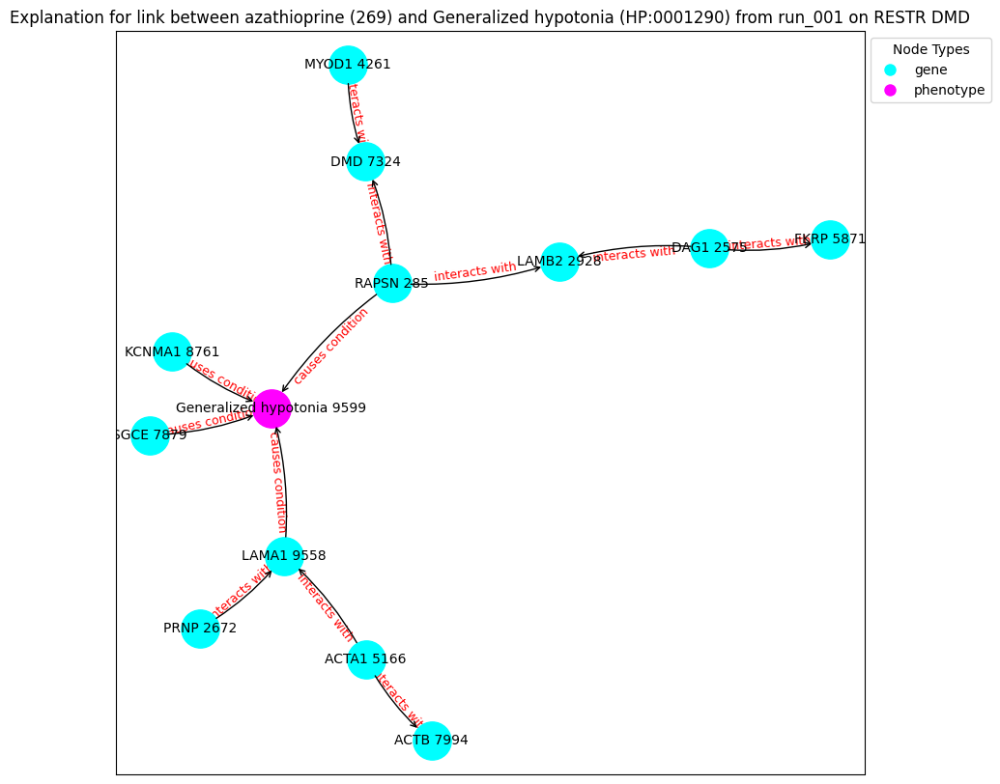

('RAPSN 285', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SGCE 7879', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('KCNMA1 8761', {'type': 'gene'})
('LAMA1 9558', {'type': 'gene'})
('Generalized hypotonia 9599', {'type': 'phenotype'})
('RAPSN 285', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('RAPSN 285', 'LAMB2 2928', {'label': 'interacts with'})
('RAPSN 285', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'LAMB2 2928', {'label': 'interacts with'})
('PRNP 2672', 'LAMA1 9558', {'label': 'interacts with'})
('MYOD1 4261', 'DMD 7324', {'label': 'interacts with'})
('ACTA1 5166', 'ACTB 7994', {'label': 'interacts with'})
('ACTA1 5166', 'LAMA1 9558', {'label': 'interacts with'})
('SGCE 7879', 'Generalized hy

Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 368.66it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9318], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 401.61it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9941], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 378.08it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9643], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 374.64it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9250], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 399.05it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9228], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 400.62it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9666], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 388.56it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.7053], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 384.25it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9907], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 396.14it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9934], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 403.06it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


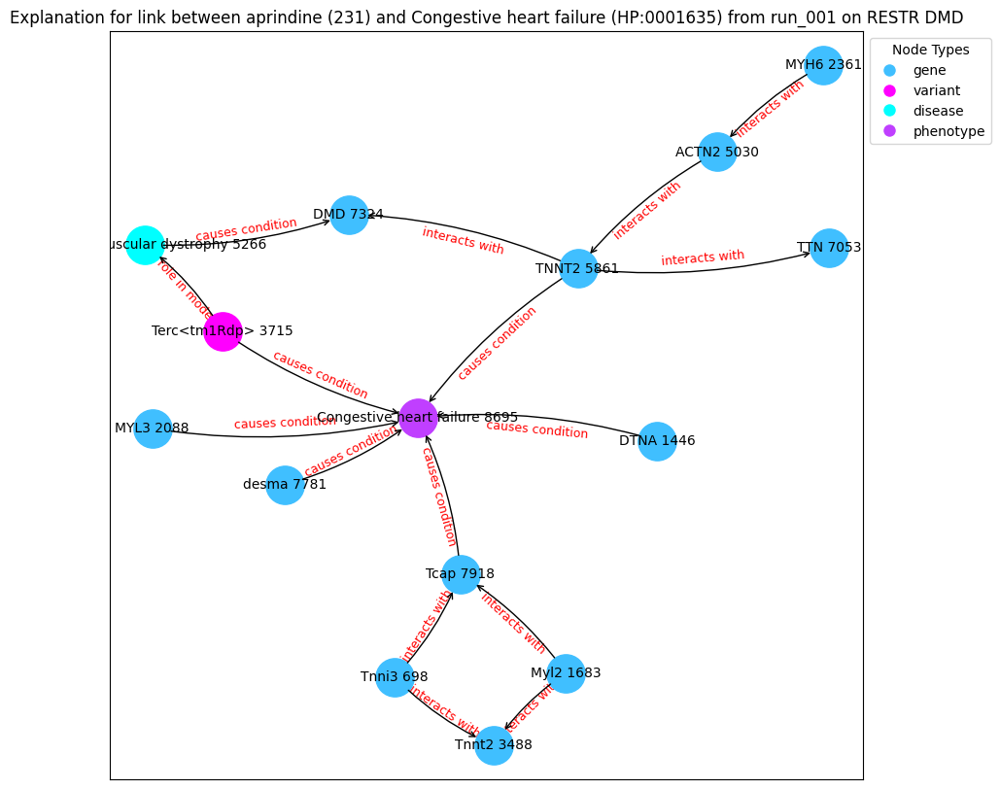

('Tnni3 698', {'type': 'gene'})
('DTNA 1446', {'type': 'gene'})
('Myl2 1683', {'type': 'gene'})
('MYL3 2088', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('Tnnt2 3488', {'type': 'gene'})
('Terc<tm1Rdp> 3715', {'type': 'variant'})
('ACTN2 5030', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('TNNT2 5861', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('desma 7781', {'type': 'gene'})
('Tcap 7918', {'type': 'gene'})
('Congestive heart failure 8695', {'type': 'phenotype'})
('Tnni3 698', 'Tcap 7918', {'label': 'interacts with'})
('Tnni3 698', 'Tnnt2 3488', {'label': 'interacts with'})
('DTNA 1446', 'Congestive heart failure 8695', {'label': 'causes condition'})
('Myl2 1683', 'Tcap 7918', {'label': 'interacts with'})
('Myl2 1683', 'Tnnt2 3488', {'label': 'interacts with'})
('MYL3 2088', 'Congestive heart failure 8695', {'label': 'causes condition'})
('MYH6 2361', 'ACTN2 5030', {'label': 'interacts with'})
('Terc<tm1Rdp> 37

Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 444.40it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9989], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 461.16it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8422], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 442.64it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.7429], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 450.76it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9717], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 456.50it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8211], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 446.23it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8523], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 437.53it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5735], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 485.76it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8706], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 432.01it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9867], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 441.44it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


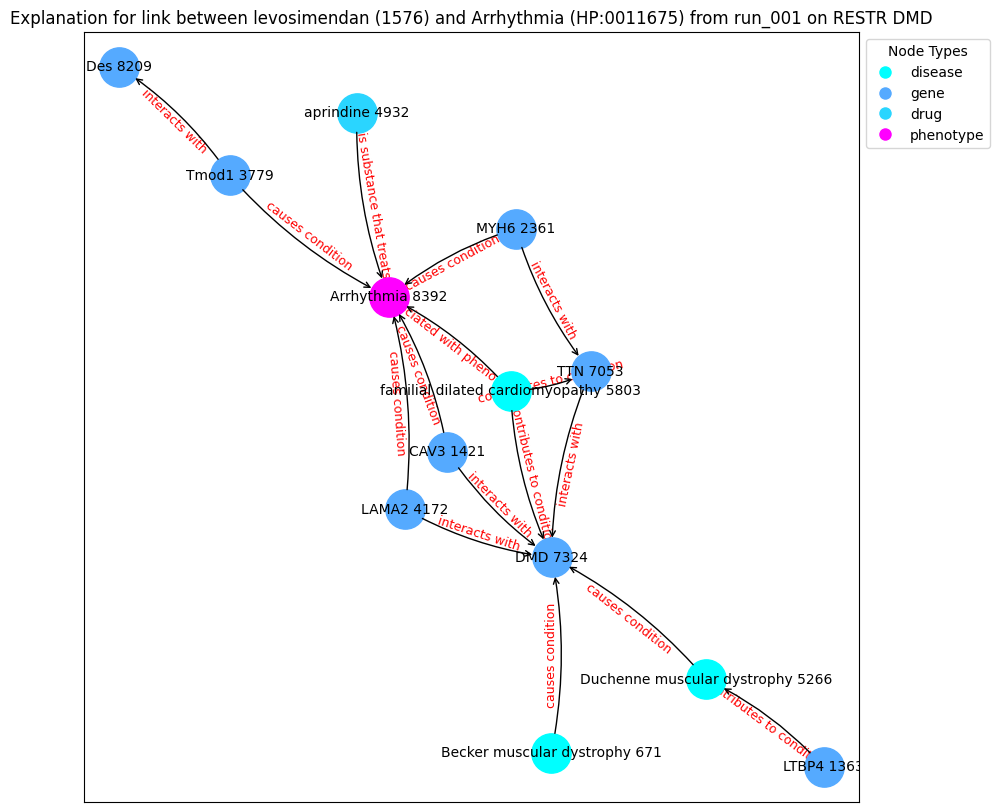

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('CAV3 1421', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('Tmod1 3779', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('aprindine 4932', {'type': 'drug'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('familial dilated cardiomyopathy 5803', {'type': 'disease'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Des 8209', {'type': 'gene'})
('Arrhythmia 8392', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('CAV3 1421', 'Arrhythmia 8392', {'label': 'causes condition'})
('CAV3 1421', 'DMD 7324', {'label': 'interacts with'})
('MYH6 2361', 'Arrhythmia 8392', {'label': 'causes condition'})
('MYH6 2361', 'TTN 7053', {'label': 'interacts with'})
('Tmod1 3779', 'Arrhythmia 8392', {'label': 'causes condition'})
('Tmod1 3779', 'Des

Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 508.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2717], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 508.47it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5074], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 507.29it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9748], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 511.38it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1913], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 484.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9935], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 491.97it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6732], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 516.60it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6768], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 381.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9727], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 511.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2031], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 460.59it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic        label  semantic_id
3220      3220  HP:0003391  phenotype  Gowers sign            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.8755], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 473.16it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9348], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 492.60it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9862], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 486.50it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7860], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 467.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9898], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 498.35it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7535], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 527.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8057], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 427.12it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7718], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 408.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9610], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 501.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8789], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 496.44it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
5066      5066  HP:0003115  phenotype  Abnormal EKG            8
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.8871], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 473.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9758], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 492.41it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7385], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 470.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7796], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 542.35it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0736], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 504.40it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9098], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 512.43it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8031], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 515.40it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6412], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 485.47it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7631], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 514.87it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8551], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 463.13it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
5066      5066  HP:0003115  phenotype  Abnormal EKG            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.8351], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 523.77it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4356], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 533.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9828], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 521.54it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9390], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 521.18it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7490], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 511.93it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9774], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 494.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9854], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 509.99it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8988], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 489.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4242], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 496.54it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6154], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 487.02it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                label  semantic_id
3548      3548  HP:0001371  phenotype  Flexion contracture            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.9826], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 459.69it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9190], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 484.14it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9992], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 515.06it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 499.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2763], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 515.04it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9814], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 528.80it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9718], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 456.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9470], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 514.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9811], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 498.16it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9924], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 458.32it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                label  semantic_id
3548      3548  HP:0001371  phenotype  Flexion contracture            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9741], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 478.15it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9966], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 514.67it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8258], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 477.43it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9478], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 448.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9586], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 463.15it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9328], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 471.11it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9540], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 500.80it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9624], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 465.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9979], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 493.16it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8869], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 469.18it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic  \
10260     10260  HP:0003236  phenotype   

                                                   label  semantic_id  
10260  Elevated circulating creatine kinase concentra...            8  
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.9981], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 329.92it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.9947], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 329.42it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 334.33it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.9962], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 342.29it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9623], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 341.17it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9708], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 338.70it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9950], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 328.63it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9939], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 303.71it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9981], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 327.58it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.9913], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 340.05it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


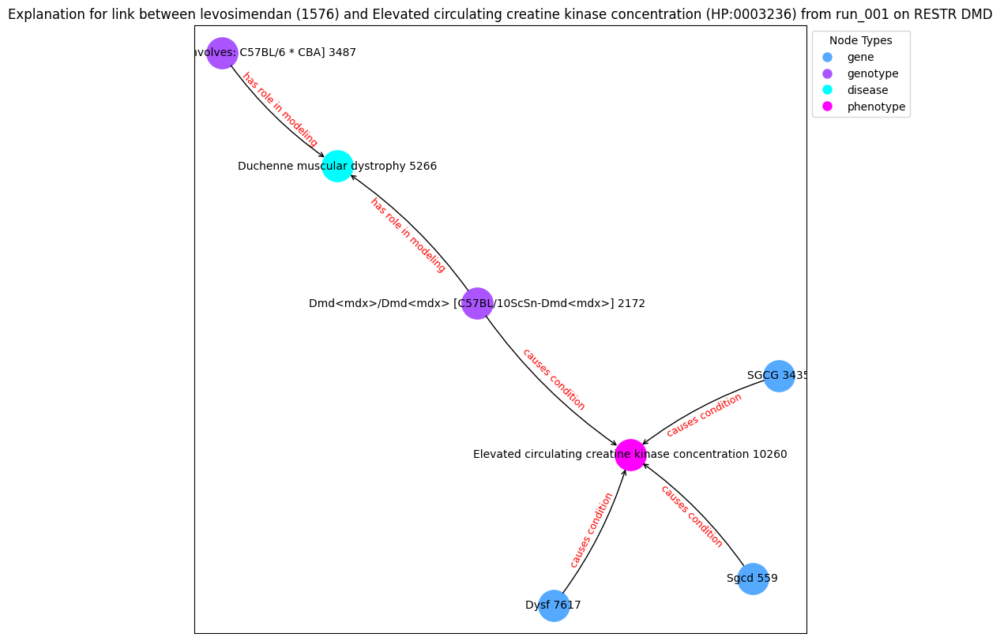

('Sgcd 559', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', {'type': 'genotype'})
('SGCG 3435', {'type': 'gene'})
('Dmd<em#Tve> [involves: C57BL/6 * CBA] 3487', {'type': 'genotype'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Dysf 7617', {'type': 'gene'})
('Elevated circulating creatine kinase concentration 10260', {'type': 'phenotype'})
('Sgcd 559', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', 'Duchenne muscular dystrophy 5266', {'label': 'has role in modeling'})
('SGCG 3435', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('Dmd<em#Tve> [involves: C57BL/6 * CBA] 3487', 'Duchenne muscular dystrophy 5266', {'label': 'has role in modeling'})
('Dysf 7617', 'Elevated circul

Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 322.77it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9983], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 329.19it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9999], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 332.81it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9606], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 334.61it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9509], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 310.27it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5136], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 294.83it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9662], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 319.26it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9574], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 335.90it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9355], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 342.90it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9808], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 319.34it/s]


Contribution threshold is tensor(0.9940)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


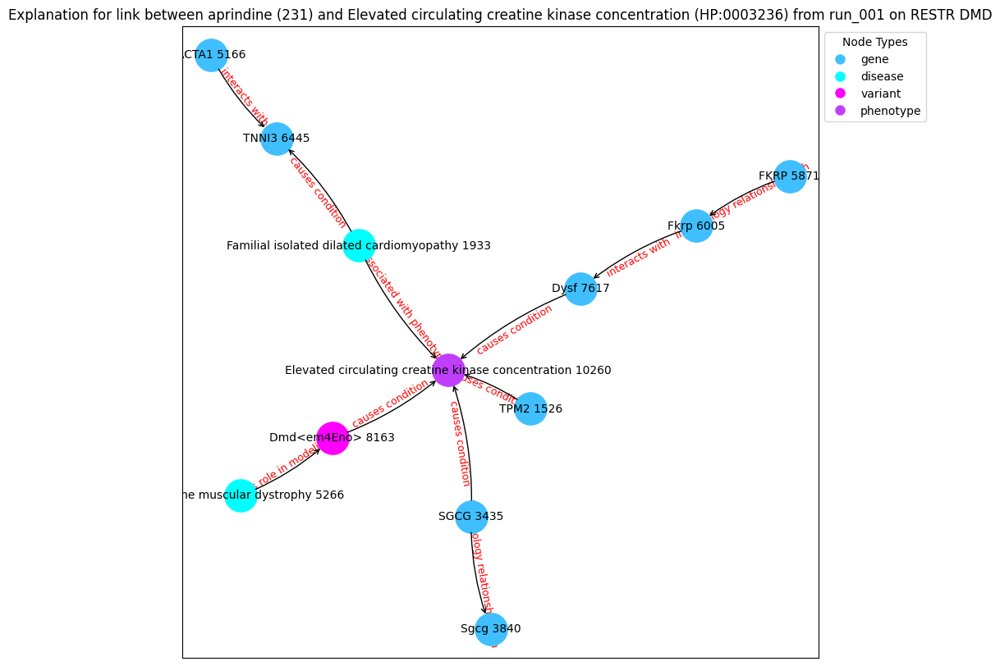

('TPM2 1526', {'type': 'gene'})
('Familial isolated dilated cardiomyopathy 1933', {'type': 'disease'})
('SGCG 3435', {'type': 'gene'})
('Sgcg 3840', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('Fkrp 6005', {'type': 'gene'})
('TNNI3 6445', {'type': 'gene'})
('Dysf 7617', {'type': 'gene'})
('Dmd<em4Eno> 8163', {'type': 'variant'})
('Elevated circulating creatine kinase concentration 10260', {'type': 'phenotype'})
('TPM2 1526', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('Familial isolated dilated cardiomyopathy 1933', 'TNNI3 6445', {'label': 'causes condition'})
('Familial isolated dilated cardiomyopathy 1933', 'Elevated circulating creatine kinase concentration 10260', {'label': 'associated with phenotype'})
('SGCG 3435', 'Sgcg 3840', {'label': 'in orthology relationship with'})
('SGCG 3435', 'Elevated circulating creatine kinase concentration

Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 302.97it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.4555], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 325.00it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9039], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 280.44it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8284], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 298.64it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0693], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 307.84it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5761], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 296.14it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.6908], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 309.55it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.4994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 325.32it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.6845], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 336.15it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8954], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 335.09it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


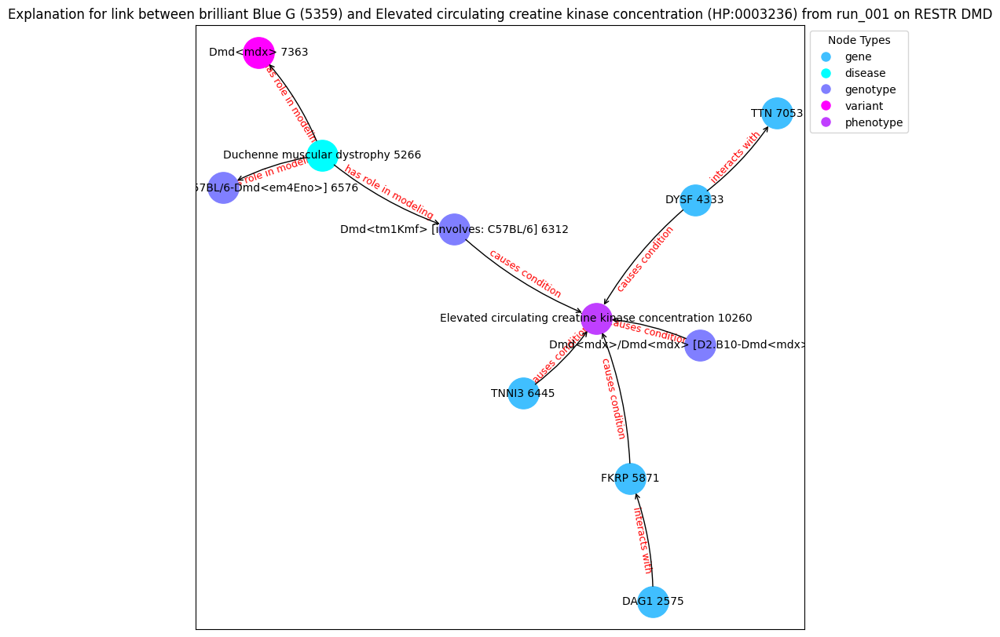

('DAG1 2575', {'type': 'gene'})
('DYSF 4333', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('Dmd<tm1Kmf> [involves: C57BL/6] 6312', {'type': 'genotype'})
('TNNI3 6445', {'type': 'gene'})
('Dmd<em4Eno> [C57BL/6-Dmd<em4Eno>] 6576', {'type': 'genotype'})
('TTN 7053', {'type': 'gene'})
('Dmd<mdx> 7363', {'type': 'variant'})
('Dmd<mdx>/Dmd<mdx> [D2.B10-Dmd<mdx>/J] 8330', {'type': 'genotype'})
('Elevated circulating creatine kinase concentration 10260', {'type': 'phenotype'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DYSF 4333', 'TTN 7053', {'label': 'interacts with'})
('DYSF 4333', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('Duchenne muscular dystrophy 5266', 'Dmd<tm1Kmf> [involves: C57BL/6] 6312', {'label': 'has role in modeling'})
('Duchenne muscular dystrophy 5266', 'Dmd<mdx> 7363', {'label': 'has role in modeling'})
('Duchenne muscular dystrophy 5266', 'Dmd<em4

Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 430.20it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8718], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 455.76it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9706], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 431.44it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9902], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 450.46it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9765], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 460.80it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8413], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 435.06it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9970], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 433.70it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.4950], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 446.20it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8448], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 439.12it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5109], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 420.58it/s]


Contribution threshold is tensor(0.0062)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


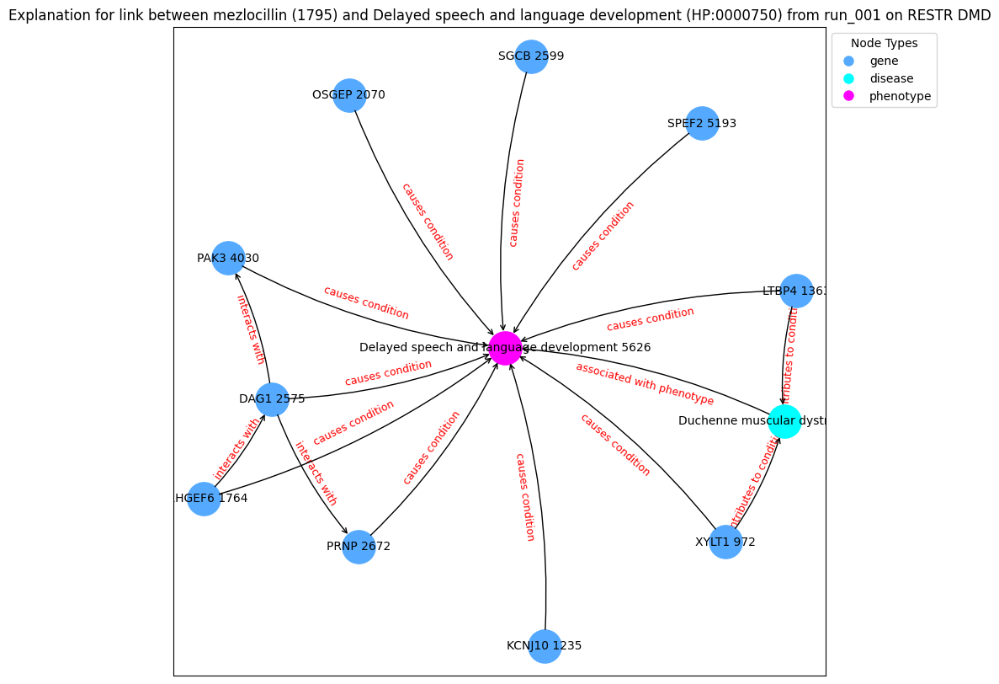

('XYLT1 972', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('ARHGEF6 1764', {'type': 'gene'})
('OSGEP 2070', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('SPEF2 5193', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Delayed speech and language development 5626', {'type': 'phenotype'})
('XYLT1 972', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('XYLT1 972', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('KCNJ10 1235', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('ARHGEF6 1764', 'DAG1 2575', {'label': 'interacts with'})
('ARHGEF6 1764', 'Dela

Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 498.02it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 553.33it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 493.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 528.41it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 509.59it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 534.19it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 515.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 569.18it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 518.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 533.16it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic               label  semantic_id
9362      9362  HP:0003560  phenotype  Muscular dystrophy            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9852], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 342.02it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8505], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 341.54it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9458], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 351.71it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9929], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 341.90it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9904], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 354.07it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9226], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 330.72it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9732], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 342.42it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9993], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 339.72it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8878], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 350.52it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9288], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 347.32it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


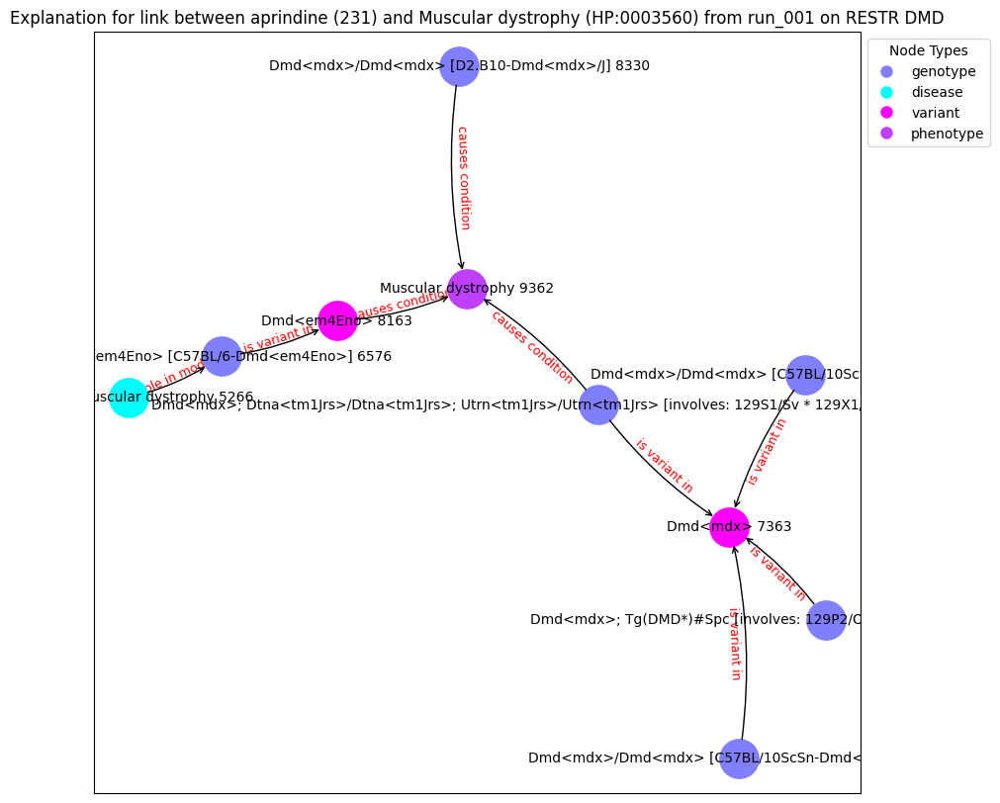

('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', {'type': 'genotype'})
('Dmd<mdx>; Dtna<tm1Jrs>/Dtna<tm1Jrs>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 3940', {'type': 'genotype'})
('Dmd<mdx>; Tg(DMD*)#Spc [involves: 129P2/OlaHsd * C57BL/10ScSn * DBA/2] 5186', {'type': 'genotype'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 6302', {'type': 'genotype'})
('Dmd<em4Eno> [C57BL/6-Dmd<em4Eno>] 6576', {'type': 'genotype'})
('Dmd<mdx> 7363', {'type': 'variant'})
('Dmd<em4Eno> 8163', {'type': 'variant'})
('Dmd<mdx>/Dmd<mdx> [D2.B10-Dmd<mdx>/J] 8330', {'type': 'genotype'})
('Muscular dystrophy 9362', {'type': 'phenotype'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', 'Dmd<mdx> 7363', {'label': 'is variant in'})
('Dmd<mdx>; Dtna<tm1Jrs>/Dtna<tm1Jrs>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 3940', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('Dmd<mdx>

Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:02<00:00, 332.19it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9703], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:02<00:00, 304.80it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9720], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:02<00:00, 332.80it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5403], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 352.77it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9607], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:02<00:00, 344.99it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9650], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 350.69it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9945], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:02<00:00, 343.24it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9121], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 360.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9180], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 361.35it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5219], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 350.76it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


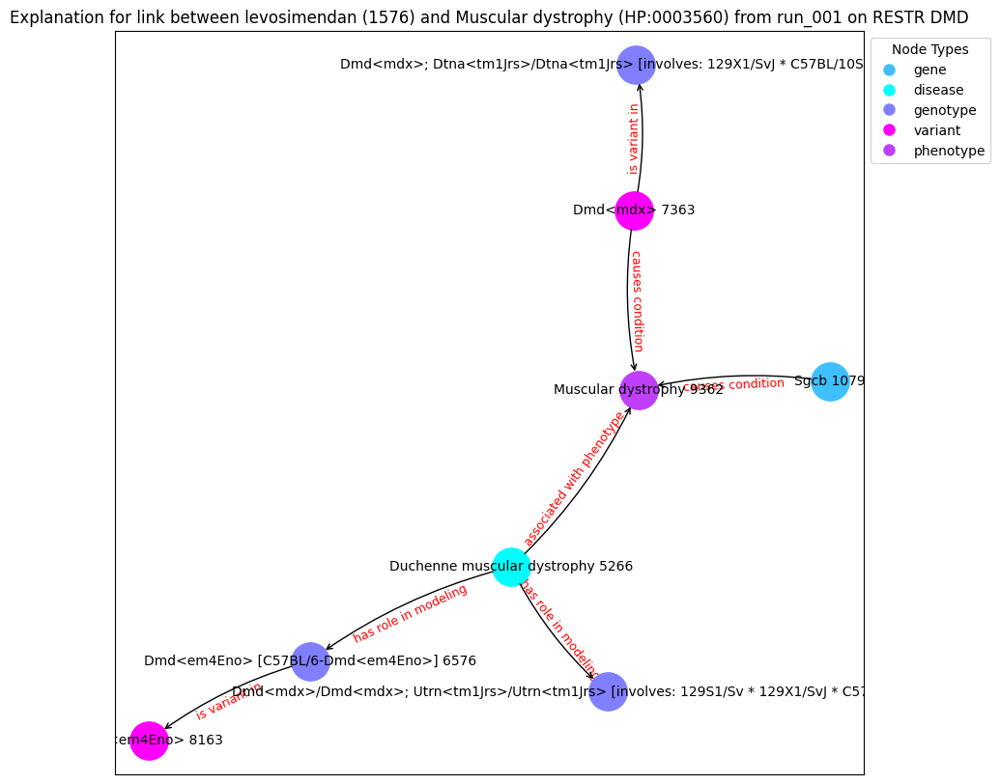

('Sgcb 1079', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Dmd<mdx>/Dmd<mdx>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 6430', {'type': 'genotype'})
('Dmd<em4Eno> [C57BL/6-Dmd<em4Eno>] 6576', {'type': 'genotype'})
('Dmd<mdx> 7363', {'type': 'variant'})
('Dmd<em4Eno> 8163', {'type': 'variant'})
('Dmd<mdx>; Dtna<tm1Jrs>/Dtna<tm1Jrs> [involves: 129X1/SvJ * C57BL/10ScSn] 9076', {'type': 'genotype'})
('Muscular dystrophy 9362', {'type': 'phenotype'})
('Sgcb 1079', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('Duchenne muscular dystrophy 5266', 'Dmd<mdx>/Dmd<mdx>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 6430', {'label': 'has role in modeling'})
('Duchenne muscular dystrophy 5266', 'Muscular dystrophy 9362', {'label': 'associated with phenotype'})
('Duchenne muscular dystrophy 5266', 'Dmd<em4Eno> [C57BL/6-Dmd<em4Eno>] 6576', {'label': 'has role in modeling'})
('Dmd<em4Eno> [C57BL/6

Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 463.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3911], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 544.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3573], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 503.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9002], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 541.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1501], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 494.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9430], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 446.44it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8853], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 518.48it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9783], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 538.02it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9964], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 504.67it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9962], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 508.06it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                      label  semantic_id
2062      2062  HP:0002093  phenotype  Respiratory insufficiency            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9855], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 473.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9736], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 477.07it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7667], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 507.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9184], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 458.24it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9888], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 484.67it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9864], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 480.02it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9591], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 465.94it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9746], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 475.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9916], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 509.60it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8629], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 507.20it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                      label  semantic_id
2062      2062  HP:0002093  phenotype  Respiratory insufficiency            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.8834], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 487.50it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9987], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 465.94it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9962], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 486.21it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9890], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 464.68it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9770], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 496.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9917], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 490.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 510.13it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9987], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 492.46it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9852], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 473.52it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8650], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 467.66it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                    label  semantic_id
1436      1436  HP:0003202  phenotype  Skeletal muscle atrophy            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9660], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 504.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0661], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 479.54it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1502], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 497.89it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4335], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 497.60it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9960], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 507.76it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9907], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 477.04it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9707], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 524.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9117], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 522.44it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7969], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 490.93it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3495], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 509.13it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
7346      7346  HP:0001265  phenotype  Hyporeflexia            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.9609], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 443.37it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9858], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 460.80it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9921], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 454.76it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9854], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 461.58it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.7776], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 457.02it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9742], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 467.71it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9285], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 478.38it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9717], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 473.79it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9768], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 452.93it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9842], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 434.56it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


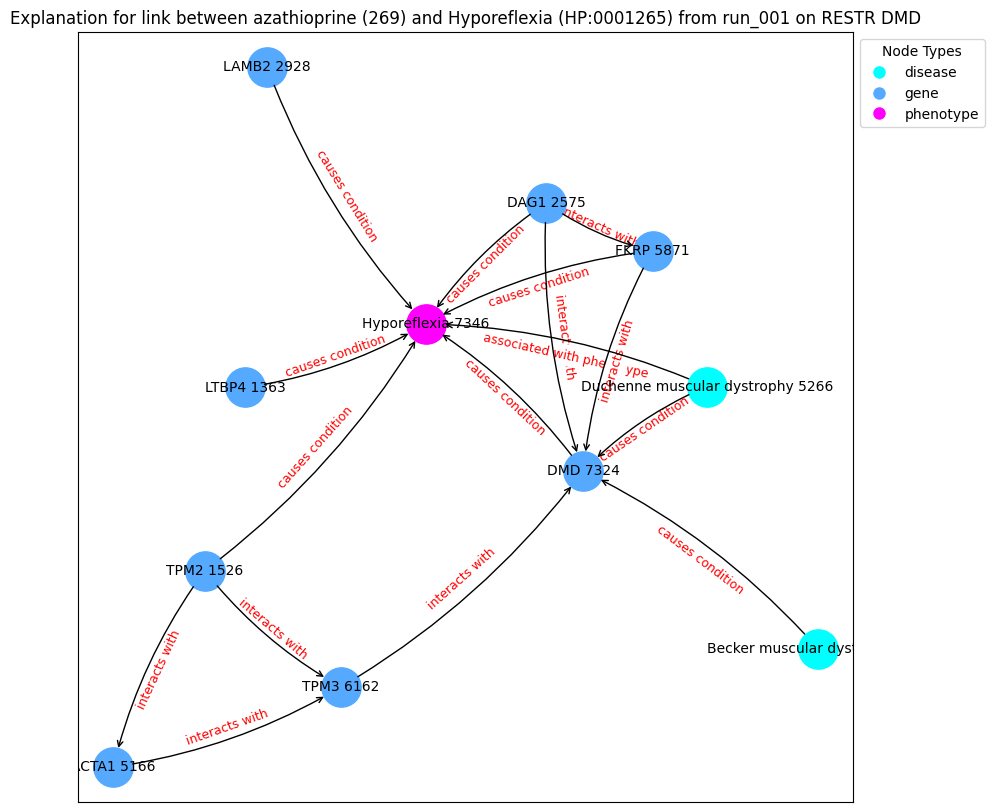

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('TPM2 1526', 'Hyporeflexia 7346', {'label': 'causes condition'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'Hyporeflexia 7346', {'label': 'causes condition'})
('ACTA1 5166', 'T

Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 436.48it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9562], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 447.00it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8895], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 459.87it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.7863], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 477.60it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8561], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 492.40it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.6148], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 454.79it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9264], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 440.61it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9242], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 466.90it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.3636], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 437.00it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.4847], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 444.07it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


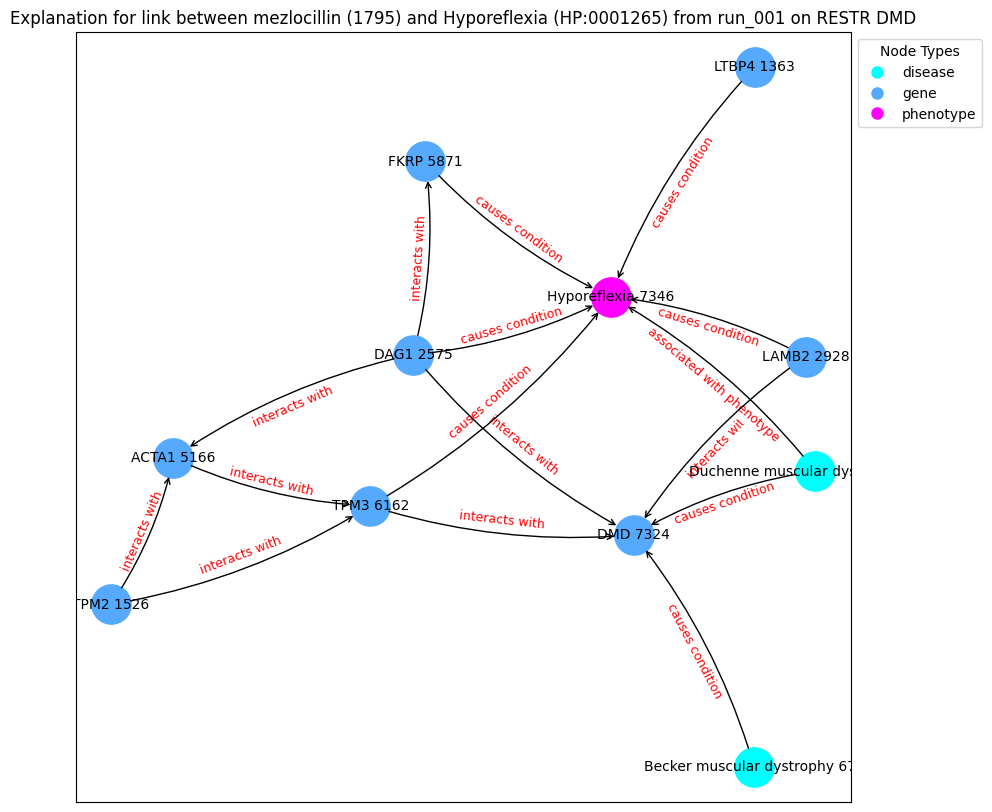

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'DMD 7324',

Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 422.35it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.3214], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 474.30it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9361], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 440.96it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9783], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 444.03it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9962], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 473.93it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9645], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 467.66it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9795], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 451.44it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.3697], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 479.11it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8591], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 440.18it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9902], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 4932: 100%|██████████| 700/700 [00:01<00:00, 447.37it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


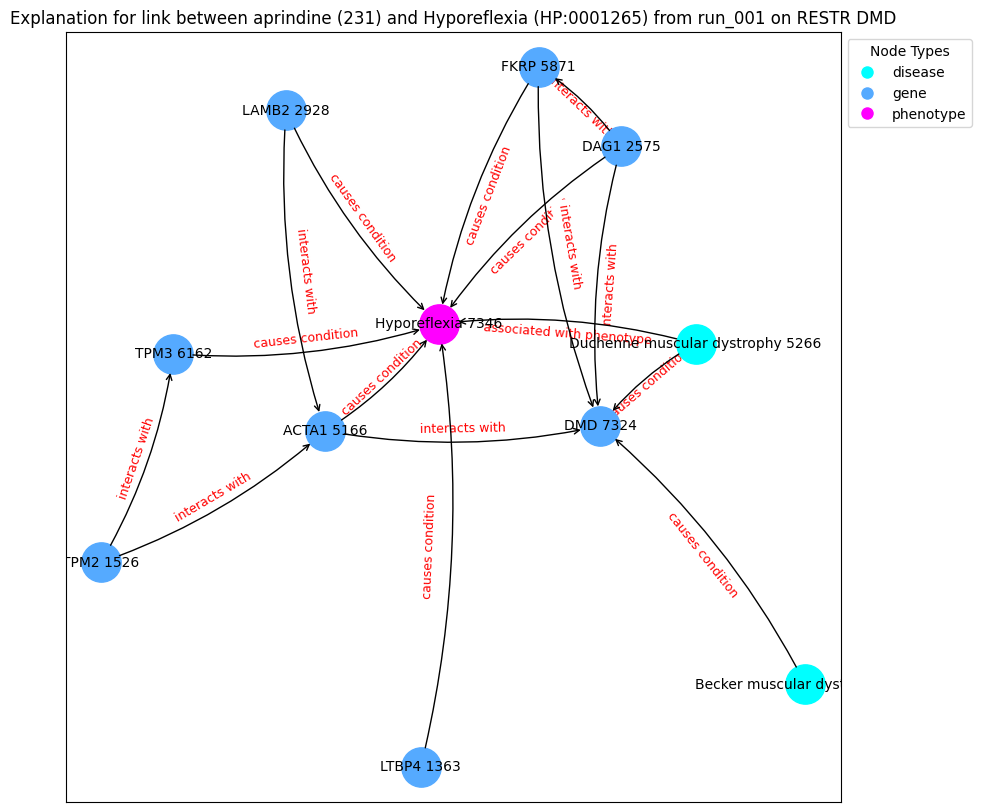

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('ACTA1 5166', 'DMD 7324'

Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:02<00:00, 344.86it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9925], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 373.79it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9999], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 357.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9673], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 357.85it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9913], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 378.71it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9976], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 382.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8626], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 355.85it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 355.35it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9964], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 370.53it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9939], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 361.71it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


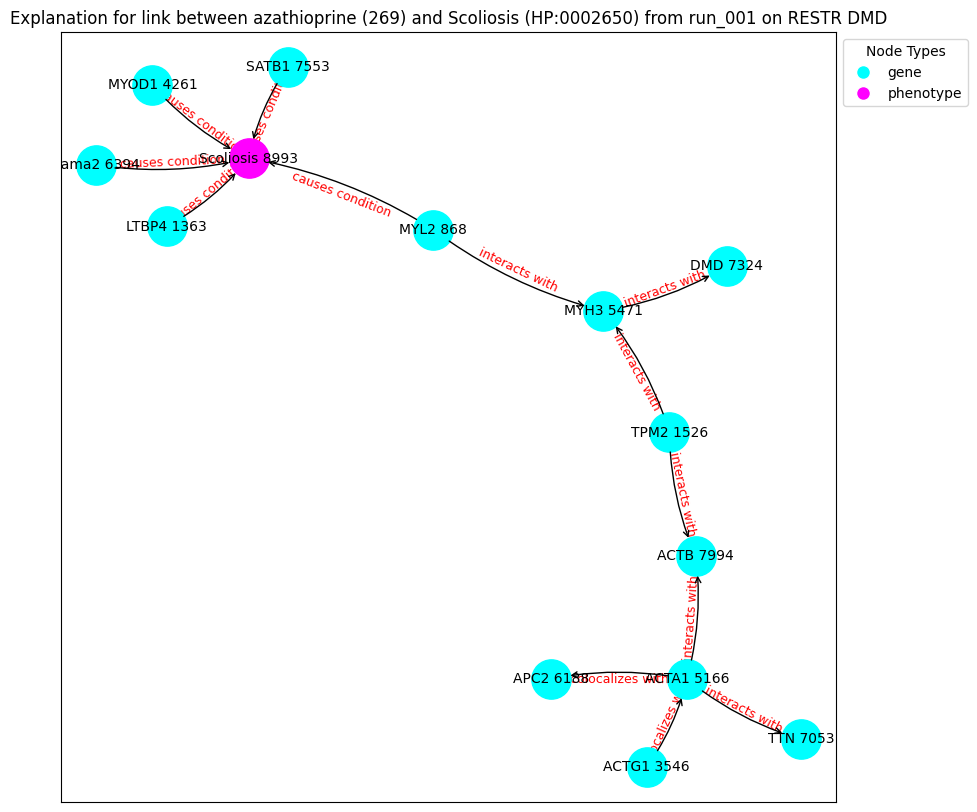

('MYL2 868', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('ACTG1 3546', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('MYH3 5471', {'type': 'gene'})
('APC2 6188', {'type': 'gene'})
('Lama2 6394', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SATB1 7553', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('Scoliosis 8993', {'type': 'phenotype'})
('MYL2 868', 'MYH3 5471', {'label': 'interacts with'})
('MYL2 868', 'Scoliosis 8993', {'label': 'causes condition'})
('LTBP4 1363', 'Scoliosis 8993', {'label': 'causes condition'})
('TPM2 1526', 'ACTB 7994', {'label': 'interacts with'})
('TPM2 1526', 'MYH3 5471', {'label': 'interacts with'})
('ACTG1 3546', 'ACTA1 5166', {'label': 'colocalizes with'})
('MYOD1 4261', 'Scoliosis 8993', {'label': 'causes condition'})
('ACTA1 5166', 'ACTB 7994', {'label': 'interacts with'})
('ACTA1 5166', 'TTN 7053', {'label': 'interacts with'})
('ACTA1 5

Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:02<00:00, 336.95it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9820], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 385.22it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9887], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 369.32it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.3829], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 382.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9372], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 374.57it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9980], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 372.80it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8410], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 356.58it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9975], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:02<00:00, 326.47it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9627], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 360.29it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9912], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 361.83it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


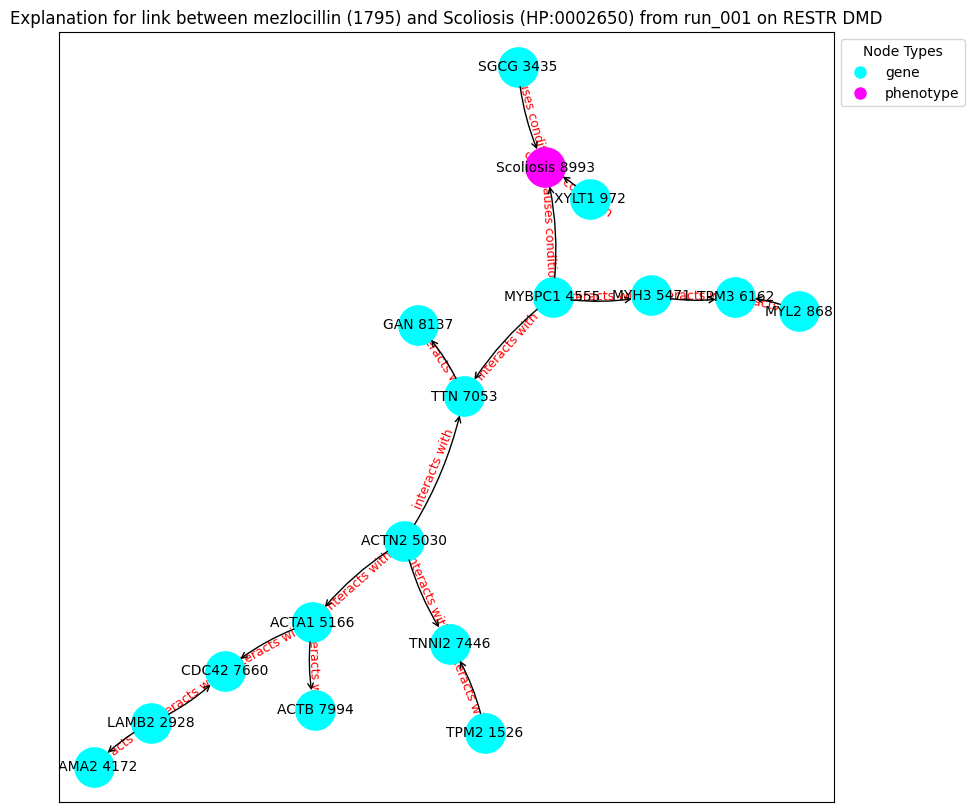

('MYL2 868', {'type': 'gene'})
('XYLT1 972', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('MYBPC1 4555', {'type': 'gene'})
('ACTN2 5030', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('MYH3 5471', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('TNNI2 7446', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('GAN 8137', {'type': 'gene'})
('Scoliosis 8993', {'type': 'phenotype'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('XYLT1 972', 'Scoliosis 8993', {'label': 'causes condition'})
('TPM2 1526', 'TNNI2 7446', {'label': 'interacts with'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('LAMB2 2928', 'CDC42 7660', {'label': 'interacts with'})
('SGCG 3435', 'Scoliosis 8993', {'label': 'causes condition'})
('MYBPC1 4555', 'Scoliosis 8993', {'label': 'causes condition'})
('MYBPC1 4555', 'TTN 7

Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 372.21it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9912], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 409.71it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9921], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 390.23it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9923], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 444.38it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9849], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 408.57it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 419.85it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8416], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 432.16it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 426.60it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9897], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 411.67it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8872], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 399.59it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


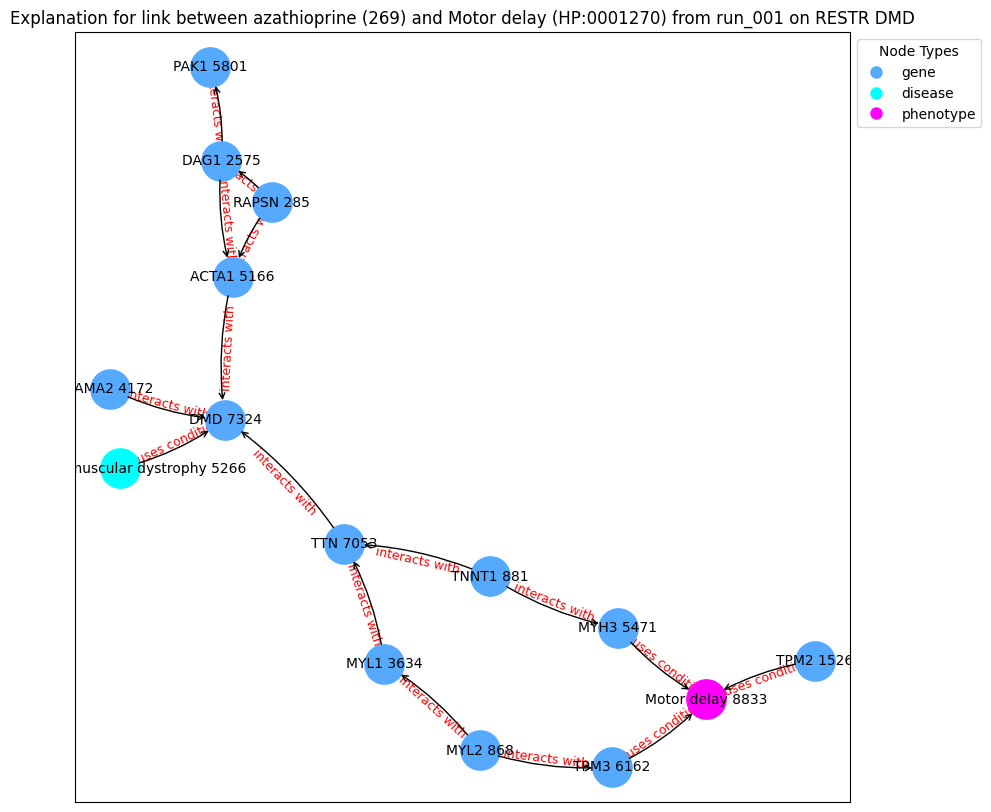

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('TNNT1 881', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('MYL1 3634', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('MYH3 5471', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Motor delay 8833', {'type': 'phenotype'})
('RAPSN 285', 'ACTA1 5166', {'label': 'interacts with'})
('RAPSN 285', 'DAG1 2575', {'label': 'interacts with'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('MYL2 868', 'MYL1 3634', {'label': 'interacts with'})
('TNNT1 881', 'MYH3 5471', {'label': 'interacts with'})
('TNNT1 881', 'TTN 7053', {'label': 'interacts with'})
('TPM2 1526', 'Motor delay 8833', {'label': 'causes condition'})
('DAG1 2575', 'PAK1 5801', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', 

Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 409.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9850], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 433.72it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9553], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 451.55it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8399], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 397.04it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9785], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 415.84it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.4963], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 397.93it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.6160], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 402.22it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.7630], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 419.00it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9222], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 433.03it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9111], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 428.32it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


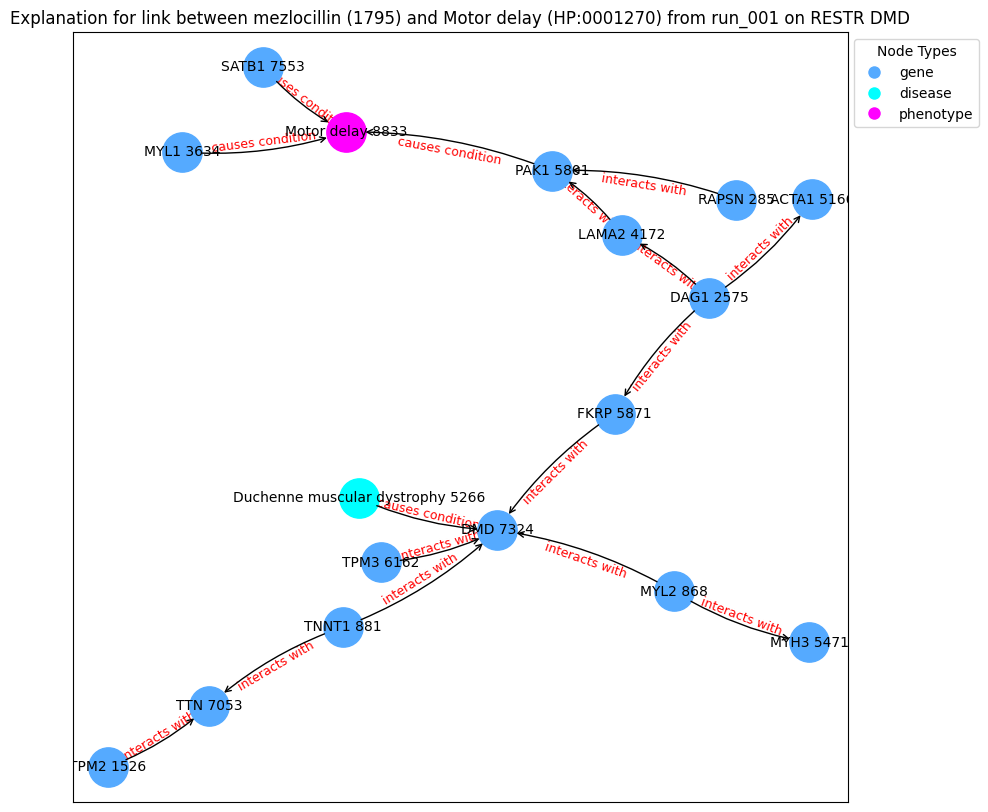

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('TNNT1 881', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('MYL1 3634', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('MYH3 5471', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SATB1 7553', {'type': 'gene'})
('Motor delay 8833', {'type': 'phenotype'})
('RAPSN 285', 'PAK1 5801', {'label': 'interacts with'})
('MYL2 868', 'DMD 7324', {'label': 'interacts with'})
('MYL2 868', 'MYH3 5471', {'label': 'interacts with'})
('TNNT1 881', 'TTN 7053', {'label': 'interacts with'})
('TNNT1 881', 'DMD 7324', {'label': 'interacts with'})
('TPM2 1526', 'TTN 7053', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'la

Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 367.70it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9948], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 422.29it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9296], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 436.20it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9987], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 419.59it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9927], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 405.31it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9925], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 403.99it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9765], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 409.75it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9932], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 392.32it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9713], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 432.49it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8989], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 416.17it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


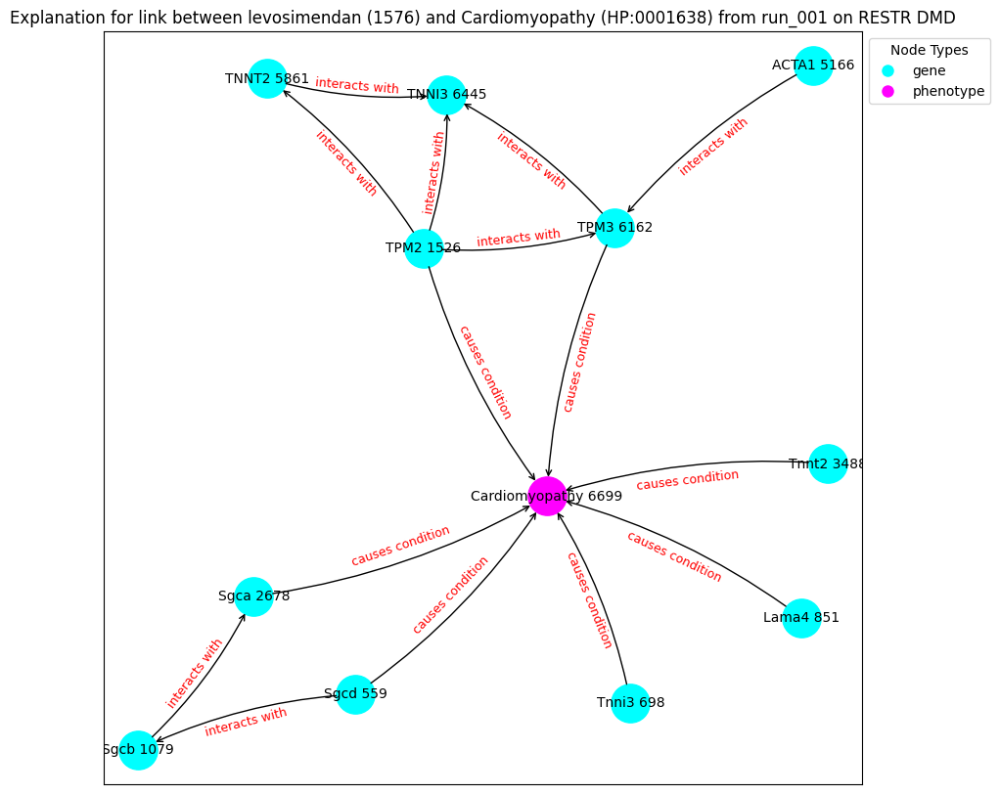

('Sgcd 559', {'type': 'gene'})
('Tnni3 698', {'type': 'gene'})
('Lama4 851', {'type': 'gene'})
('Sgcb 1079', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('Sgca 2678', {'type': 'gene'})
('Tnnt2 3488', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('TNNT2 5861', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TNNI3 6445', {'type': 'gene'})
('Cardiomyopathy 6699', {'type': 'phenotype'})
('Sgcd 559', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Sgcd 559', 'Sgcb 1079', {'label': 'interacts with'})
('Tnni3 698', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Lama4 851', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Sgcb 1079', 'Sgca 2678', {'label': 'interacts with'})
('TPM2 1526', 'TNNT2 5861', {'label': 'interacts with'})
('TPM2 1526', 'TNNI3 6445', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('TPM2 1526', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Sgca 2678', 'Cardiomyopathy 6699', {'label':

Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 395.37it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9586], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 420.98it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8504], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 416.74it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8604], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 410.10it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9936], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 410.94it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 414.56it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9986], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 406.64it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9799], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 402.39it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9959], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 399.97it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9808], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 445.61it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


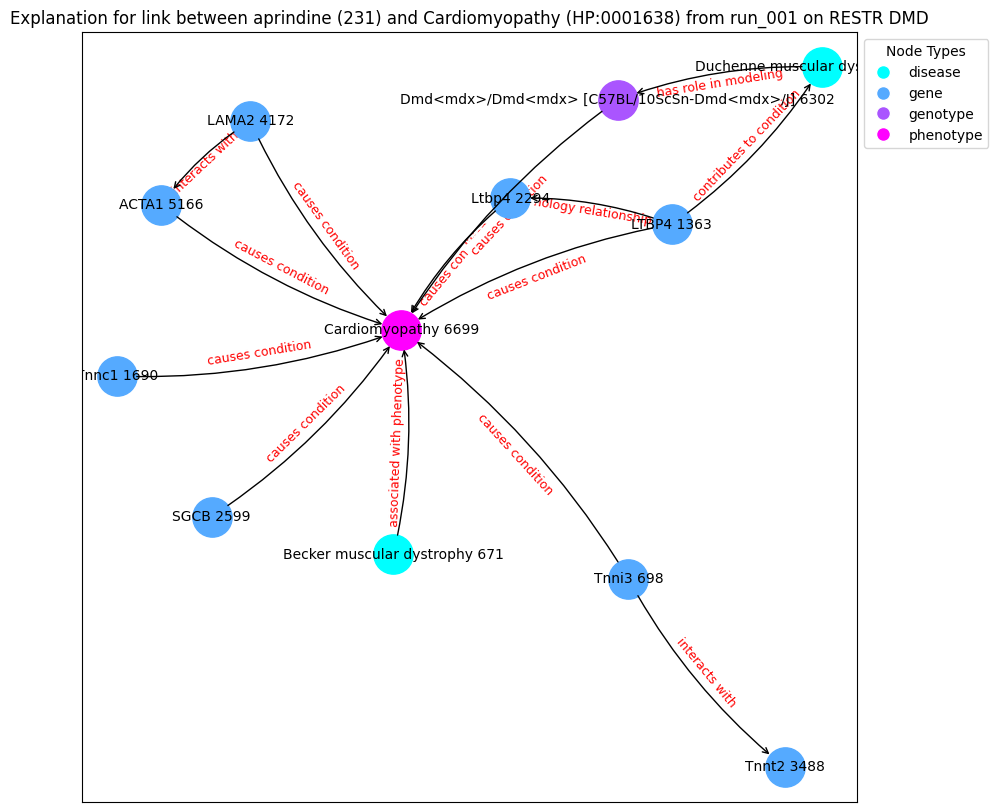

('Becker muscular dystrophy 671', {'type': 'disease'})
('Tnni3 698', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('Tnnc1 1690', {'type': 'gene'})
('Ltbp4 2294', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('Tnnt2 3488', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 6302', {'type': 'genotype'})
('Cardiomyopathy 6699', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Cardiomyopathy 6699', {'label': 'associated with phenotype'})
('Tnni3 698', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Tnni3 698', 'Tnnt2 3488', {'label': 'interacts with'})
('LTBP4 1363', 'Ltbp4 2294', {'label': 'in orthology relationship with'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Tnnc1 1690', 'Cardiomyopathy 6699', {'label': 

Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 392.09it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.7101], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 410.31it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.5039], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 420.33it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.3919], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 390.44it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.1256], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 411.07it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.2448], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 407.07it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.3040], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 423.03it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.2601], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 420.35it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.2892], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 409.81it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.1992], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 424.37it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


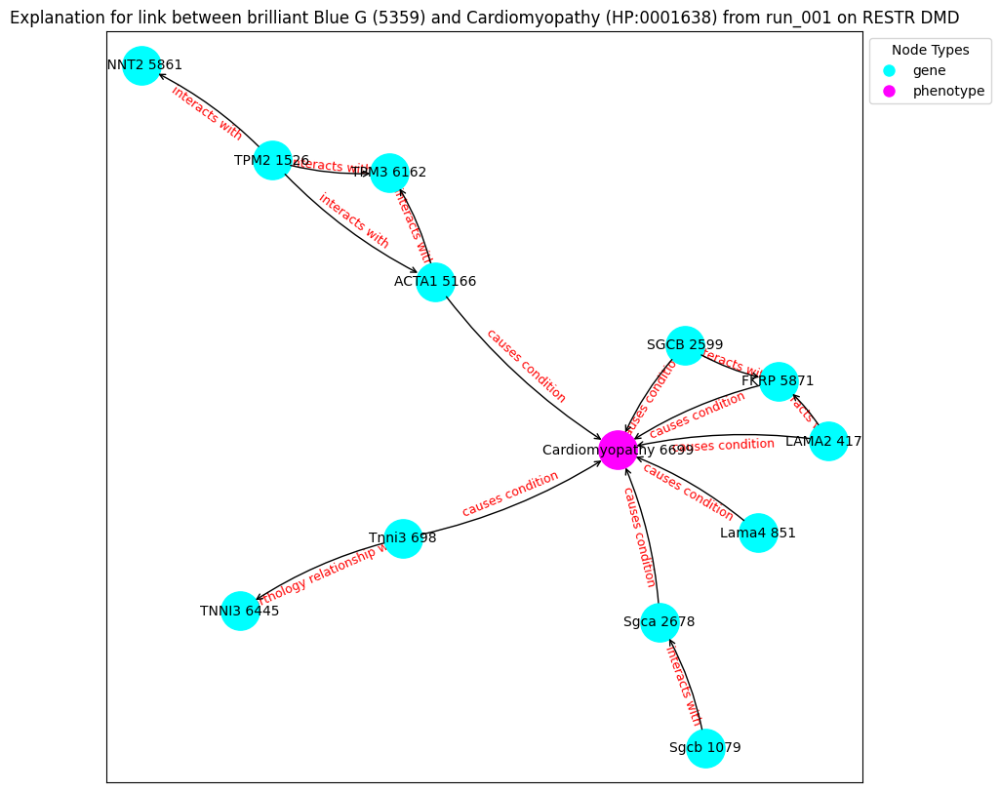

('Tnni3 698', {'type': 'gene'})
('Lama4 851', {'type': 'gene'})
('Sgcb 1079', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('Sgca 2678', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('TNNT2 5861', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TNNI3 6445', {'type': 'gene'})
('Cardiomyopathy 6699', {'type': 'phenotype'})
('Tnni3 698', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Tnni3 698', 'TNNI3 6445', {'label': 'in orthology relationship with'})
('Lama4 851', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Sgcb 1079', 'Sgca 2678', {'label': 'interacts with'})
('TPM2 1526', 'TNNT2 5861', {'label': 'interacts with'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('SGCB 2599', 'FKRP 5871', {'label': 'interacts with'})
('SGCB 2599', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Sgca

Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 472.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9790], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 556.91it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9735], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 603.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9744], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 593.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5393], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 571.51it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9083], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 590.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1495], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 619.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5867], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 576.82it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9722], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 551.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9937], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 612.01it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic                          label  \
10461     10461  HP:0003707  phenotype  Calf muscle pseudohypertrophy   

       semantic_id  
10461            8  
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9045], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 517.97it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.4958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 521.55it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.5576], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 529.13it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9993], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 490.56it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9543], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 531.36it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9725], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 516.41it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9938], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 536.67it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8667], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 522.01it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9771], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 496.51it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.2398], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 512.39it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


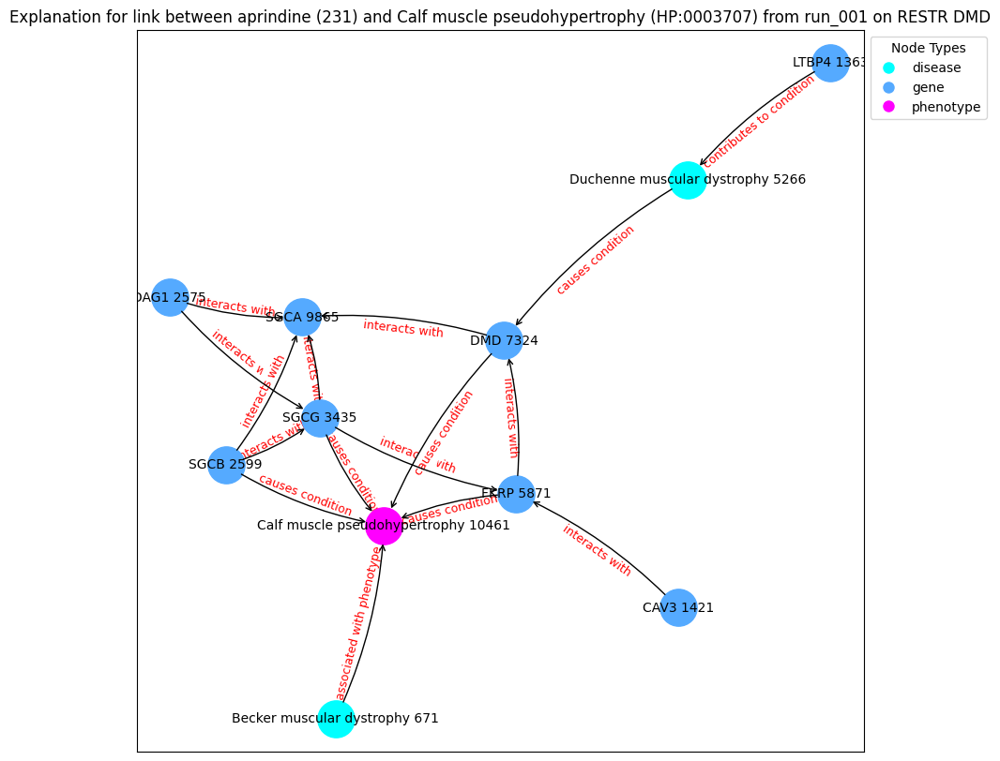

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('CAV3 1421', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SGCA 9865', {'type': 'gene'})
('Calf muscle pseudohypertrophy 10461', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Calf muscle pseudohypertrophy 10461', {'label': 'associated with phenotype'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('CAV3 1421', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'SGCG 3435', {'label': 'interacts with'})
('DAG1 2575', 'SGCA 9865', {'label': 'interacts with'})
('SGCB 2599', 'Calf muscle pseudohypertrophy 10461', {'label': 'causes condition'})
('SGCB 2599', 'SGCG 3435', {'label': 'interacts with'})
('SGCB 2599', 'SGCA 9865', {'label': 'interacts with'})
(

Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 512.15it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8449], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 607.21it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0352], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 593.80it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9832], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 617.16it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9178], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 559.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6914], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 586.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9204], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 558.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2123], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 613.19it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9767], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 595.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2880], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 604.58it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                   label  semantic_id
9426      9426  HP:0001644  phenotype  Dilated cardiomyopathy            8
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.7242], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 372.63it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9876], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 383.61it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7816], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 381.12it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8669], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 376.15it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9992], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 381.12it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9987], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 380.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9313], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 402.72it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9802], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 385.16it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.4924], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 391.42it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9953], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:02<00:00, 328.99it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


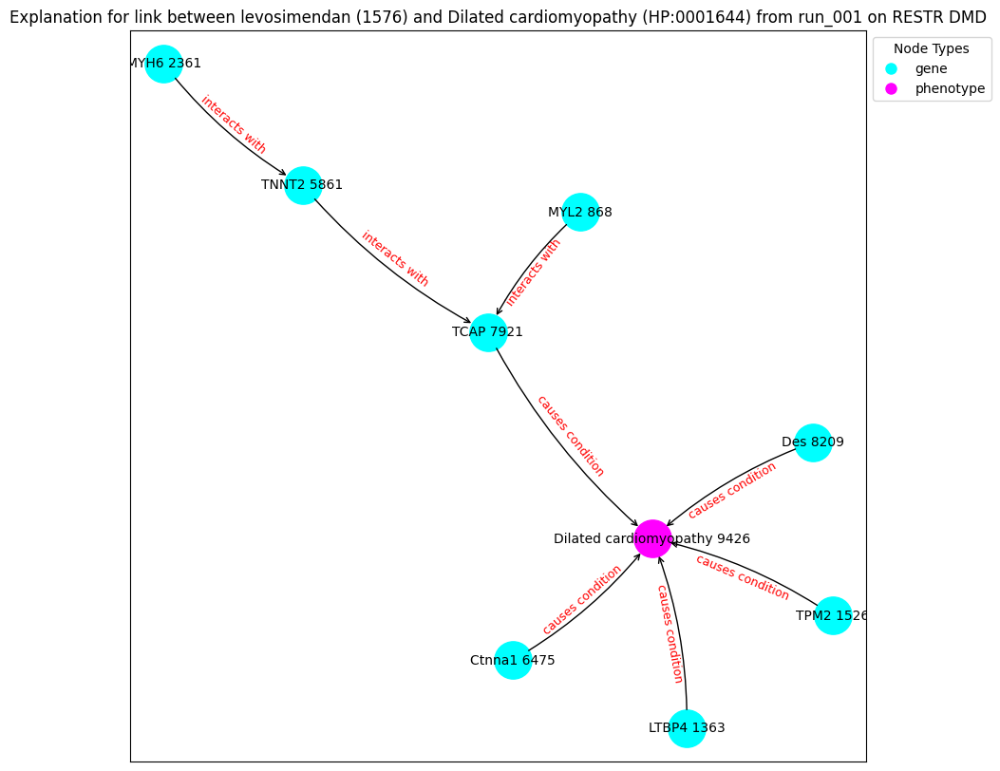

('MYL2 868', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('TNNT2 5861', {'type': 'gene'})
('Ctnna1 6475', {'type': 'gene'})
('TCAP 7921', {'type': 'gene'})
('Des 8209', {'type': 'gene'})
('Dilated cardiomyopathy 9426', {'type': 'phenotype'})
('MYL2 868', 'TCAP 7921', {'label': 'interacts with'})
('LTBP4 1363', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
('TPM2 1526', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
('MYH6 2361', 'TNNT2 5861', {'label': 'interacts with'})
('TNNT2 5861', 'TCAP 7921', {'label': 'interacts with'})
('Ctnna1 6475', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
('TCAP 7921', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
('Des 8209', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_25_run_001

Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:02<00:00, 345.21it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9591], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 370.16it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9912], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 374.02it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8764], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 363.28it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 389.98it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7496], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 396.11it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8700], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 396.73it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.1566], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 388.80it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9662], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 373.46it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9936], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 376.42it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


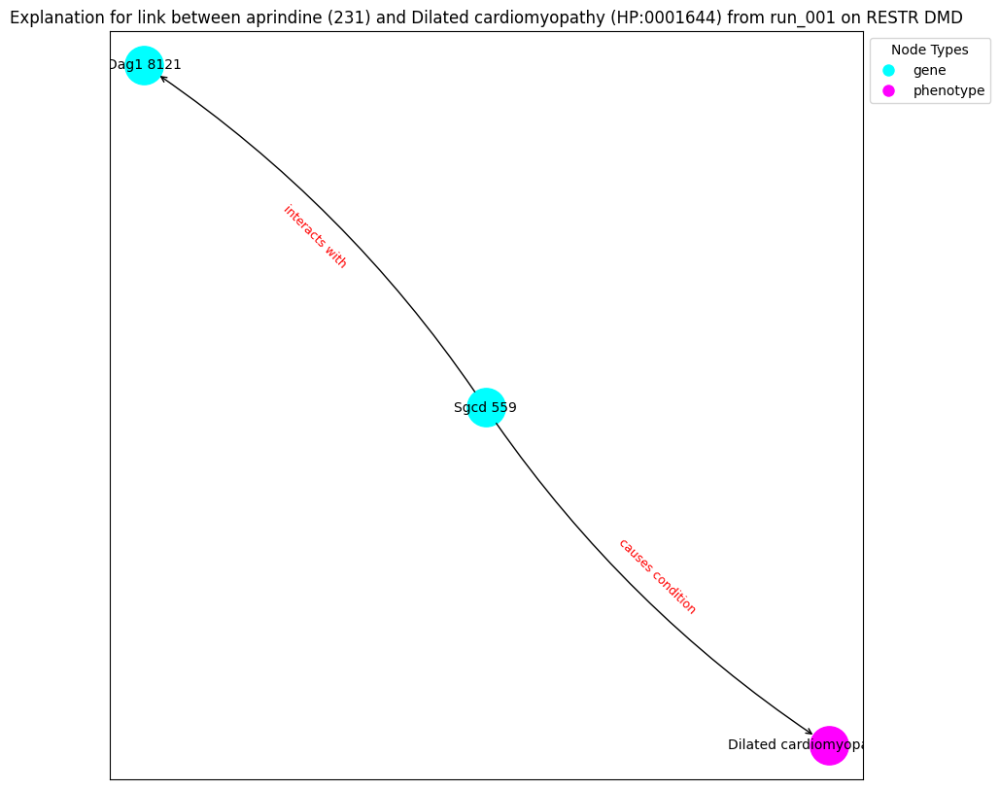

('Sgcd 559', {'type': 'gene'})
('Dag1 8121', {'type': 'gene'})
('Dilated cardiomyopathy 9426', {'type': 'phenotype'})
('Sgcd 559', 'Dag1 8121', {'label': 'interacts with'})
('Sgcd 559', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_26_run_001_graph.gpickle
Explanation pair ids and names saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_26_run_001_pair.pkl
node1:
      index_id          id   semantic                        label  \
7911      7911  HP:0003323  phenotype  Progressive muscle weakness   

      semantic_id  
7911            8  
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.2371], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 410.86it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.7658], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 490.22it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9820], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 464.38it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9054], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 432.95it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.3217], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 448.92it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9975], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 434.32it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9039], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 463.10it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8225], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 467.49it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.7970], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 472.12it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9915], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 463.97it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


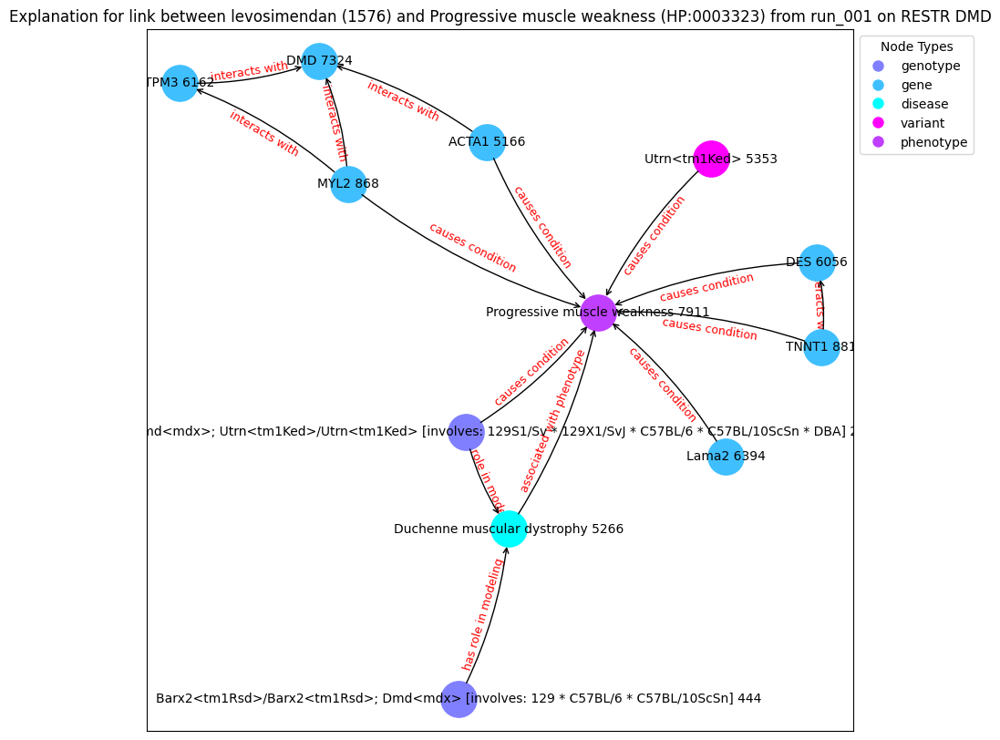

('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 444', {'type': 'genotype'})
('MYL2 868', {'type': 'gene'})
('TNNT1 881', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx>; Utrn<tm1Ked>/Utrn<tm1Ked> [involves: 129S1/Sv * 129X1/SvJ * C57BL/6 * C57BL/10ScSn * DBA] 2925', {'type': 'genotype'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Utrn<tm1Ked> 5353', {'type': 'variant'})
('DES 6056', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Lama2 6394', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Progressive muscle weakness 7911', {'type': 'phenotype'})
('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 444', 'Duchenne muscular dystrophy 5266', {'label': 'has role in modeling'})
('MYL2 868', 'DMD 7324', {'label': 'interacts with'})
('MYL2 868', 'Progressive muscle weakness 7911', {'label': 'causes condition'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('TNNT1 881', 'DES 6

Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 443.35it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9831], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 439.37it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9893], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 424.07it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9931], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 433.74it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.2093], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 454.58it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.5513], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 471.29it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.3856], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 435.72it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9735], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 449.28it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.4346], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 480.77it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9550], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 470.44it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


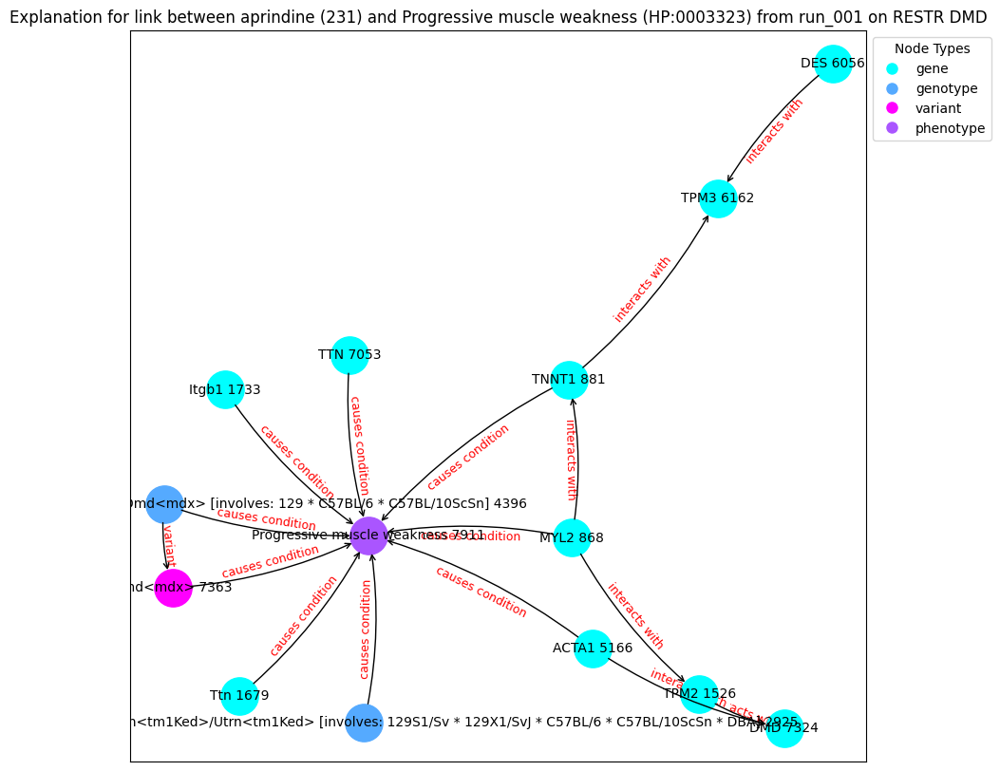

('MYL2 868', {'type': 'gene'})
('TNNT1 881', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('Ttn 1679', {'type': 'gene'})
('Itgb1 1733', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx>; Utrn<tm1Ked>/Utrn<tm1Ked> [involves: 129S1/Sv * 129X1/SvJ * C57BL/6 * C57BL/10ScSn * DBA] 2925', {'type': 'genotype'})
('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx>/Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 4396', {'type': 'genotype'})
('ACTA1 5166', {'type': 'gene'})
('DES 6056', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Dmd<mdx> 7363', {'type': 'variant'})
('Progressive muscle weakness 7911', {'type': 'phenotype'})
('MYL2 868', 'TPM2 1526', {'label': 'interacts with'})
('MYL2 868', 'Progressive muscle weakness 7911', {'label': 'causes condition'})
('MYL2 868', 'TNNT1 881', {'label': 'interacts with'})
('TNNT1 881', 'TPM3 6162', {'label': 'interacts with'})
('TNNT1 881', 'Progressive muscle weakness 7911', {'label': 'causes condition'}

Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 500.52it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9912], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 518.64it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9943], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 514.69it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9690], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 512.73it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9910], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 489.97it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9945], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 518.27it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9928], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 511.07it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9308], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 519.93it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9597], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 527.79it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9821], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 494.44it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


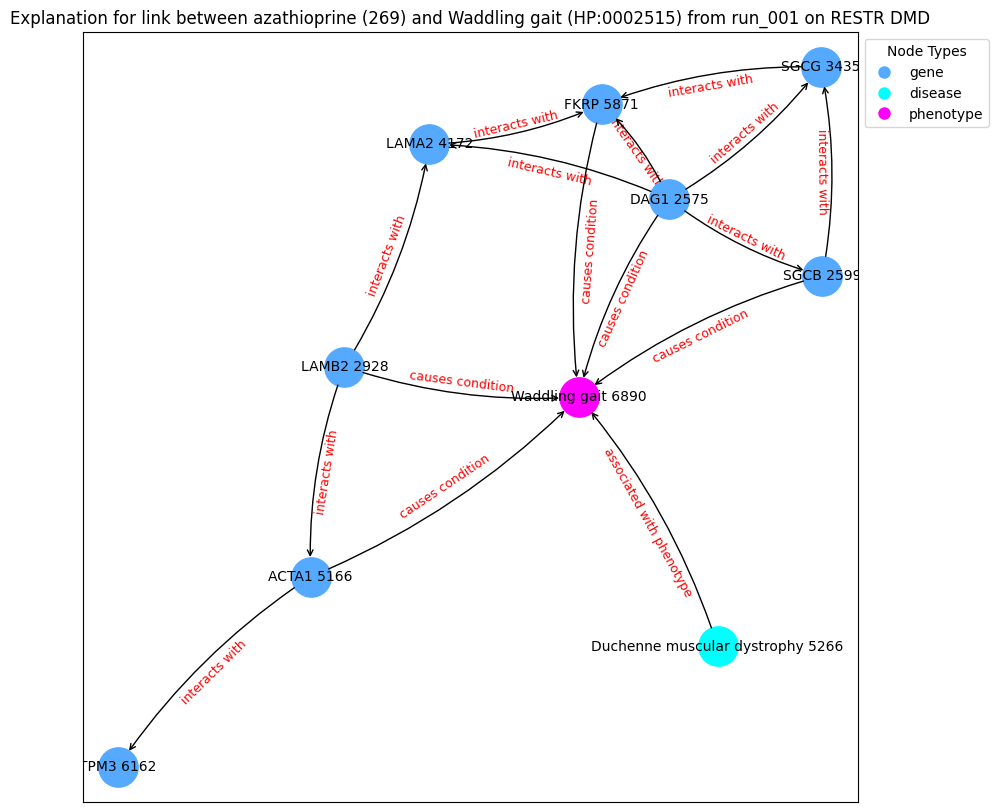

('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Waddling gait 6890', {'type': 'phenotype'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'SGCB 2599', {'label': 'interacts with'})
('DAG1 2575', 'SGCG 3435', {'label': 'interacts with'})
('DAG1 2575', 'LAMA2 4172', {'label': 'interacts with'})
('DAG1 2575', 'Waddling gait 6890', {'label': 'causes condition'})
('SGCB 2599', 'SGCG 3435', {'label': 'interacts with'})
('SGCB 2599', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('LAMB2 2928', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('SGCG 3435', 'FKRP 5871', {'label': '

Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 475.22it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9442], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 477.45it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9761], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 470.08it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9922], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 485.84it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.7616], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 491.82it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.8971], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 508.86it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.2436], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 519.22it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7727], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 521.84it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.4814], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 514.65it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9524], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 486.25it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


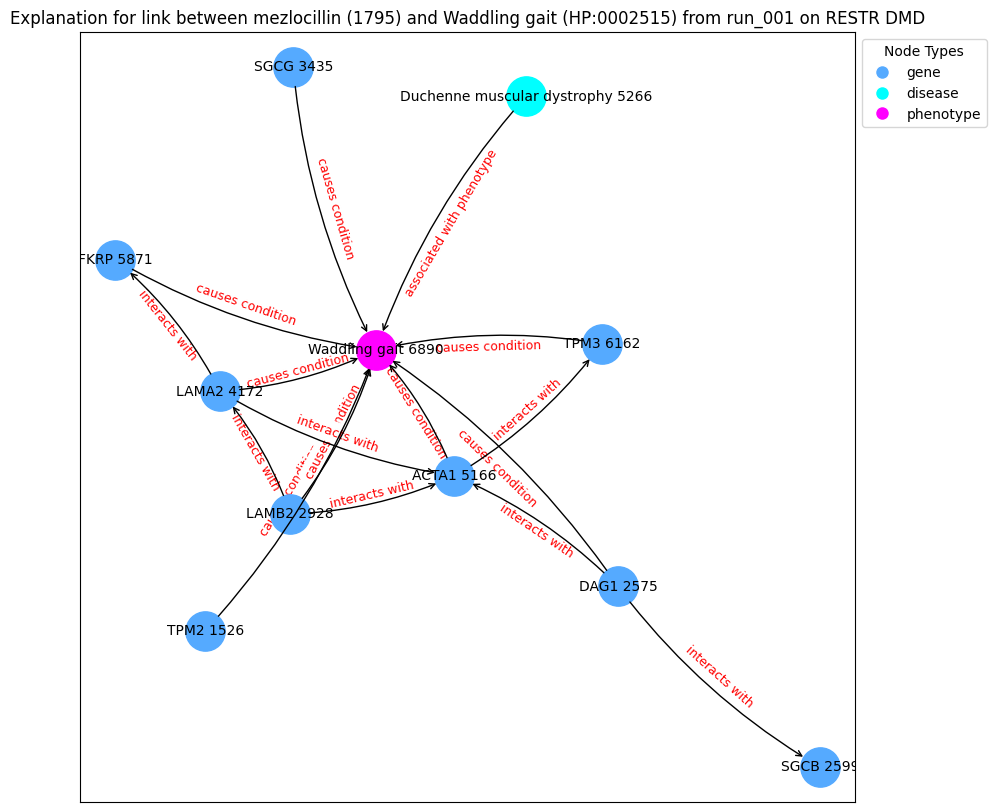

('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Waddling gait 6890', {'type': 'phenotype'})
('TPM2 1526', 'Waddling gait 6890', {'label': 'causes condition'})
('DAG1 2575', 'SGCB 2599', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('LAMB2 2928', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('SGCG 3435', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMA2 4172', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMA2 4172', 'FKRP 5871', {'label': '

Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 432.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9744], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 481.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4555], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 350.77it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8320], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:02<00:00, 338.77it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5268], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:02<00:00, 340.91it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2296], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:02<00:00, 339.39it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6568], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:02<00:00, 317.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5783], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 362.50it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1176], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 356.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9246], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 355.70it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                 label  semantic_id
5560      5560  HP:0100543  phenotype  Cognitive impairment            8
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.9988], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:02<00:00, 337.41it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7583], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:02<00:00, 334.97it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4072], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 360.78it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9945], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 367.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9955], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 353.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9855], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 357.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8014], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:02<00:00, 328.29it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3716], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 355.26it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9894], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 356.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1543], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 351.27it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                 label  semantic_id
5560      5560  HP:0100543  phenotype  Cognitive impairment            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.8847], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 341.42it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5889], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 344.30it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9703], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 333.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 321.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9858], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 319.07it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9334], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 337.76it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9319], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 363.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3144], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 347.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1518], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:02<00:00, 339.90it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2921], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 363.02it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic            label  semantic_id
10980     10980  HP:0002791  phenotype  Hypoventilation            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.0130], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 361.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0078], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 351.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1268], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 364.80it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0666], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 362.33it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1343], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:02<00:00, 324.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0606], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 362.45it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0758], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:02<00:00, 324.24it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0063], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:02<00:00, 342.20it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0208], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 362.69it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0443], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 373.57it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                       label  semantic_id
8020      8020  HP:0001263  phenotype  Global developmental delay            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.9974], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 284.91it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9349], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 282.95it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9529], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 291.30it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 317.66it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.2112], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 328.04it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9828], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 314.59it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9809], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 330.86it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.4677], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 335.35it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8295], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 327.92it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8501], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:02<00:00, 328.46it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


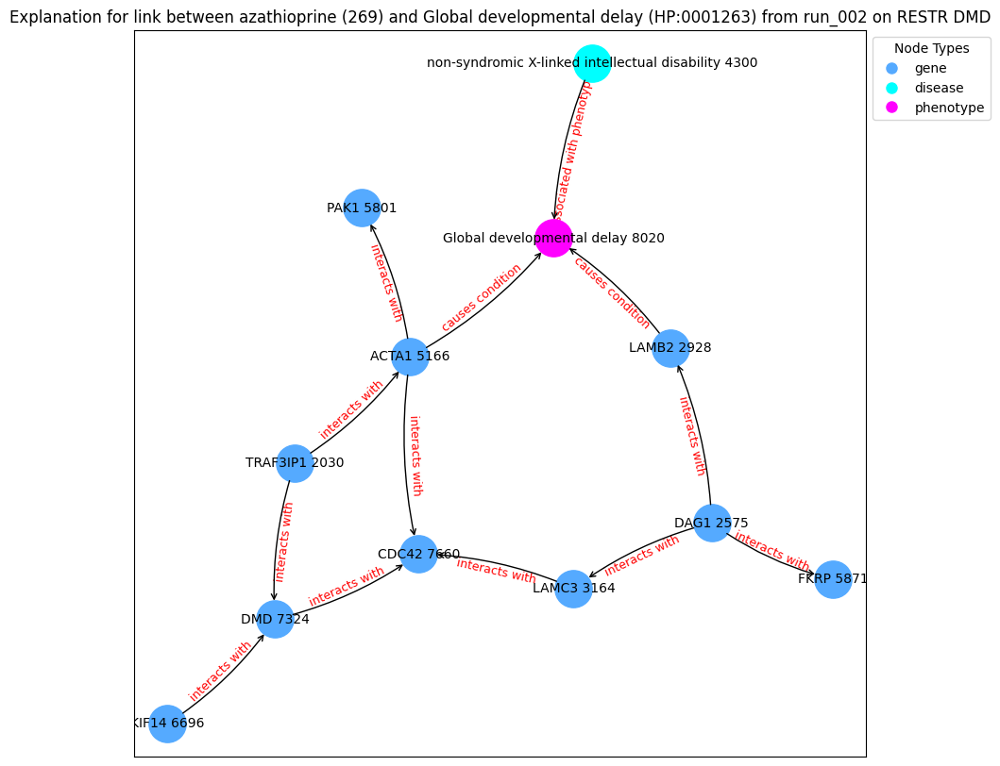

('TRAF3IP1 2030', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('LAMC3 3164', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('ACTA1 5166', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('KIF14 6696', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('Global developmental delay 8020', {'type': 'phenotype'})
('TRAF3IP1 2030', 'DMD 7324', {'label': 'interacts with'})
('TRAF3IP1 2030', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'LAMC3 3164', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'LAMB2 2928', {'label': 'interacts with'})
('LAMB2 2928', 'Global developmental delay 8020', {'label': 'causes condition'})
('LAMC3 3164', 'CDC42 7660', {'label': 'interacts with'})
('non-syndromic X-linked intellectual disability 4300', 'Global developmental delay 8020', {'label': 'assoc

Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 316.71it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.3653], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 331.95it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9568], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 340.33it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.6734], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 340.64it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.4233], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 328.65it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9998], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 320.67it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.3890], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 322.27it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.6249], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 333.98it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.0179], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 327.37it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9670], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:02<00:00, 330.07it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


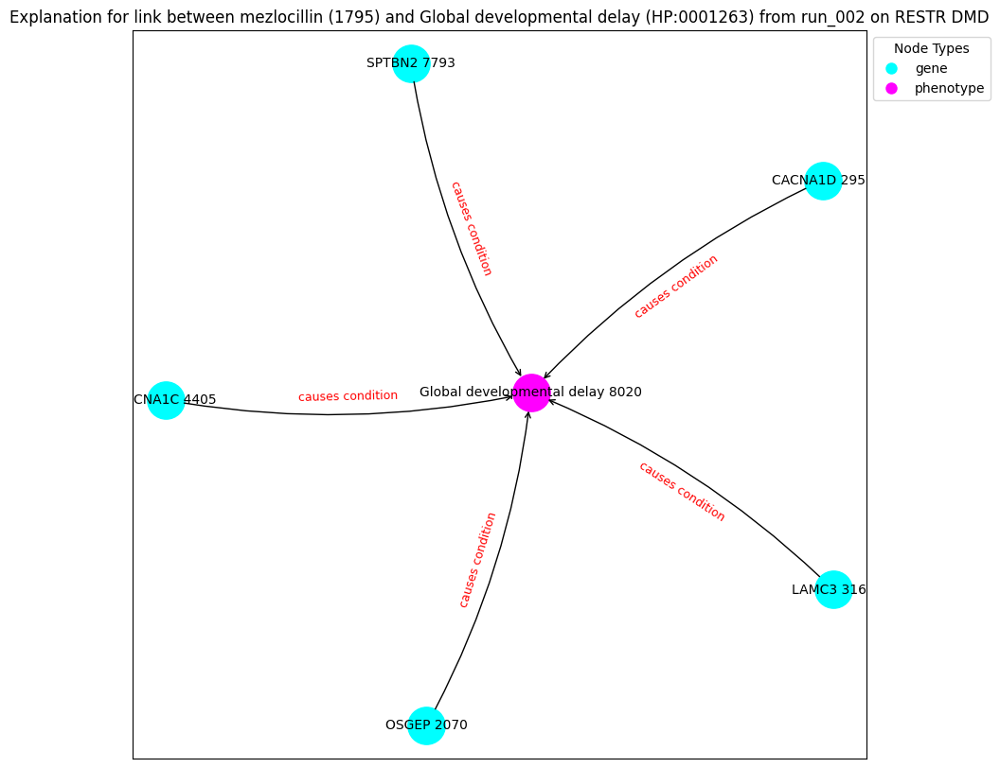

('OSGEP 2070', {'type': 'gene'})
('CACNA1D 2956', {'type': 'gene'})
('LAMC3 3164', {'type': 'gene'})
('CACNA1C 4405', {'type': 'gene'})
('SPTBN2 7793', {'type': 'gene'})
('Global developmental delay 8020', {'type': 'phenotype'})
('OSGEP 2070', 'Global developmental delay 8020', {'label': 'causes condition'})
('CACNA1D 2956', 'Global developmental delay 8020', {'label': 'causes condition'})
('LAMC3 3164', 'Global developmental delay 8020', {'label': 'causes condition'})
('CACNA1C 4405', 'Global developmental delay 8020', {'label': 'causes condition'})
('SPTBN2 7793', 'Global developmental delay 8020', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_2_run_002_graph.gpickle
Explanation pair ids and names saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_2_run_002_pair.pkl
node1:
      index_id          id   semantic      lab

Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:02<00:00, 345.40it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.2971], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 359.56it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9753], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 372.25it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6302], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 375.46it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9962], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 372.28it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8133], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 377.81it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9858], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 377.99it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9615], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 380.59it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9204], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 400.47it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9966], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 401.22it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


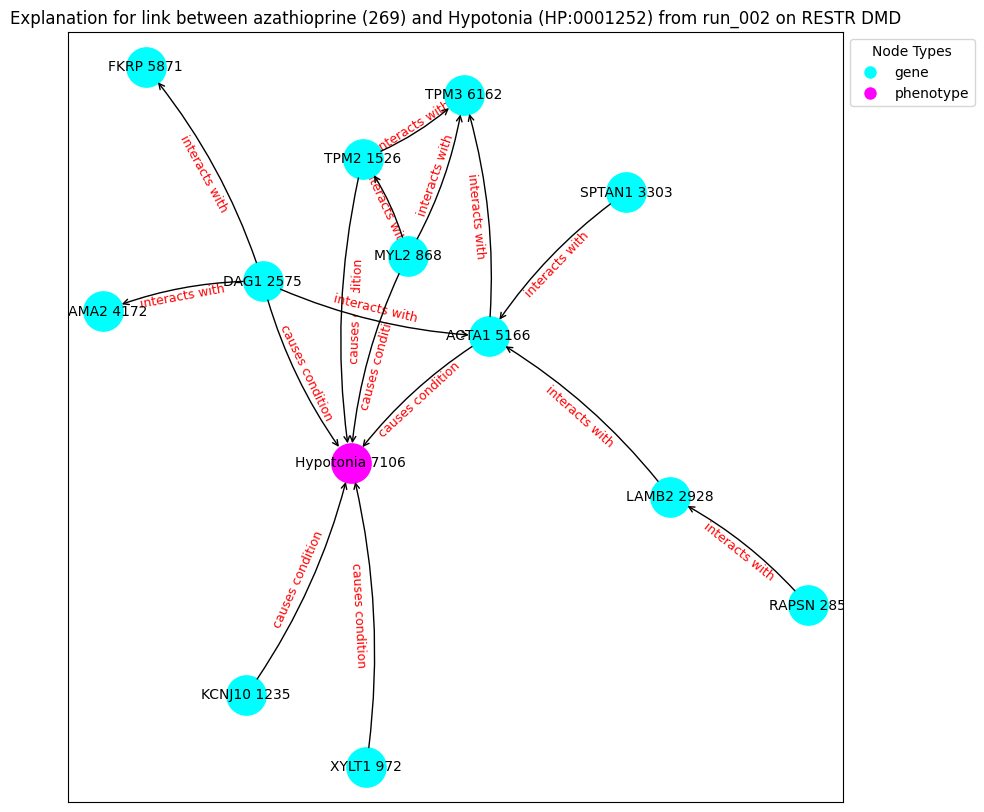

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('XYLT1 972', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SPTAN1 3303', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Hypotonia 7106', {'type': 'phenotype'})
('RAPSN 285', 'LAMB2 2928', {'label': 'interacts with'})
('MYL2 868', 'Hypotonia 7106', {'label': 'causes condition'})
('MYL2 868', 'TPM2 1526', {'label': 'interacts with'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('XYLT1 972', 'Hypotonia 7106', {'label': 'causes condition'})
('KCNJ10 1235', 'Hypotonia 7106', {'label': 'causes condition'})
('TPM2 1526', 'Hypotonia 7106', {'label': 'causes condition'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label'

Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 425.20it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.7120], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 430.90it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9867], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 421.96it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9629], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 443.97it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9475], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 445.62it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.1663], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 458.66it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9960], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 450.37it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9953], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 465.34it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9213], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 456.67it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.2035], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 431.17it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


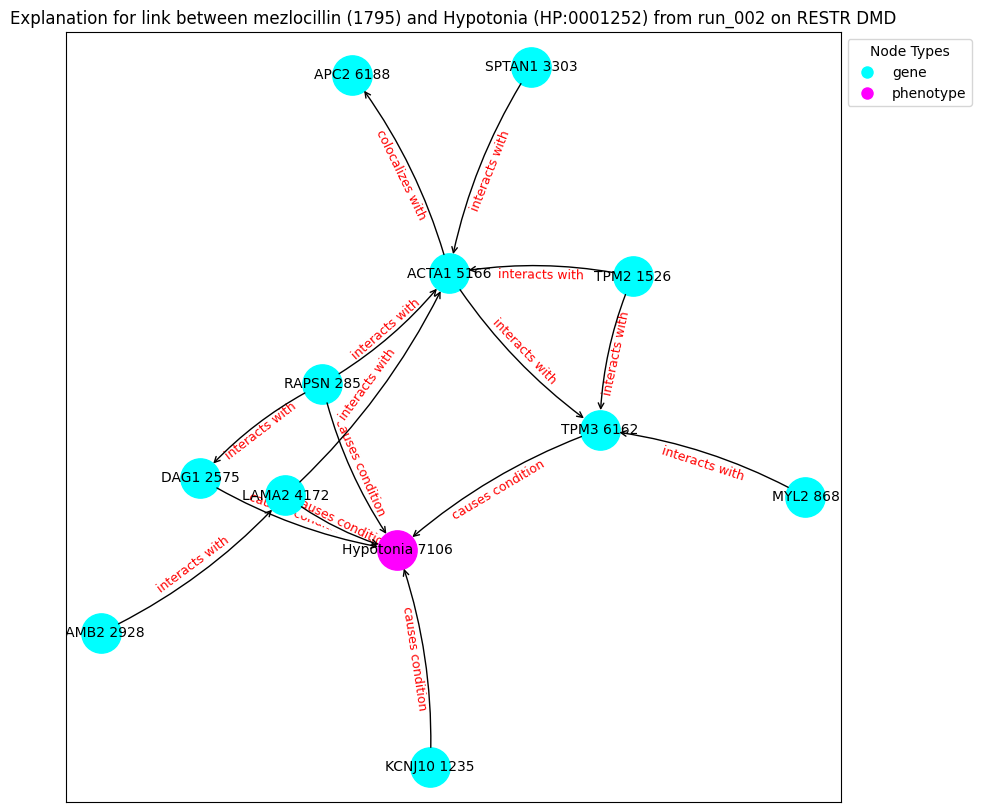

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SPTAN1 3303', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('APC2 6188', {'type': 'gene'})
('Hypotonia 7106', {'type': 'phenotype'})
('RAPSN 285', 'ACTA1 5166', {'label': 'interacts with'})
('RAPSN 285', 'Hypotonia 7106', {'label': 'causes condition'})
('RAPSN 285', 'DAG1 2575', {'label': 'interacts with'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('KCNJ10 1235', 'Hypotonia 7106', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'Hypotonia 7106', {'label': 'causes condition'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('SPTAN1 3303', 'ACTA1 5166', {'label': 'interacts with'})
('LAMA2 417

Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 474.54it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4525], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 494.39it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0019], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 502.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0183], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 494.52it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2823], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 456.93it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1032], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 538.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2304], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 449.72it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5600], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 462.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7809], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 486.27it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1946], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 554.33it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                         label  \
6618      6618  HP:0001328  phenotype  Specific learning disability   

      semantic_id  
6618            8  
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.0912], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 551.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1778], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 539.23it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2513], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 553.70it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1698], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 526.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4456], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 519.01it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4362], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 536.11it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4491], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 511.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5356], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 524.10it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5125], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 542.80it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8784], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 567.97it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                         label  \
6618      6618  HP:0001328  phenotype  Specific learning disability   

      semantic_id  
6618            8  
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.1158], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 545.66it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9304], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 512.87it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2454], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 520.29it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2443], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 556.26it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8983], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 534.14it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5043], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 551.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0418], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 529.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2646], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 522.69it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3440], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 546.97it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9835], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 520.07it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                  label  semantic_id
9599      9599  HP:0001290  phenotype  Generalized hypotonia            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.6916], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 418.82it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9680], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 409.22it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9279], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 403.41it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9943], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 395.34it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9935], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 423.92it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9952], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 428.73it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9900], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 415.46it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.1236], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 408.65it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9956], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 426.56it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9557], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 407.15it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


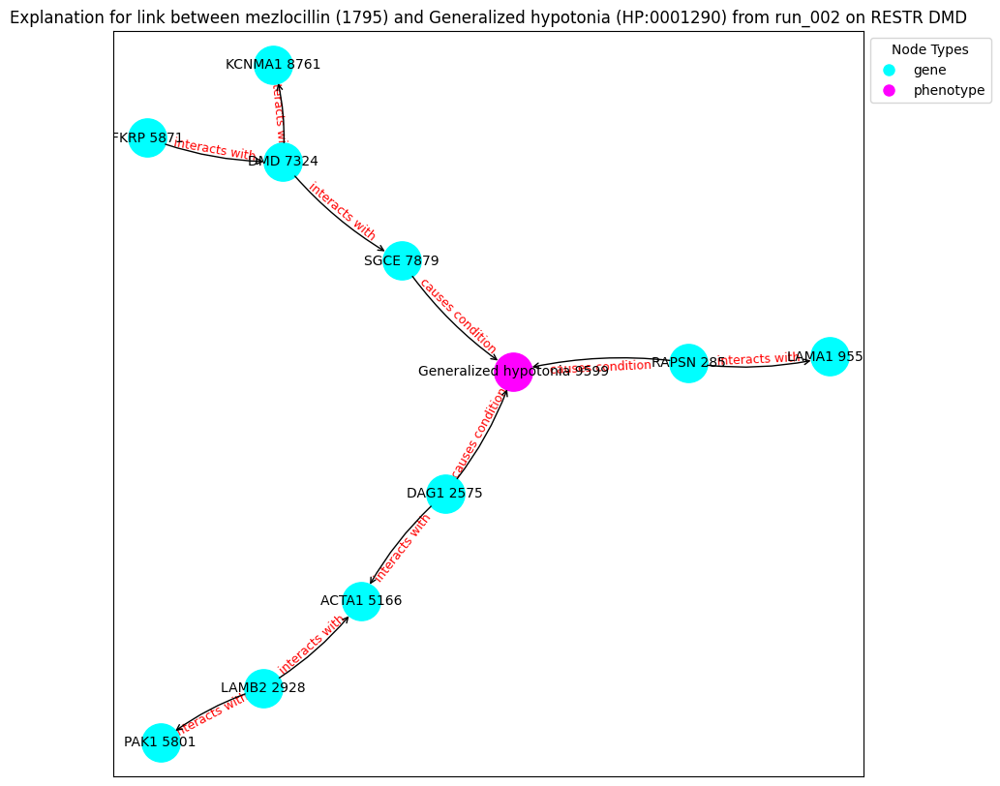

('RAPSN 285', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SGCE 7879', {'type': 'gene'})
('KCNMA1 8761', {'type': 'gene'})
('LAMA1 9558', {'type': 'gene'})
('Generalized hypotonia 9599', {'type': 'phenotype'})
('RAPSN 285', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('RAPSN 285', 'LAMA1 9558', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('LAMB2 2928', 'PAK1 5801', {'label': 'interacts with'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('FKRP 5871', 'DMD 7324', {'label': 'interacts with'})
('DMD 7324', 'KCNMA1 8761', {'label': 'interacts with'})
('DMD 7324', 'SGCE 7879', {'label': 'interacts with'})
('SGCE 7879', 'Generalized hypotonia 9599', {'label': 'causes condition'})
E

Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 386.32it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9911], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 416.00it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8893], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 411.21it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9618], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 413.62it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9790], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 414.46it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7913], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 420.83it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8583], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 420.66it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9118], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 416.93it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9846], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 393.60it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8254], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 393.52it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


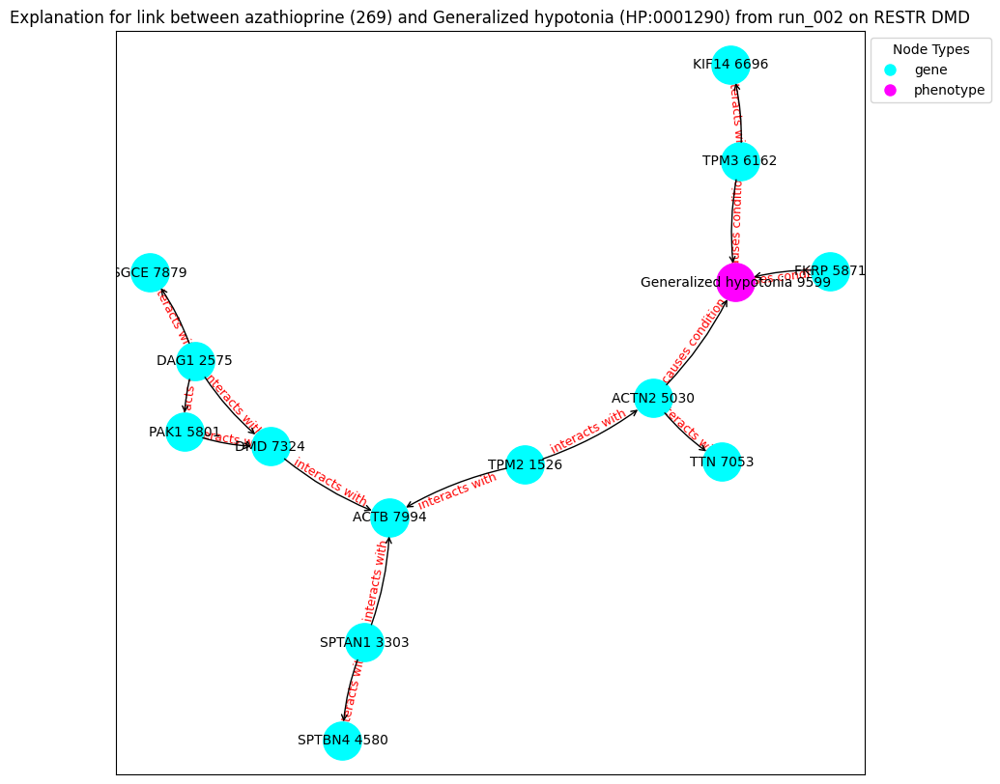

('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SPTAN1 3303', {'type': 'gene'})
('SPTBN4 4580', {'type': 'gene'})
('ACTN2 5030', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('KIF14 6696', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SGCE 7879', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('Generalized hypotonia 9599', {'type': 'phenotype'})
('TPM2 1526', 'ACTB 7994', {'label': 'interacts with'})
('TPM2 1526', 'ACTN2 5030', {'label': 'interacts with'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'SGCE 7879', {'label': 'interacts with'})
('DAG1 2575', 'PAK1 5801', {'label': 'interacts with'})
('SPTAN1 3303', 'SPTBN4 4580', {'label': 'interacts with'})
('SPTAN1 3303', 'ACTB 7994', {'label': 'interacts with'})
('ACTN2 5030', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('ACTN2 5030', 'TTN 7053', {'label': 'interacts with

Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 393.82it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9969], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 409.03it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9736], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 410.39it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9593], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 406.97it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9923], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 411.75it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.3480], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 404.03it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9970], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 412.21it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9957], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 415.41it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9683], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 424.77it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8254], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 421.15it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


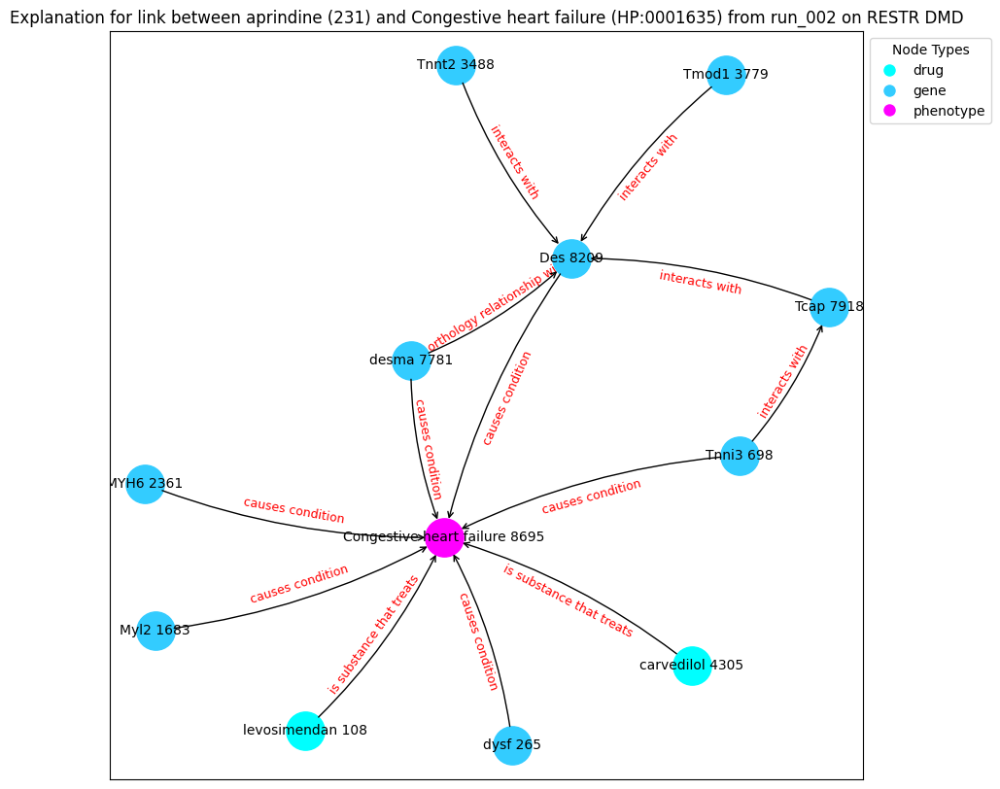

('levosimendan 108', {'type': 'drug'})
('dysf 265', {'type': 'gene'})
('Tnni3 698', {'type': 'gene'})
('Myl2 1683', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('Tnnt2 3488', {'type': 'gene'})
('Tmod1 3779', {'type': 'gene'})
('carvedilol 4305', {'type': 'drug'})
('desma 7781', {'type': 'gene'})
('Tcap 7918', {'type': 'gene'})
('Des 8209', {'type': 'gene'})
('Congestive heart failure 8695', {'type': 'phenotype'})
('levosimendan 108', 'Congestive heart failure 8695', {'label': 'is substance that treats'})
('dysf 265', 'Congestive heart failure 8695', {'label': 'causes condition'})
('Tnni3 698', 'Congestive heart failure 8695', {'label': 'causes condition'})
('Tnni3 698', 'Tcap 7918', {'label': 'interacts with'})
('Myl2 1683', 'Congestive heart failure 8695', {'label': 'causes condition'})
('MYH6 2361', 'Congestive heart failure 8695', {'label': 'causes condition'})
('Tnnt2 3488', 'Des 8209', {'label': 'interacts with'})
('Tmod1 3779', 'Des 8209', {'label': 'interacts with'})
('car

Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 487.04it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 494.64it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9982], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 493.22it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.1338], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 491.78it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9881], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 477.91it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.6117], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 460.89it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9987], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 512.01it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9975], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 504.50it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9951], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 504.95it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9976], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 467.98it/s]


Contribution threshold is tensor(0.0063)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


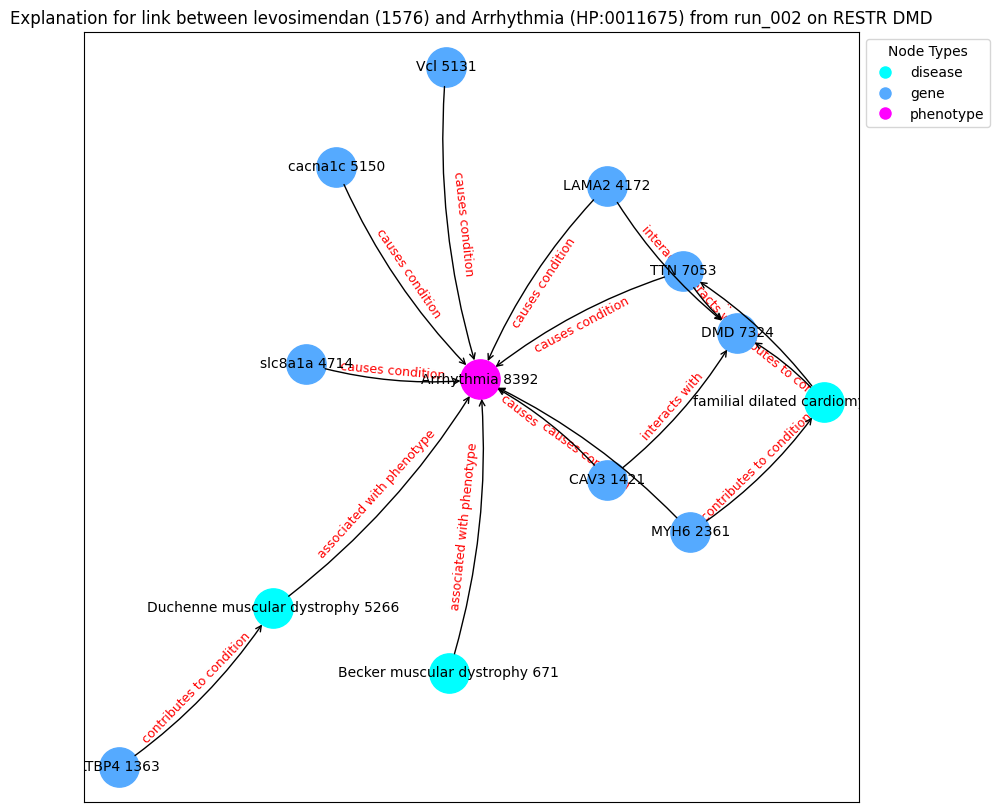

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('CAV3 1421', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('slc8a1a 4714', {'type': 'gene'})
('Vcl 5131', {'type': 'gene'})
('cacna1c 5150', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('familial dilated cardiomyopathy 5803', {'type': 'disease'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Arrhythmia 8392', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Arrhythmia 8392', {'label': 'associated with phenotype'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('CAV3 1421', 'Arrhythmia 8392', {'label': 'causes condition'})
('CAV3 1421', 'DMD 7324', {'label': 'interacts with'})
('MYH6 2361', 'Arrhythmia 8392', {'label': 'causes condition'})
('MYH6 2361', 'familial dilated cardiomyopathy 5803', {'label': 'contributes to condition'})
('LAMA2 4172', 'DMD 7324', {'l

Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 534.39it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9651], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 573.34it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7234], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 552.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5674], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 543.12it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7332], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 534.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9517], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 550.78it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5404], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 572.48it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9061], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 535.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9936], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 570.93it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9459], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 4932: 100%|██████████| 700/700 [00:01<00:00, 580.68it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic        label  semantic_id
3220      3220  HP:0003391  phenotype  Gowers sign            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.9053], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 538.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1730], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 559.93it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0190], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 572.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8853], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 571.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1684], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 556.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0969], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 525.95it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7247], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 580.29it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0089], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 554.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8530], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 565.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8294], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 522.35it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
5066      5066  HP:0003115  phenotype  Abnormal EKG            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.3172], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 531.21it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7961], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 572.02it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4307], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 550.14it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7785], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 577.10it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8960], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 545.07it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1206], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 576.52it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9799], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 536.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9726], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 553.47it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4187], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 562.23it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4112], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 573.19it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
5066      5066  HP:0003115  phenotype  Abnormal EKG            8
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.2941], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 569.01it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9650], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 549.26it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9972], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 566.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9502], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 549.24it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3634], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 587.30it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6903], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 553.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9157], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 555.90it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1693], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 566.08it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3061], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 529.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5421], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 565.28it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                label  semantic_id
3548      3548  HP:0001371  phenotype  Flexion contracture            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9855], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 553.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9931], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 517.48it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6267], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 527.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9425], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 541.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9324], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 498.89it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9404], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 527.59it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9868], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 498.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9585], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 514.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8091], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 531.53it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9822], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 517.62it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic  \
10260     10260  HP:0003236  phenotype   

                                                   label  semantic_id  
10260  Elevated circulating creatine kinase concentra...            8  
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9978], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 326.06it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([1.0000], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 357.40it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9952], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 355.21it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9997], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 341.53it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9997], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 353.63it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.6466], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 359.47it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8815], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 360.37it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9985], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 341.04it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.9988], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 362.40it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9938], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 341.07it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


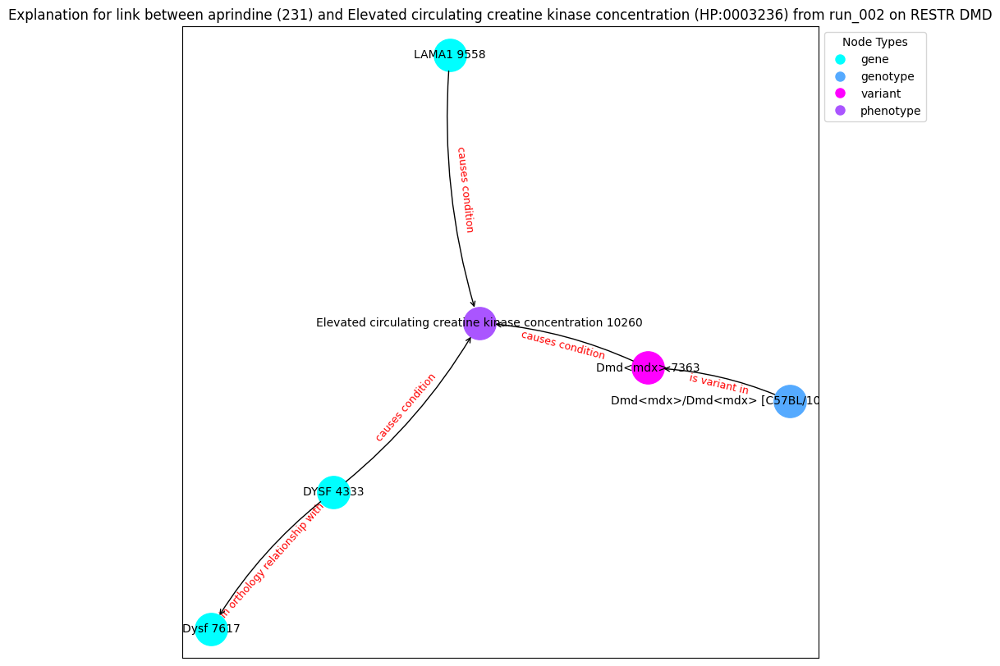

('DYSF 4333', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 6302', {'type': 'genotype'})
('Dmd<mdx> 7363', {'type': 'variant'})
('Dysf 7617', {'type': 'gene'})
('LAMA1 9558', {'type': 'gene'})
('Elevated circulating creatine kinase concentration 10260', {'type': 'phenotype'})
('DYSF 4333', 'Dysf 7617', {'label': 'in orthology relationship with'})
('DYSF 4333', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 6302', 'Dmd<mdx> 7363', {'label': 'is variant in'})
('Dmd<mdx> 7363', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('LAMA1 9558', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_9_run_002_graph.gpickle
Explanation pair ids and names saved at c:\Users\rosa-\OneDrive\D

Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 342.44it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0023], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:01<00:00, 364.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.6682], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:01<00:00, 360.86it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9964], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:01<00:00, 365.26it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5106], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:01<00:00, 358.12it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.6694], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 346.62it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.9766], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:01<00:00, 354.88it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0247], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:01<00:00, 363.14it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9997], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:01<00:00, 355.63it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0186], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 468: 100%|██████████| 700/700 [00:02<00:00, 347.69it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


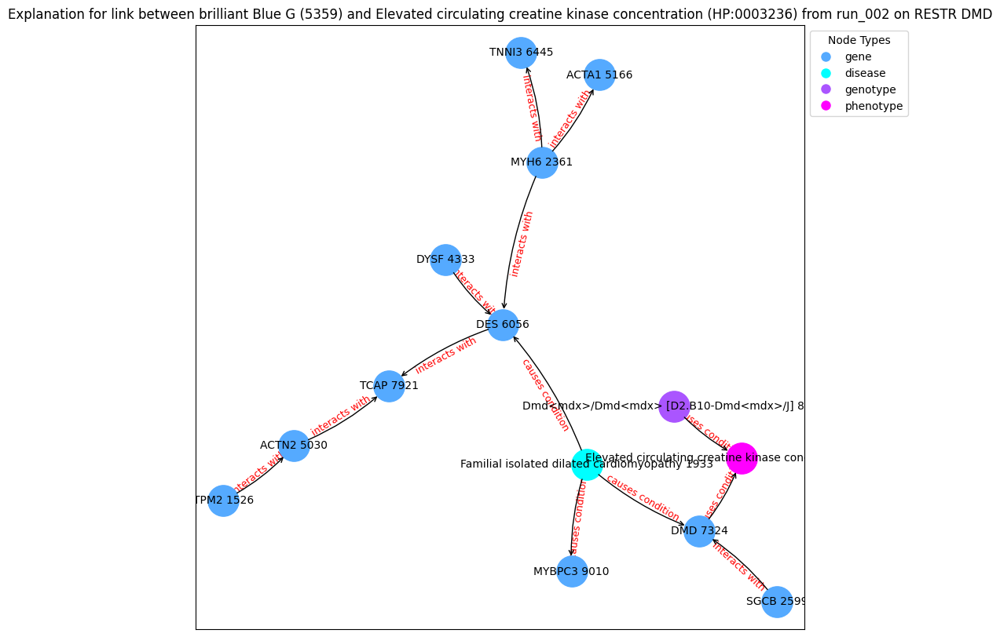

('TPM2 1526', {'type': 'gene'})
('Familial isolated dilated cardiomyopathy 1933', {'type': 'disease'})
('MYH6 2361', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('DYSF 4333', {'type': 'gene'})
('ACTN2 5030', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('DES 6056', {'type': 'gene'})
('TNNI3 6445', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('TCAP 7921', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx> [D2.B10-Dmd<mdx>/J] 8330', {'type': 'genotype'})
('MYBPC3 9010', {'type': 'gene'})
('Elevated circulating creatine kinase concentration 10260', {'type': 'phenotype'})
('TPM2 1526', 'ACTN2 5030', {'label': 'interacts with'})
('Familial isolated dilated cardiomyopathy 1933', 'DES 6056', {'label': 'causes condition'})
('Familial isolated dilated cardiomyopathy 1933', 'DMD 7324', {'label': 'causes condition'})
('Familial isolated dilated cardiomyopathy 1933', 'MYBPC3 9010', {'label': 'causes condition'})
('MYH6 2361', 'TNNI3 6445', {'label': 'interacts with'})
('MYH6 2361', 'DES 6056',

Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 328.62it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9737], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 336.78it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.6920], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 374.34it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.7770], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 336.74it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.3719], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 368.64it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9980], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 350.52it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7086], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 337.09it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9269], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 363.65it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9850], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 378.98it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8092], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 367.76it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic  \
5626      5626  HP:0000750  phenotype   

                                        label  semantic_id  
5626  Delayed speech and language development            8  
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.3138], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 504.10it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9891], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 521.15it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9155], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 456.81it/s]


Contribution threshold is tensor(0.0061)
Prediction from trained model: tensor([0.9765], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 481.81it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.4498], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 534.65it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9977], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 526.83it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9413], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 513.53it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9351], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 516.06it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.4808], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 488.23it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8872], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 502.41it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


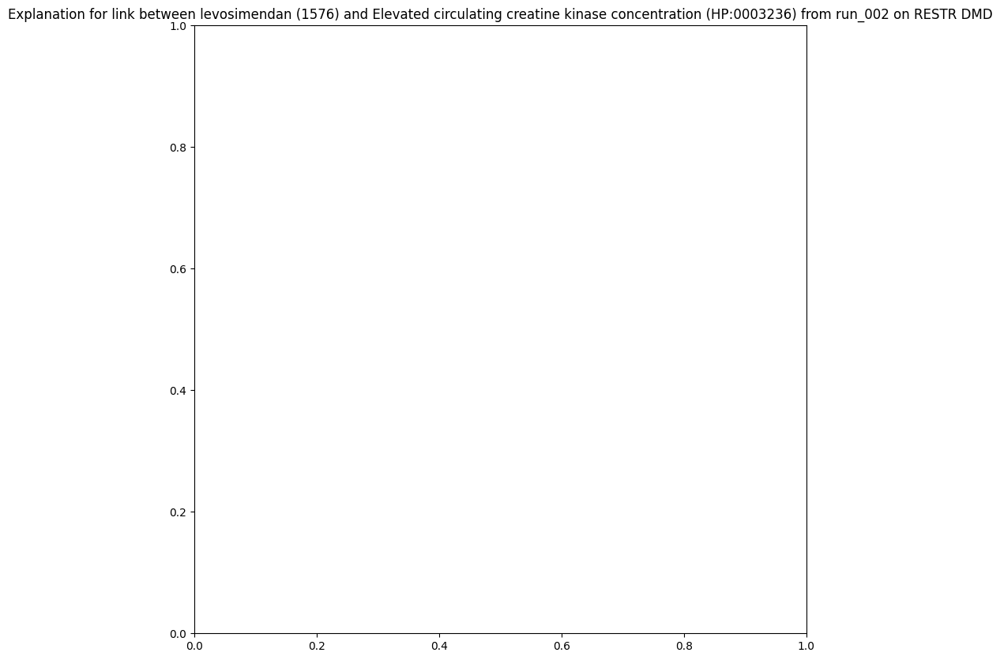

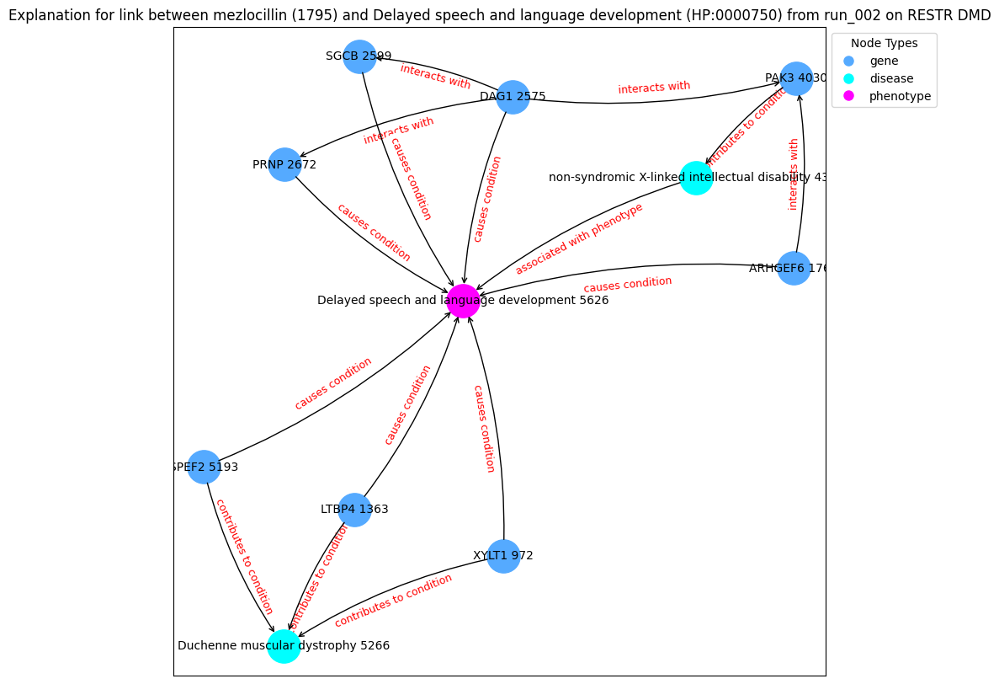

('XYLT1 972', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('ARHGEF6 1764', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('SPEF2 5193', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Delayed speech and language development 5626', {'type': 'phenotype'})
('XYLT1 972', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('XYLT1 972', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('ARHGEF6 1764', 'PAK3 4030', {'label': 'interacts with'})
('ARHGEF6 1764', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('DAG1 2575

Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 417.89it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8399], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 477.94it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.7740], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 510.58it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.6752], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 475.00it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8800], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 521.90it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.4517], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 522.34it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9017], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 458.25it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.3937], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 504.66it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.6990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 521.15it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.5105], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 496.99it/s]


Contribution threshold is tensor(0.0062)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


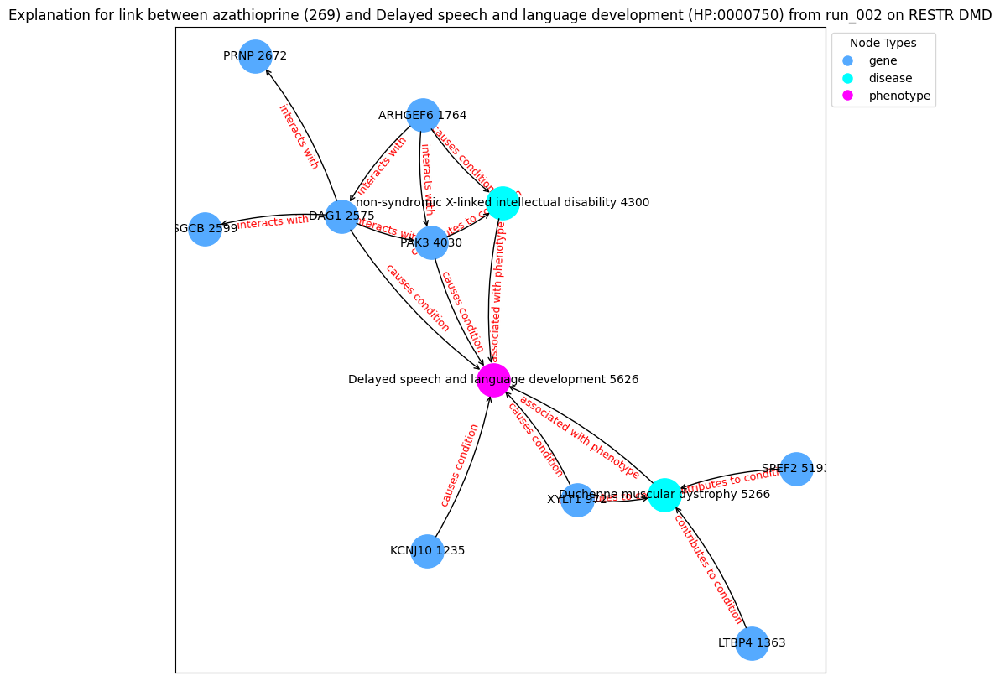

('XYLT1 972', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('ARHGEF6 1764', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('SPEF2 5193', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Delayed speech and language development 5626', {'type': 'phenotype'})
('XYLT1 972', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('XYLT1 972', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('KCNJ10 1235', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('ARHGEF6 1764', 'DAG1 2575', {'label': 'interacts with'})
('ARHGEF6 1764', 'PAK3 4030', {'label': 'interacts with'})
('ARHGEF6 176

Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 533.30it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 628.13it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 603.58it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 610.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 595.31it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 574.33it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 625.76it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 591.12it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 523.23it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([1.], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1297 and 4932: 100%|██████████| 700/700 [00:01<00:00, 616.63it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic               label  semantic_id
9362      9362  HP:0003560  phenotype  Muscular dystrophy            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 386.96it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9985], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 378.97it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9550], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 364.81it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5535], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 371.64it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 375.13it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9996], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 382.83it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9962], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 394.73it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9535], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 383.02it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9883], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 361.85it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9977], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 382.29it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


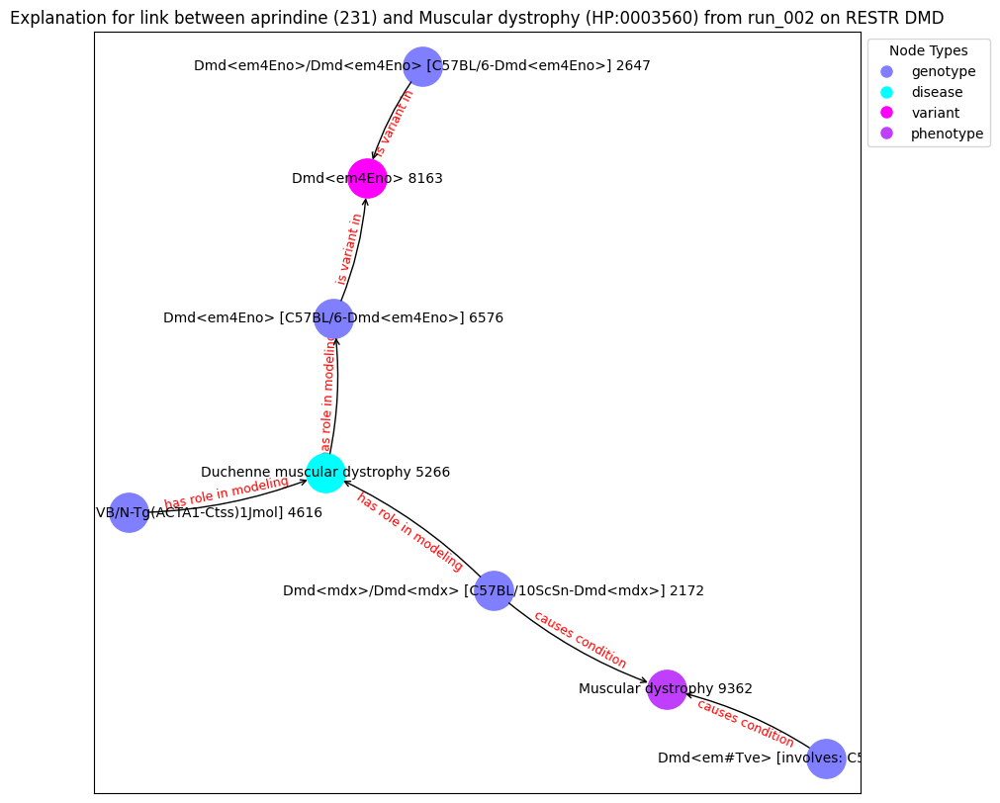

('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', {'type': 'genotype'})
('Dmd<em4Eno>/Dmd<em4Eno> [C57BL/6-Dmd<em4Eno>] 2647', {'type': 'genotype'})
('Dmd<em#Tve> [involves: C57BL/6 * CBA] 3487', {'type': 'genotype'})
('Tg(ACTA1-Ctss)1Jmol [FVB/N-Tg(ACTA1-Ctss)1Jmol] 4616', {'type': 'genotype'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Dmd<em4Eno> [C57BL/6-Dmd<em4Eno>] 6576', {'type': 'genotype'})
('Dmd<em4Eno> 8163', {'type': 'variant'})
('Muscular dystrophy 9362', {'type': 'phenotype'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', 'Duchenne muscular dystrophy 5266', {'label': 'has role in modeling'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>] 2172', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('Dmd<em4Eno>/Dmd<em4Eno> [C57BL/6-Dmd<em4Eno>] 2647', 'Dmd<em4Eno> 8163', {'label': 'is variant in'})
('Dmd<em#Tve> [involves: C57BL/6 * CBA] 3487', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('Tg(ACTA1-Ctss)1Jmol [FVB/N-Tg(ACTA1-Ctss)1Jmo

Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 357.44it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9640], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 364.17it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7706], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 392.01it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.6337], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 375.12it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.1506], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 373.29it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9652], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 367.23it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5672], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 368.35it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9857], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:02<00:00, 347.98it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0084], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 377.70it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9939], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 369.89it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


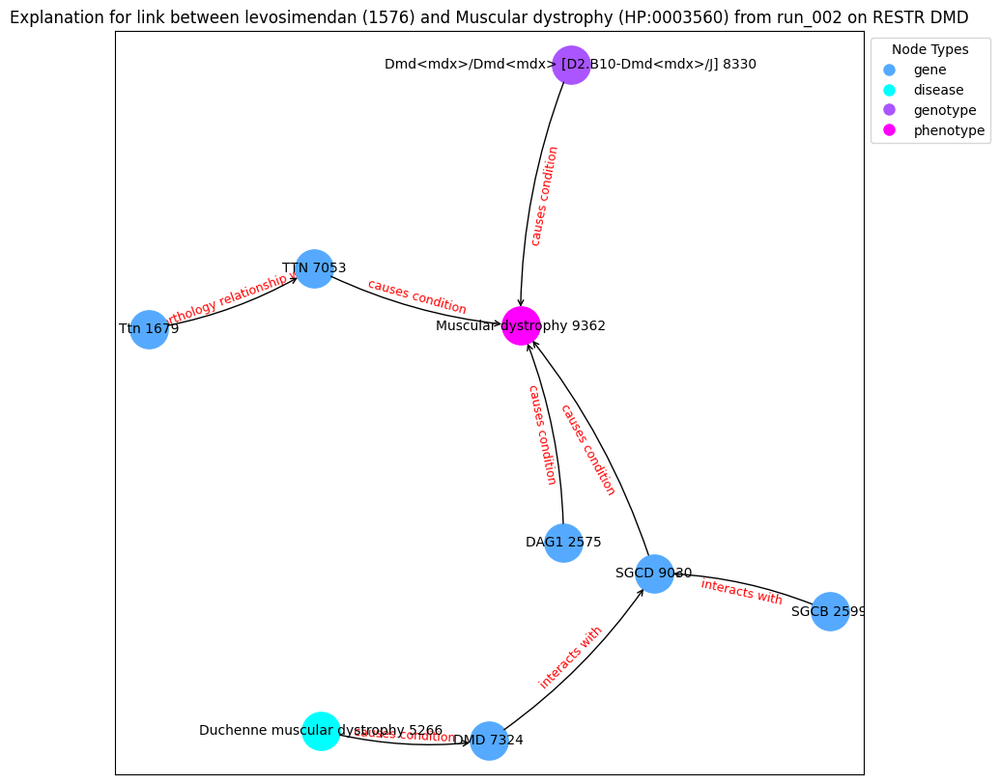

('Ttn 1679', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx> [D2.B10-Dmd<mdx>/J] 8330', {'type': 'genotype'})
('SGCD 9030', {'type': 'gene'})
('Muscular dystrophy 9362', {'type': 'phenotype'})
('Ttn 1679', 'TTN 7053', {'label': 'in orthology relationship with'})
('DAG1 2575', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('SGCB 2599', 'SGCD 9030', {'label': 'interacts with'})
('Duchenne muscular dystrophy 5266', 'DMD 7324', {'label': 'causes condition'})
('TTN 7053', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('DMD 7324', 'SGCD 9030', {'label': 'interacts with'})
('Dmd<mdx>/Dmd<mdx> [D2.B10-Dmd<mdx>/J] 8330', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('SGCD 9030', 'Muscular dystrophy 9362', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\D

Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 466.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8632], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 600.42it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7862], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 541.95it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8466], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 581.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1073], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 600.59it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0147], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 563.53it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5710], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 563.90it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9854], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 559.76it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1029], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 591.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9546], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 532.41it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic          label  semantic_id
1286      1286  HP:0003307  phenotype  Hyperlordosis            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9872], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 582.24it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8242], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 565.26it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9850], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 521.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9965], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 544.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9999], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 576.76it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2314], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 520.59it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1986], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 605.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9566], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 570.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9674], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 566.40it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9703], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 4932: 100%|██████████| 700/700 [00:01<00:00, 596.45it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic          label  semantic_id
1286      1286  HP:0003307  phenotype  Hyperlordosis            8
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.2215], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 520.35it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7992], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 603.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5108], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 562.53it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0108], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 588.34it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0613], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 552.42it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9150], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 533.66it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1188], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 572.70it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9604], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 567.90it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0014], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 514.60it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9982], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 564.51it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                      label  semantic_id
2062      2062  HP:0002093  phenotype  Respiratory insufficiency            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.7342], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 499.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8022], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 513.98it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9432], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 511.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8148], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 514.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0629], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 541.13it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8569], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 541.91it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9623], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 523.07it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9862], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 538.90it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4766], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 511.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9908], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 533.28it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                      label  semantic_id
2062      2062  HP:0002093  phenotype  Respiratory insufficiency            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.3021], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 564.27it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4041], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 482.23it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9349], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 534.97it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8231], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 550.95it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7203], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 548.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5728], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 481.70it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9852], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 542.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3553], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 533.72it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1430], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 507.52it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9015], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 480.27it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                    label  semantic_id
1436      1436  HP:0003202  phenotype  Skeletal muscle atrophy            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9979], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 591.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7584], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 567.44it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9268], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 572.99it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9561], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 543.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9992], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 579.50it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9244], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 579.39it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9957], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 577.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9951], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 585.39it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9820], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 541.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9883], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 4932: 100%|██████████| 700/700 [00:01<00:00, 539.24it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                    label  semantic_id
1436      1436  HP:0003202  phenotype  Skeletal muscle atrophy            8
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.6795], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 582.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2702], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 592.35it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8515], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 562.79it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9966], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 529.78it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1093], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 540.36it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9033], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 548.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8597], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 582.35it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6197], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 540.13it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3021], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 474.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1396], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 528.90it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
7346      7346  HP:0001265  phenotype  Hyporeflexia            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.8645], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 493.84it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.1553], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 529.77it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.2159], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 518.98it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2083], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 509.51it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.1954], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 493.55it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.5938], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 449.93it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.4049], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 521.56it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9351], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 505.08it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9281], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 516.33it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.1303], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 462.78it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


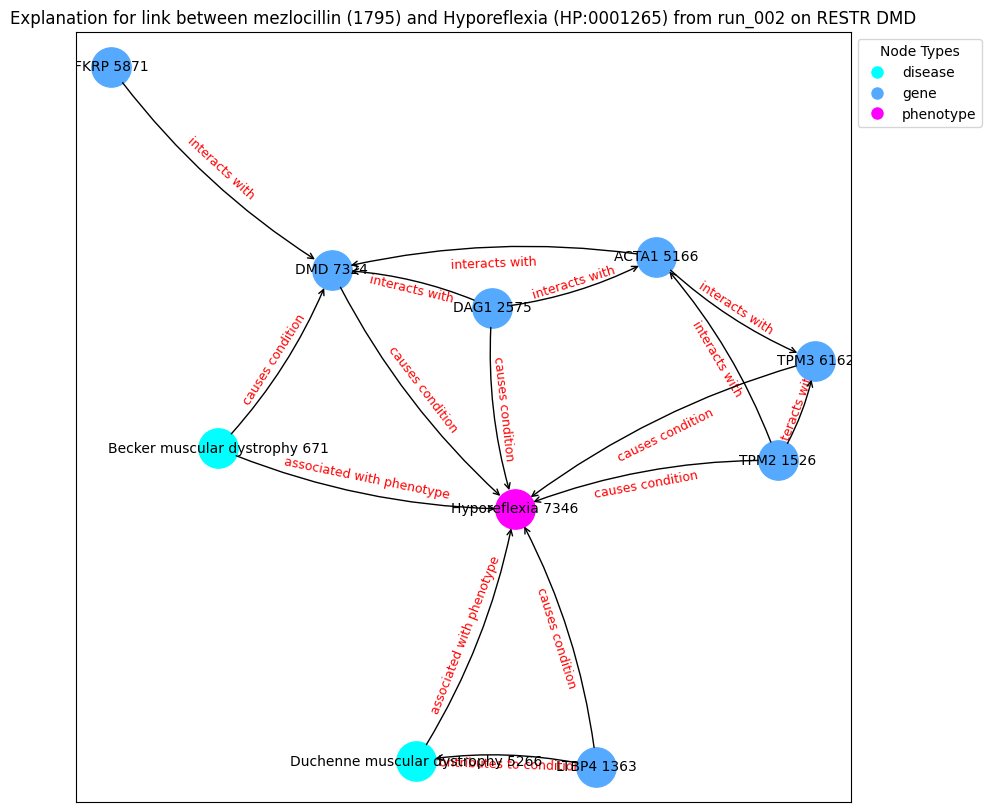

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Hyporeflexia 7346', {'label': 'associated with phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('TPM2 1526', 'Hyporeflexia 7346', {'label': 'causes condition'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'

Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 500.52it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.4215], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 512.37it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.1875], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 521.35it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.2146], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 514.43it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5197], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 440.40it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2656], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 510.51it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.6506], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 505.49it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.7230], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 522.46it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.6543], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 526.70it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.0497], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 528.44it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


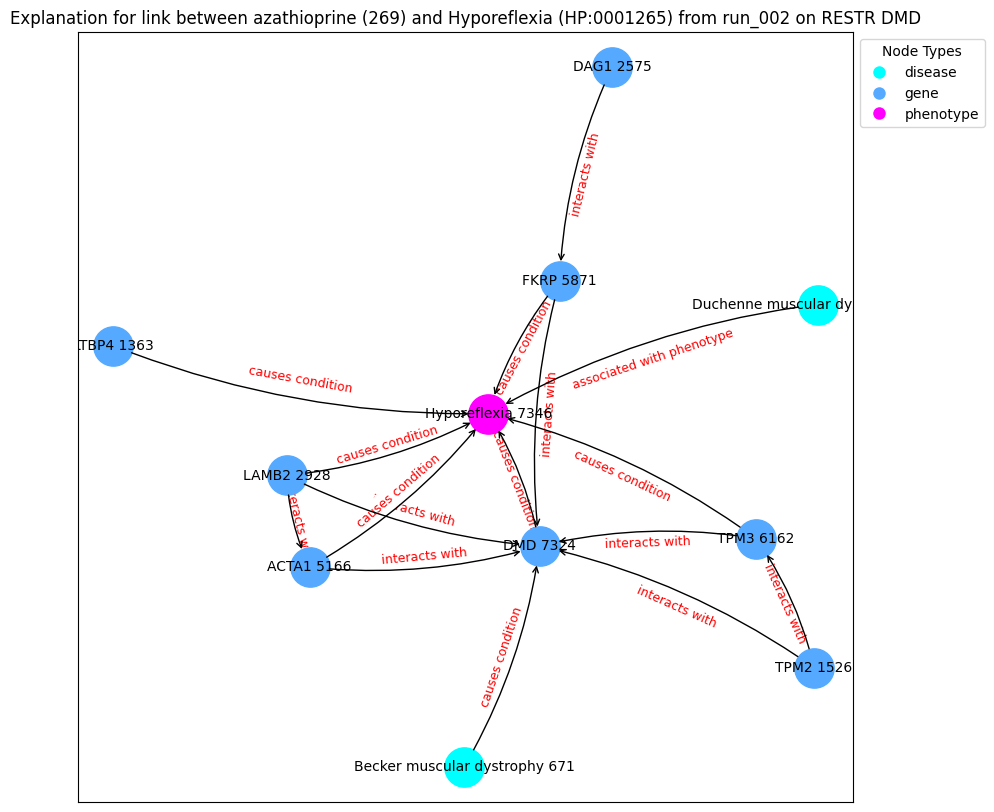

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'DMD 7324', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('LAMB2 2928', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'DMD 7324', {'label': 'interacts with'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('ACTA1 5166', 'DMD 7324', {'label': 'interacts with'})
('ACTA1 5166', 'Hyporeflexia 7346', 

Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 472.46it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.2565], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 520.48it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.5288], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 520.22it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.1376], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 480.45it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.4809], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 530.27it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.0424], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 505.83it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2266], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 467.69it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.0398], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 508.69it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.6445], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 495.61it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5969], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 507.63it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


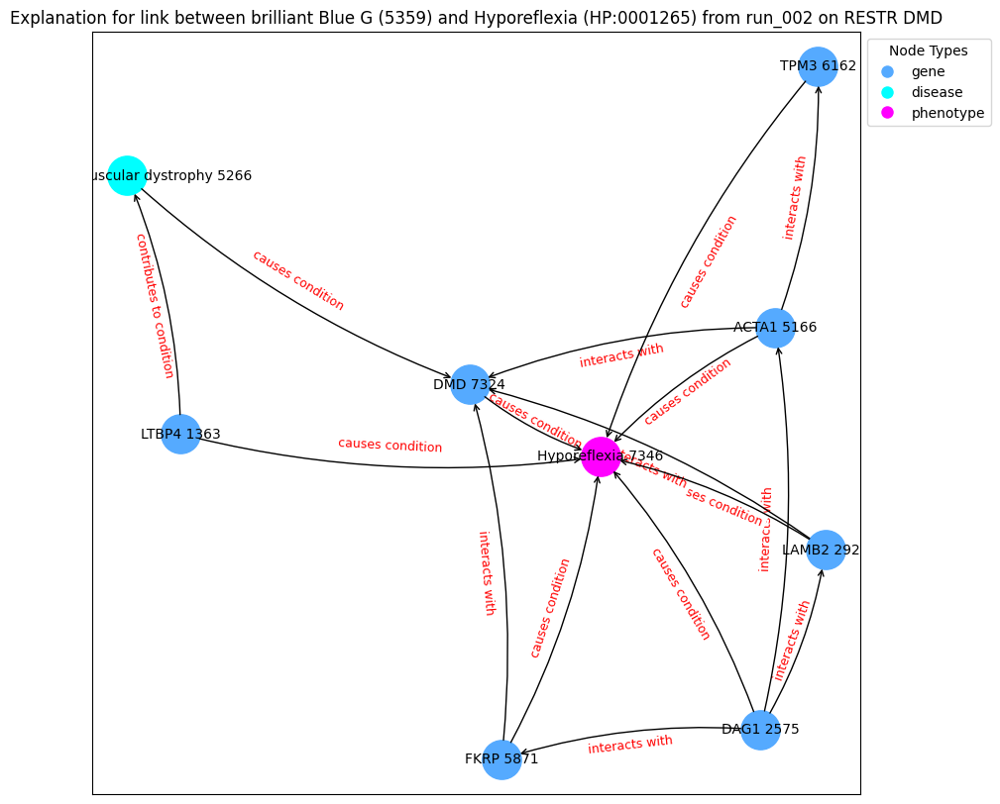

('LTBP4 1363', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'Hyporeflexia 7346', {'label': 'causes condition'})
('DAG1 2575', 'LAMB2 2928', {'label': 'interacts with'})
('LAMB2 2928', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'DMD 7324', {'label': 'interacts with'})
('ACTA1 5166', 'TPM3 6162', {'label': 'interacts with'})
('ACTA1 5166', 'DMD 7324', {'label': 'interacts with'})
('ACTA1 5166', 'Hyporeflexia 7346', {'labe

Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:02<00:00, 344.90it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0199], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 398.35it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9992], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 403.46it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.1263], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 405.79it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8540], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 411.34it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9725], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 422.60it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9462], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 412.77it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0783], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 376.76it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8618], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 418.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8466], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 410.69it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


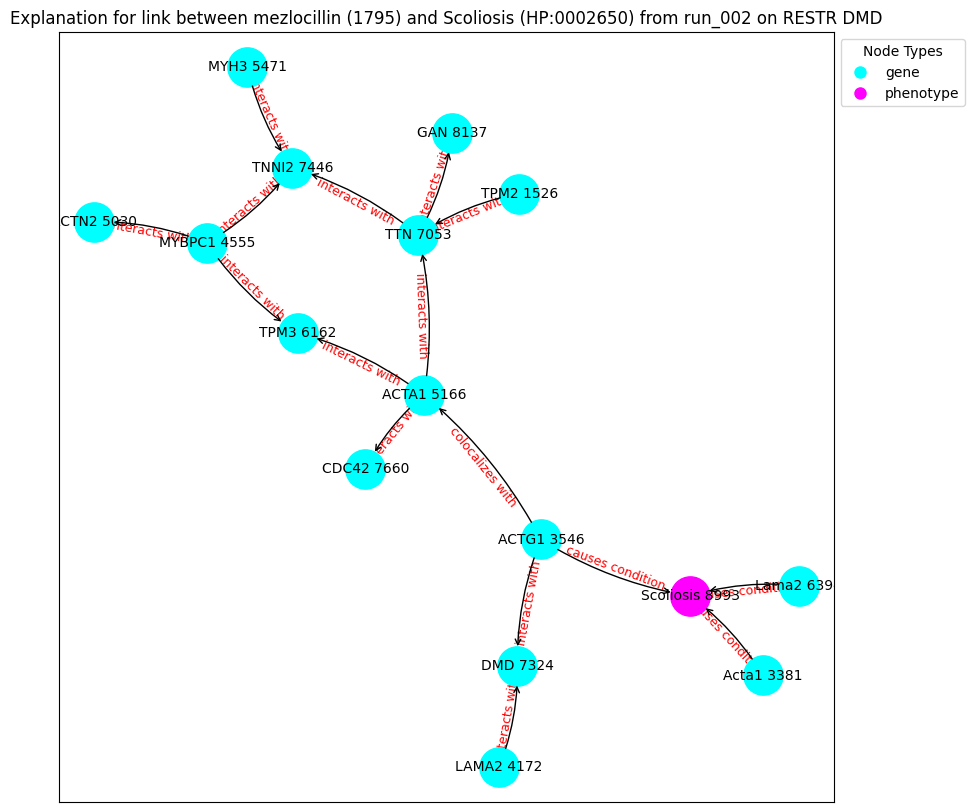

('TPM2 1526', {'type': 'gene'})
('Acta1 3381', {'type': 'gene'})
('ACTG1 3546', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('MYBPC1 4555', {'type': 'gene'})
('ACTN2 5030', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('MYH3 5471', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Lama2 6394', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('TNNI2 7446', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('GAN 8137', {'type': 'gene'})
('Scoliosis 8993', {'type': 'phenotype'})
('TPM2 1526', 'TTN 7053', {'label': 'interacts with'})
('Acta1 3381', 'Scoliosis 8993', {'label': 'causes condition'})
('ACTG1 3546', 'DMD 7324', {'label': 'interacts with'})
('ACTG1 3546', 'ACTA1 5166', {'label': 'colocalizes with'})
('ACTG1 3546', 'Scoliosis 8993', {'label': 'causes condition'})
('LAMA2 4172', 'DMD 7324', {'label': 'interacts with'})
('MYBPC1 4555', 'TNNI2 7446', {'label': 'interacts with'})
('MYBPC1 4555', 'TPM3 6162', {'label': 'interacts with'})

Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 389.99it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8516], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 384.58it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8059], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 432.47it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8796], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 382.91it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8313], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 410.10it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0869], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 399.89it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8143], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 412.21it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8850], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 395.64it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9634], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 408.72it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9806], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 361.62it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


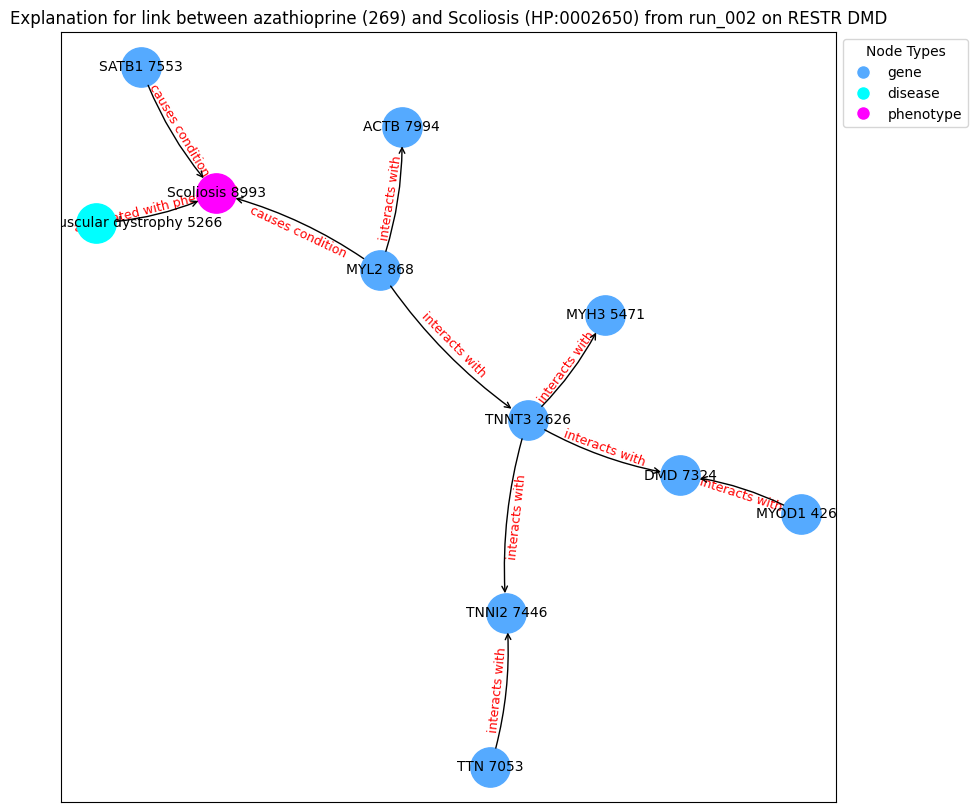

('MYL2 868', {'type': 'gene'})
('TNNT3 2626', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('MYH3 5471', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('TNNI2 7446', {'type': 'gene'})
('SATB1 7553', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('Scoliosis 8993', {'type': 'phenotype'})
('MYL2 868', 'TNNT3 2626', {'label': 'interacts with'})
('MYL2 868', 'ACTB 7994', {'label': 'interacts with'})
('MYL2 868', 'Scoliosis 8993', {'label': 'causes condition'})
('TNNT3 2626', 'MYH3 5471', {'label': 'interacts with'})
('TNNT3 2626', 'DMD 7324', {'label': 'interacts with'})
('TNNT3 2626', 'TNNI2 7446', {'label': 'interacts with'})
('MYOD1 4261', 'DMD 7324', {'label': 'interacts with'})
('Duchenne muscular dystrophy 5266', 'Scoliosis 8993', {'label': 'associated with phenotype'})
('TTN 7053', 'TNNI2 7446', {'label': 'interacts with'})
('SATB1 7553', 'Scoliosis 8993', {'label': 'causes condition

Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 416.91it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9038], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 461.56it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.3991], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 446.08it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9884], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 468.30it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7361], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 446.97it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9713], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 459.83it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8050], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 449.41it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9591], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 436.54it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8827], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 432.40it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8537], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 370: 100%|██████████| 700/700 [00:01<00:00, 489.71it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


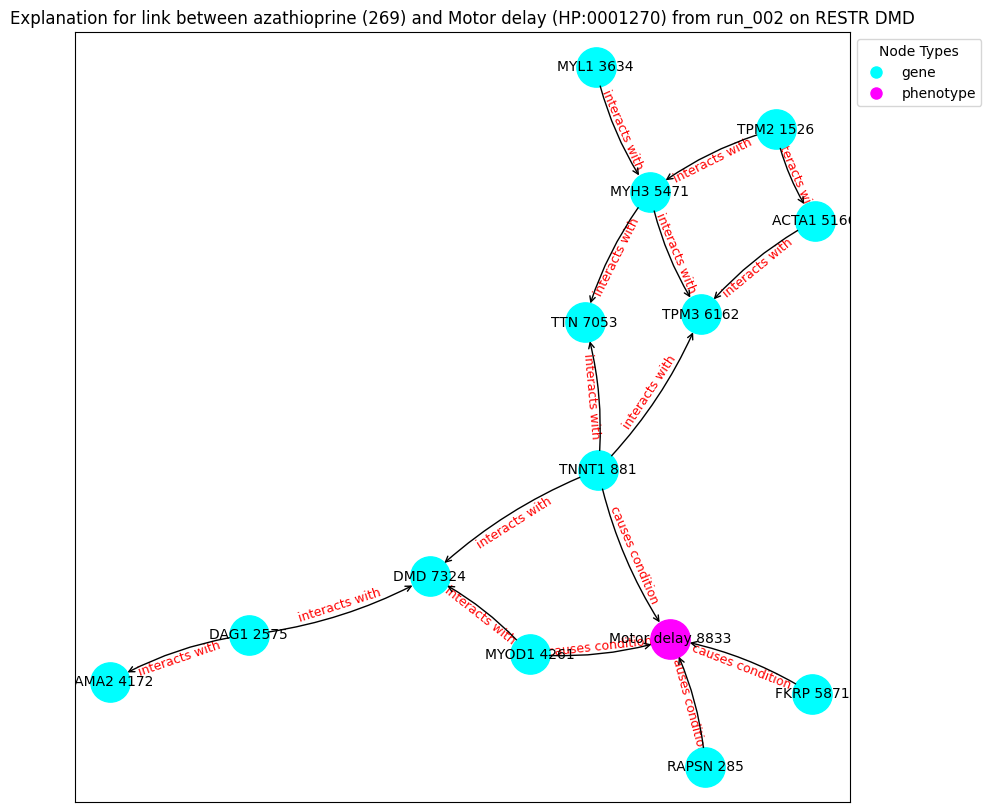

('RAPSN 285', {'type': 'gene'})
('TNNT1 881', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('MYL1 3634', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('MYH3 5471', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Motor delay 8833', {'type': 'phenotype'})
('RAPSN 285', 'Motor delay 8833', {'label': 'causes condition'})
('TNNT1 881', 'TPM3 6162', {'label': 'interacts with'})
('TNNT1 881', 'TTN 7053', {'label': 'interacts with'})
('TNNT1 881', 'DMD 7324', {'label': 'interacts with'})
('TNNT1 881', 'Motor delay 8833', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'MYH3 5471', {'label': 'interacts with'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'LAMA2 4172', {'label': 'interacts with'})
('MYL1 3634', 'MYH

Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 433.42it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.4974], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 401.68it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.4256], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 449.36it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8624], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 440.82it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.0151], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 439.73it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.2741], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 417.80it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.4140], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 454.85it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.2132], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 431.30it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.2401], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 443.03it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.6537], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 447.20it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


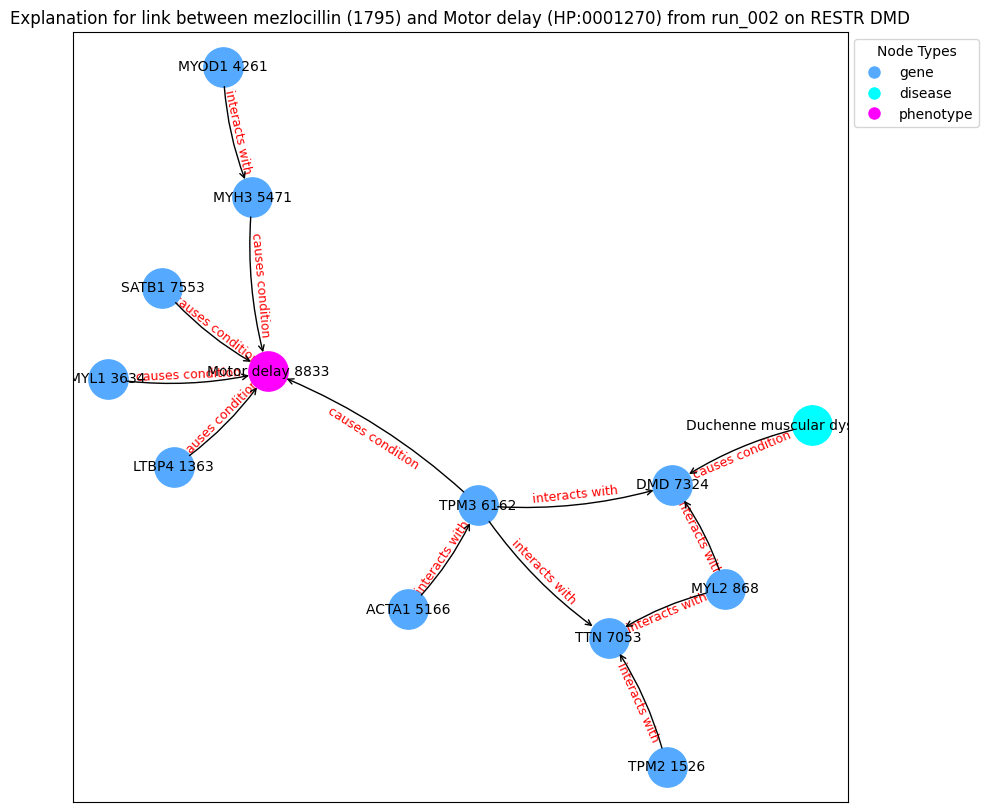

('MYL2 868', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('MYL1 3634', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('MYH3 5471', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SATB1 7553', {'type': 'gene'})
('Motor delay 8833', {'type': 'phenotype'})
('MYL2 868', 'DMD 7324', {'label': 'interacts with'})
('MYL2 868', 'TTN 7053', {'label': 'interacts with'})
('LTBP4 1363', 'Motor delay 8833', {'label': 'causes condition'})
('TPM2 1526', 'TTN 7053', {'label': 'interacts with'})
('MYL1 3634', 'Motor delay 8833', {'label': 'causes condition'})
('MYOD1 4261', 'MYH3 5471', {'label': 'interacts with'})
('ACTA1 5166', 'TPM3 6162', {'label': 'interacts with'})
('Duchenne muscular dystrophy 5266', 'DMD 7324', {'label': 'causes condition'})
('MYH3 5471', 'Motor delay 8833', {'label': 'causes condi

Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 426.26it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9187], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 433.19it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8998], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 470.00it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8951], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 420.98it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8052], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 466.72it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.5900], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 450.75it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9867], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 450.74it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9397], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 447.79it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9919], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 409.33it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8926], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 4932: 100%|██████████| 700/700 [00:01<00:00, 438.33it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


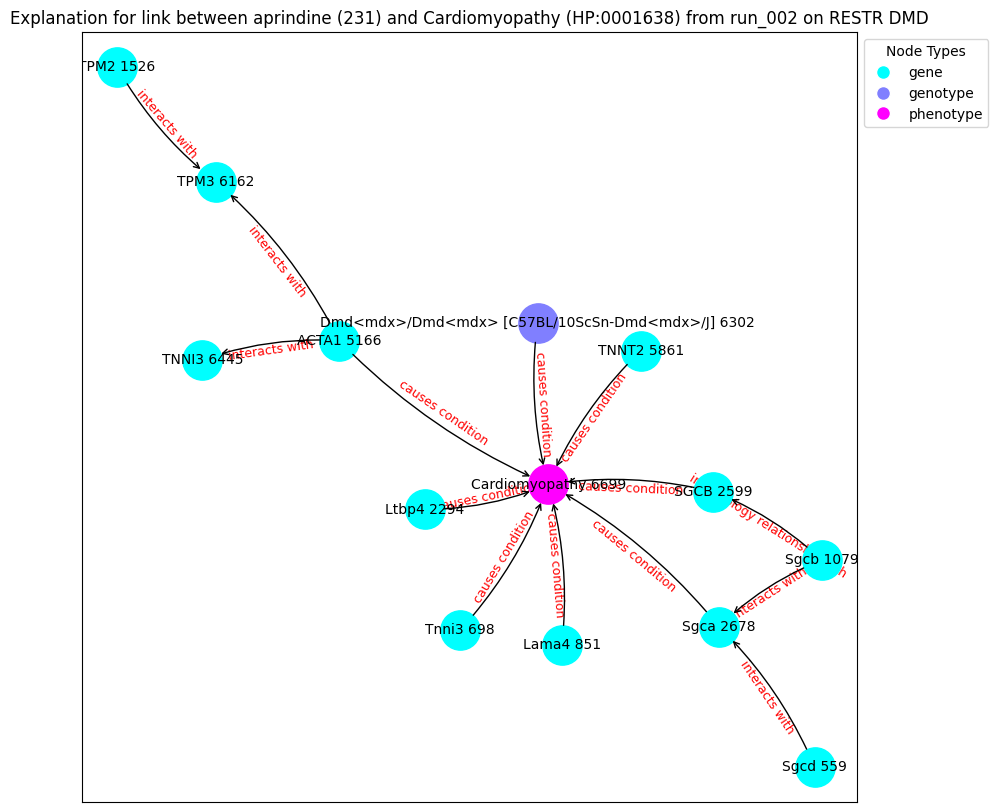

('Sgcd 559', {'type': 'gene'})
('Tnni3 698', {'type': 'gene'})
('Lama4 851', {'type': 'gene'})
('Sgcb 1079', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('Ltbp4 2294', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('Sgca 2678', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('TNNT2 5861', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 6302', {'type': 'genotype'})
('TNNI3 6445', {'type': 'gene'})
('Cardiomyopathy 6699', {'type': 'phenotype'})
('Sgcd 559', 'Sgca 2678', {'label': 'interacts with'})
('Tnni3 698', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Lama4 851', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Sgcb 1079', 'SGCB 2599', {'label': 'in orthology relationship with'})
('Sgcb 1079', 'Sgca 2678', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('Ltbp4 2294', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('SGCB 2599', 'Cardiomyopathy 6699', {'label': 

Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 435.58it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9134], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 436.06it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6887], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 417.64it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8428], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 453.14it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6000], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 435.51it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9959], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 451.35it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6924], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 395.61it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.2338], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 423.88it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9881], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 466.14it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9924], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 108: 100%|██████████| 700/700 [00:01<00:00, 481.53it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


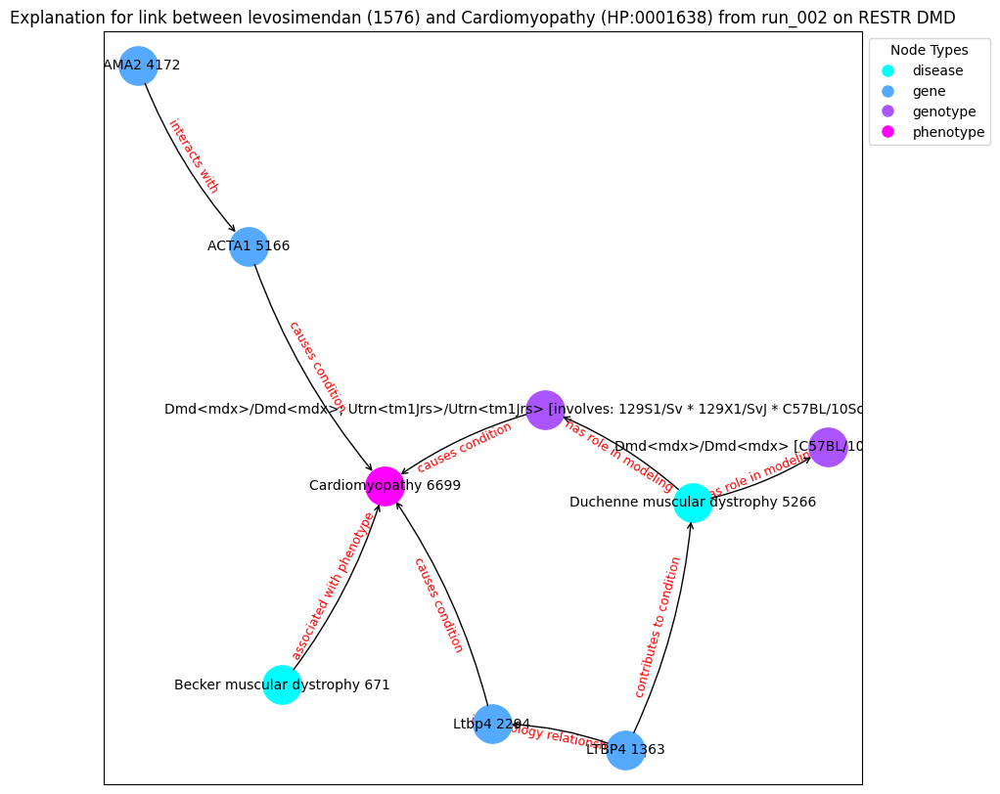

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('Ltbp4 2294', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 6302', {'type': 'genotype'})
('Dmd<mdx>/Dmd<mdx>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 6430', {'type': 'genotype'})
('Cardiomyopathy 6699', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Cardiomyopathy 6699', {'label': 'associated with phenotype'})
('LTBP4 1363', 'Ltbp4 2294', {'label': 'in orthology relationship with'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('Ltbp4 2294', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('LAMA2 4172', 'ACTA1 5166', {'label': 'interacts with'})
('ACTA1 5166', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('Duchenne muscular dystrophy 5266', 'Dmd<mdx>/Dmd<m

Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 422.29it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.1130], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 448.71it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.6299], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 436.07it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.0061], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 426.88it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.0434], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 470.83it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.3421], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 471.73it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.7648], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 466.49it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9183], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 418.23it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8155], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 457.91it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.7767], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6699 and 468: 100%|██████████| 700/700 [00:01<00:00, 443.17it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


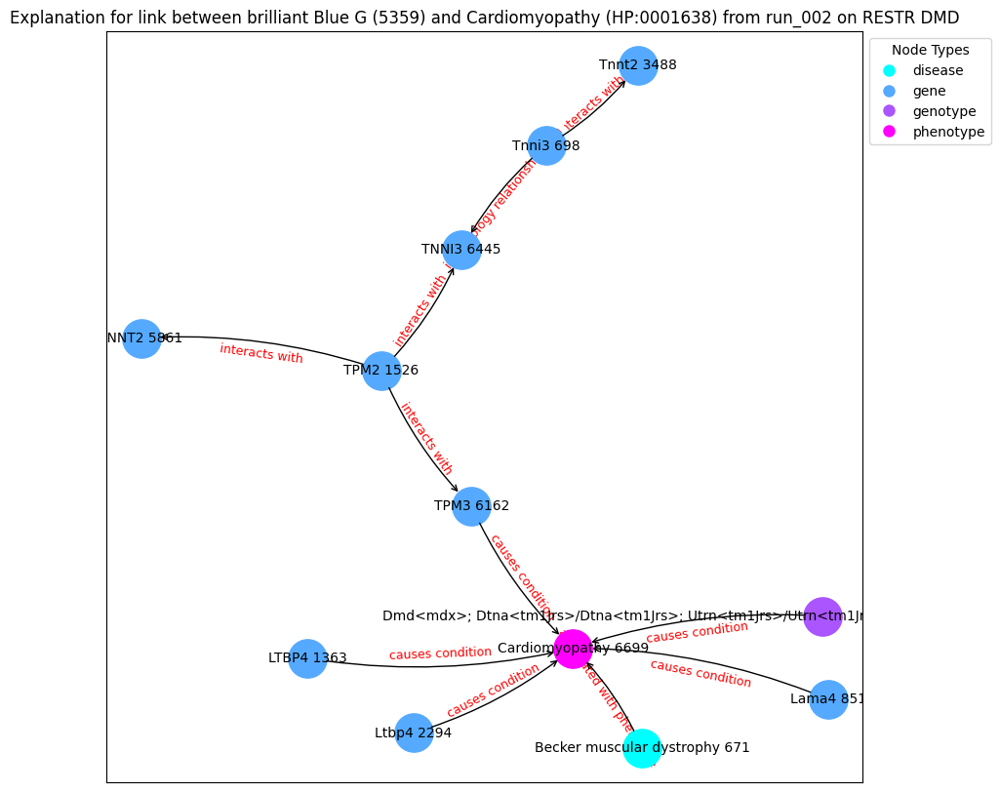

('Becker muscular dystrophy 671', {'type': 'disease'})
('Tnni3 698', {'type': 'gene'})
('Lama4 851', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('Ltbp4 2294', {'type': 'gene'})
('Tnnt2 3488', {'type': 'gene'})
('Dmd<mdx>; Dtna<tm1Jrs>/Dtna<tm1Jrs>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 3940', {'type': 'genotype'})
('TNNT2 5861', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('TNNI3 6445', {'type': 'gene'})
('Cardiomyopathy 6699', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Cardiomyopathy 6699', {'label': 'associated with phenotype'})
('Tnni3 698', 'Tnnt2 3488', {'label': 'interacts with'})
('Tnni3 698', 'TNNI3 6445', {'label': 'in orthology relationship with'})
('Lama4 851', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('LTBP4 1363', 'Cardiomyopathy 6699', {'label': 'causes condition'})
('TPM2 1526', 'TNNT2 5861', {'label': 'interacts with'})
('TPM2 1526', 'TNNI3 6445', {'label': 'int

Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 498.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9836], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 527.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8960], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 553.70it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0243], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 586.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8803], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 567.91it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9981], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 547.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4898], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 501.83it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1151], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 586.01it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1989], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 530.58it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1273], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 7729: 100%|██████████| 700/700 [00:01<00:00, 572.45it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                     label  semantic_id
1163      1163  HP:0003701  phenotype  Proximal muscle weakness            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9425], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 545.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3764], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 593.06it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9927], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 517.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9990], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 601.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5554], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 579.27it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7291], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 512.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9584], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 603.44it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9219], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 587.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4347], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 514.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4952], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 4932: 100%|██████████| 700/700 [00:01<00:00, 547.77it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                     label  semantic_id
1163      1163  HP:0003701  phenotype  Proximal muscle weakness            8
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.8742], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 559.53it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3325], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 549.33it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0866], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 555.58it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8915], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 579.95it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9975], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 586.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5370], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 572.97it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5696], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 499.36it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2570], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 546.76it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9351], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 575.64it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2005], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1163 and 108: 100%|██████████| 700/700 [00:01<00:00, 589.37it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic                          label  \
10461     10461  HP:0003707  phenotype  Calf muscle pseudohypertrophy   

       semantic_id  
10461            8  
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9495], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 469.62it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.6523], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 475.43it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9193], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 495.44it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9732], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 503.11it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5021], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 449.58it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9885], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 520.10it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9818], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 491.69it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.5240], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 482.47it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9934], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 455.95it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.3122], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10461 and 4932: 100%|██████████| 700/700 [00:01<00:00, 474.70it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


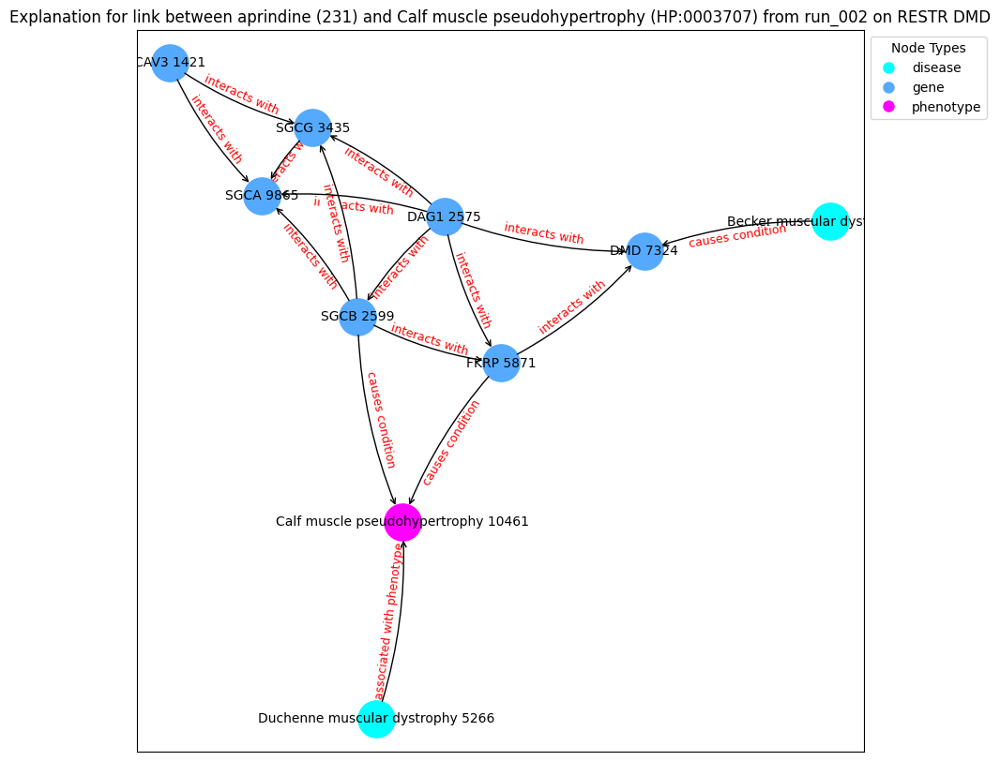

('Becker muscular dystrophy 671', {'type': 'disease'})
('CAV3 1421', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SGCA 9865', {'type': 'gene'})
('Calf muscle pseudohypertrophy 10461', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('CAV3 1421', 'SGCG 3435', {'label': 'interacts with'})
('CAV3 1421', 'SGCA 9865', {'label': 'interacts with'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'SGCB 2599', {'label': 'interacts with'})
('DAG1 2575', 'SGCG 3435', {'label': 'interacts with'})
('DAG1 2575', 'SGCA 9865', {'label': 'interacts with'})
('SGCB 2599', 'Calf muscle pseudohypertrophy 10461', {'label': 'causes condition'})
('SGCB 2599', 'FKRP 5871', {'label': 'interacts w

Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 551.58it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7663], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 565.46it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0031], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 548.51it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2218], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 587.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 527.80it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7225], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 562.71it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0863], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 544.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0435], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 572.40it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0085], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 568.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8165], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 468: 100%|██████████| 700/700 [00:01<00:00, 544.95it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                          label  \
2571      2571  HP:0001256  phenotype  Intellectual disability, mild   

      semantic_id  
2571            8  
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.2670], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 550.01it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4064], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 572.94it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9843], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 584.82it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9681], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 596.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8026], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 531.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9871], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 568.58it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0072], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 587.53it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8845], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 567.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9267], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 593.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8240], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2571 and 370: 100%|██████████| 700/700 [00:01<00:00, 499.17it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                   label  semantic_id
9426      9426  HP:0001644  phenotype  Dilated cardiomyopathy            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.8596], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 359.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8337], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 375.07it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9560], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 376.85it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9996], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 381.30it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.3628], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 373.17it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9264], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 385.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9897], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 385.12it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9985], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 403.30it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9166], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 386.89it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9846], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 4932: 100%|██████████| 700/700 [00:01<00:00, 400.79it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


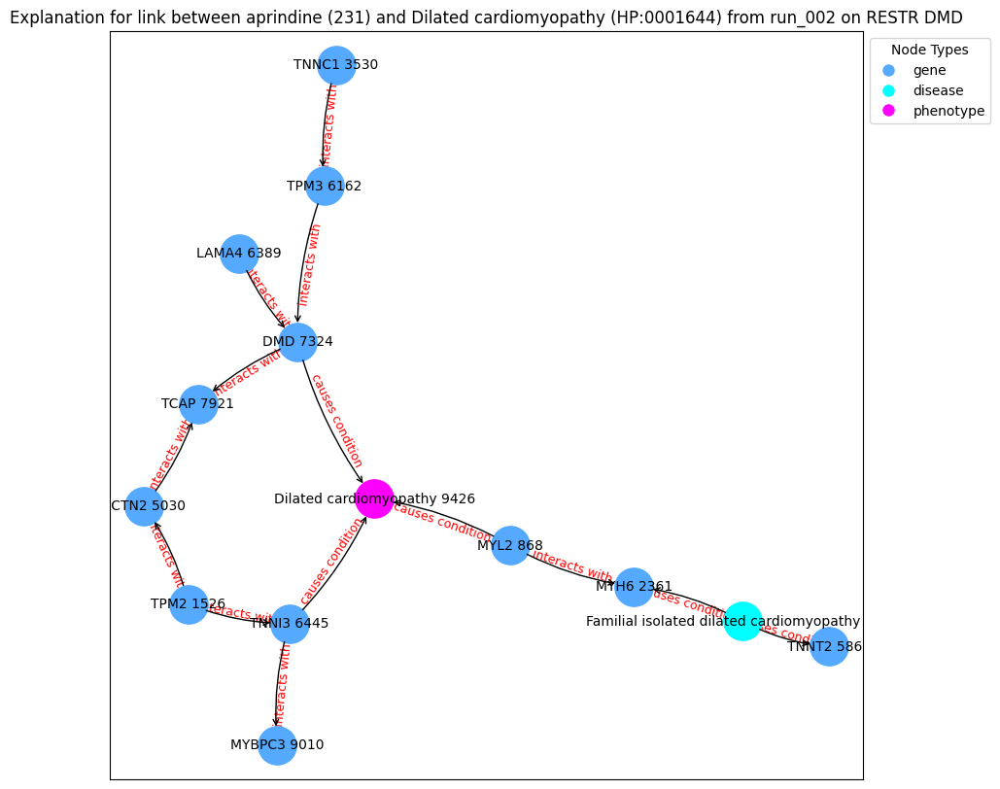

('MYL2 868', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('Familial isolated dilated cardiomyopathy 1933', {'type': 'disease'})
('MYH6 2361', {'type': 'gene'})
('TNNC1 3530', {'type': 'gene'})
('ACTN2 5030', {'type': 'gene'})
('TNNT2 5861', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('LAMA4 6389', {'type': 'gene'})
('TNNI3 6445', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('TCAP 7921', {'type': 'gene'})
('MYBPC3 9010', {'type': 'gene'})
('Dilated cardiomyopathy 9426', {'type': 'phenotype'})
('MYL2 868', 'MYH6 2361', {'label': 'interacts with'})
('MYL2 868', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
('TPM2 1526', 'TNNI3 6445', {'label': 'interacts with'})
('TPM2 1526', 'ACTN2 5030', {'label': 'interacts with'})
('Familial isolated dilated cardiomyopathy 1933', 'TNNT2 5861', {'label': 'causes condition'})
('Familial isolated dilated cardiomyopathy 1933', 'MYH6 2361', {'label': 'causes condition'})
('TNNC1 3530', 'TPM3 6162', {'label': 'interacts wit

Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 355.18it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9925], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 382.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9641], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 371.01it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9900], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 365.16it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9931], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 380.38it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9729], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 375.76it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9337], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 367.83it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9832], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 381.96it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9129], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 380.69it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5913], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9426 and 108: 100%|██████████| 700/700 [00:01<00:00, 402.16it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


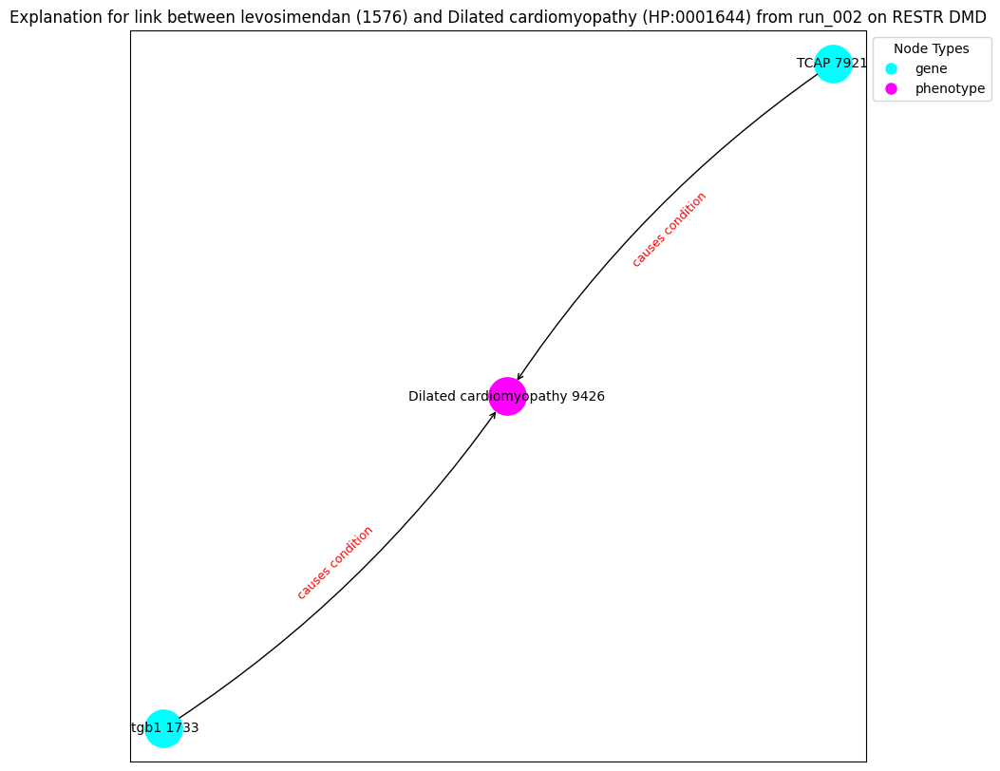

('Itgb1 1733', {'type': 'gene'})
('TCAP 7921', {'type': 'gene'})
('Dilated cardiomyopathy 9426', {'type': 'phenotype'})
('Itgb1 1733', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
('TCAP 7921', 'Dilated cardiomyopathy 9426', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_28_run_002_graph.gpickle
Explanation pair ids and names saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_28_run_002_pair.pkl
node1:
      index_id          id   semantic                        label  \
7911      7911  HP:0003323  phenotype  Progressive muscle weakness   

      semantic_id  
7911            8  
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9362], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 391.59it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9890], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 450.37it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9922], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 463.59it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9585], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 443.77it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8718], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 443.83it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9929], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 436.90it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9924], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 459.93it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5904], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 439.67it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.6700], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 454.82it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.5062], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 4932: 100%|██████████| 700/700 [00:01<00:00, 450.03it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


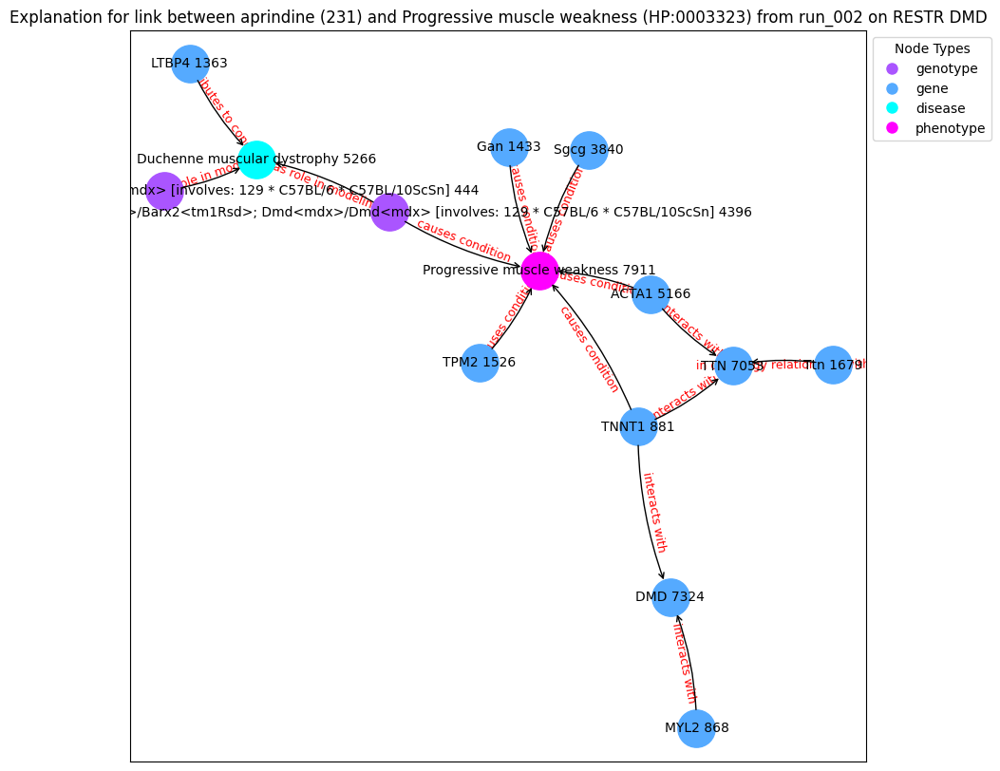

('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 444', {'type': 'genotype'})
('MYL2 868', {'type': 'gene'})
('TNNT1 881', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('Gan 1433', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('Ttn 1679', {'type': 'gene'})
('Sgcg 3840', {'type': 'gene'})
('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx>/Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 4396', {'type': 'genotype'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Progressive muscle weakness 7911', {'type': 'phenotype'})
('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 444', 'Duchenne muscular dystrophy 5266', {'label': 'has role in modeling'})
('MYL2 868', 'DMD 7324', {'label': 'interacts with'})
('TNNT1 881', 'Progressive muscle weakness 7911', {'label': 'causes condition'})
('TNNT1 881', 'TTN 7053', {'label': 'interac

Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 437.48it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.6850], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 455.31it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9407], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 412.83it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.5655], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 452.50it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6887], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 443.99it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.7470], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 453.58it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9946], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 409.66it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8805], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 390.60it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.6407], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 395.75it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9967], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7911 and 108: 100%|██████████| 700/700 [00:01<00:00, 392.18it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


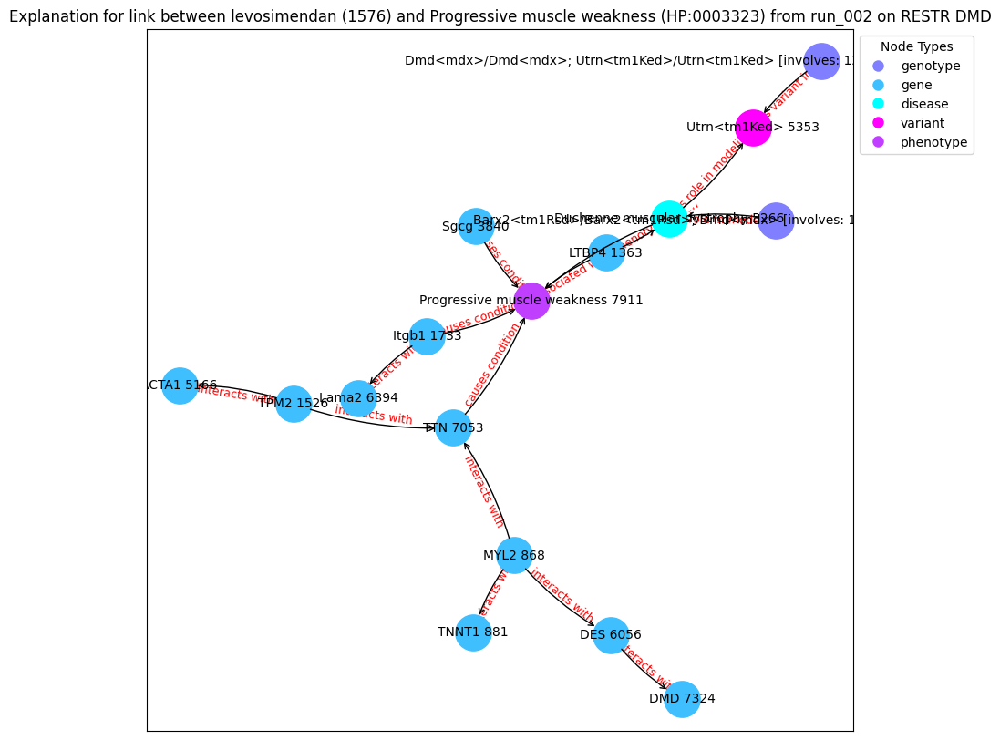

('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 444', {'type': 'genotype'})
('MYL2 868', {'type': 'gene'})
('TNNT1 881', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('Itgb1 1733', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx>; Utrn<tm1Ked>/Utrn<tm1Ked> [involves: 129S1/Sv * 129X1/SvJ * C57BL/6 * C57BL/10ScSn * DBA] 2925', {'type': 'genotype'})
('Sgcg 3840', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Utrn<tm1Ked> 5353', {'type': 'variant'})
('DES 6056', {'type': 'gene'})
('Lama2 6394', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Progressive muscle weakness 7911', {'type': 'phenotype'})
('Barx2<tm1Rsd>/Barx2<tm1Rsd>; Dmd<mdx> [involves: 129 * C57BL/6 * C57BL/10ScSn] 444', 'Duchenne muscular dystrophy 5266', {'label': 'has role in modeling'})
('MYL2 868', 'DES 6056', {'label': 'interacts with'})
('MYL2 868', 'TNNT1 881', 

Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 351.53it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9754], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 444.92it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.1239], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 511.78it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7186], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 463.81it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.1292], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 503.14it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2889], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 469.52it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.7472], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 450.87it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9462], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 490.56it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9777], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 505.48it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.0099], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 7729: 100%|██████████| 700/700 [00:01<00:00, 481.93it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


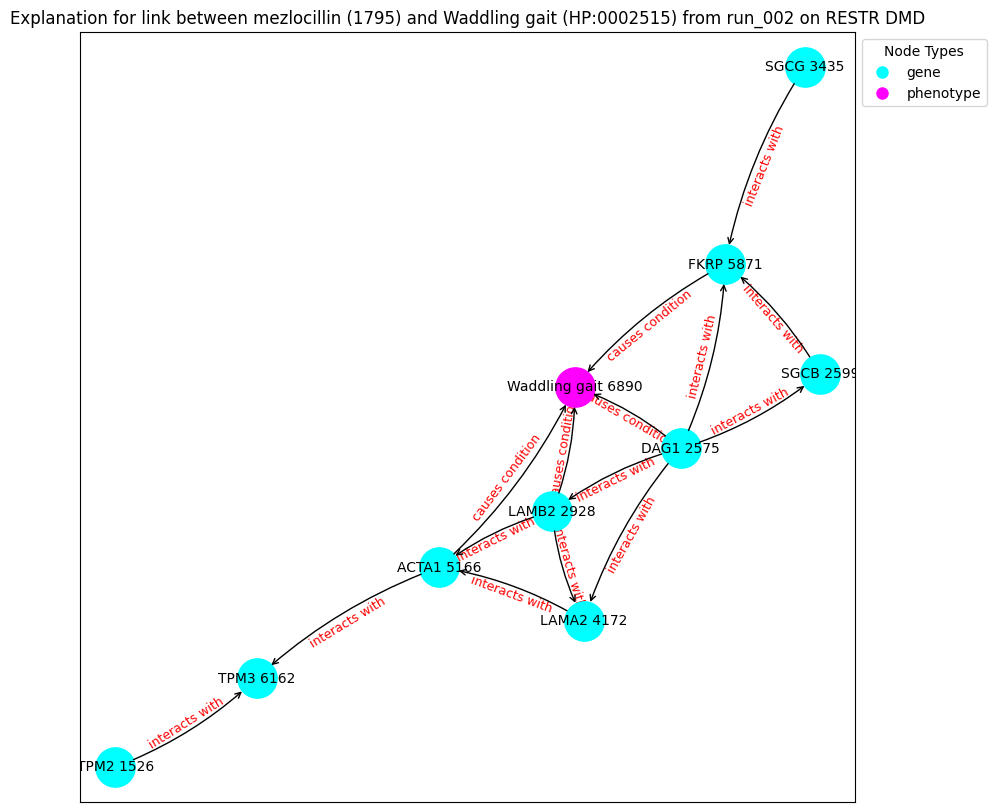

('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Waddling gait 6890', {'type': 'phenotype'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'SGCB 2599', {'label': 'interacts with'})
('DAG1 2575', 'LAMA2 4172', {'label': 'interacts with'})
('DAG1 2575', 'Waddling gait 6890', {'label': 'causes condition'})
('DAG1 2575', 'LAMB2 2928', {'label': 'interacts with'})
('SGCB 2599', 'FKRP 5871', {'label': 'interacts with'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('LAMB2 2928', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('SGCG 3435', 'FKRP 5871', {'label': 'interacts with'})
('LAMA2 4172', 'AC

Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 467.84it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9026], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 518.53it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.0565], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 486.83it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5619], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 494.81it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.7280], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 442.77it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.2288], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 457.88it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 500.45it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.2108], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 495.77it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.5152], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 496.52it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7151], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 370: 100%|██████████| 700/700 [00:01<00:00, 486.51it/s]


Contribution threshold is tensor(0.0063)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


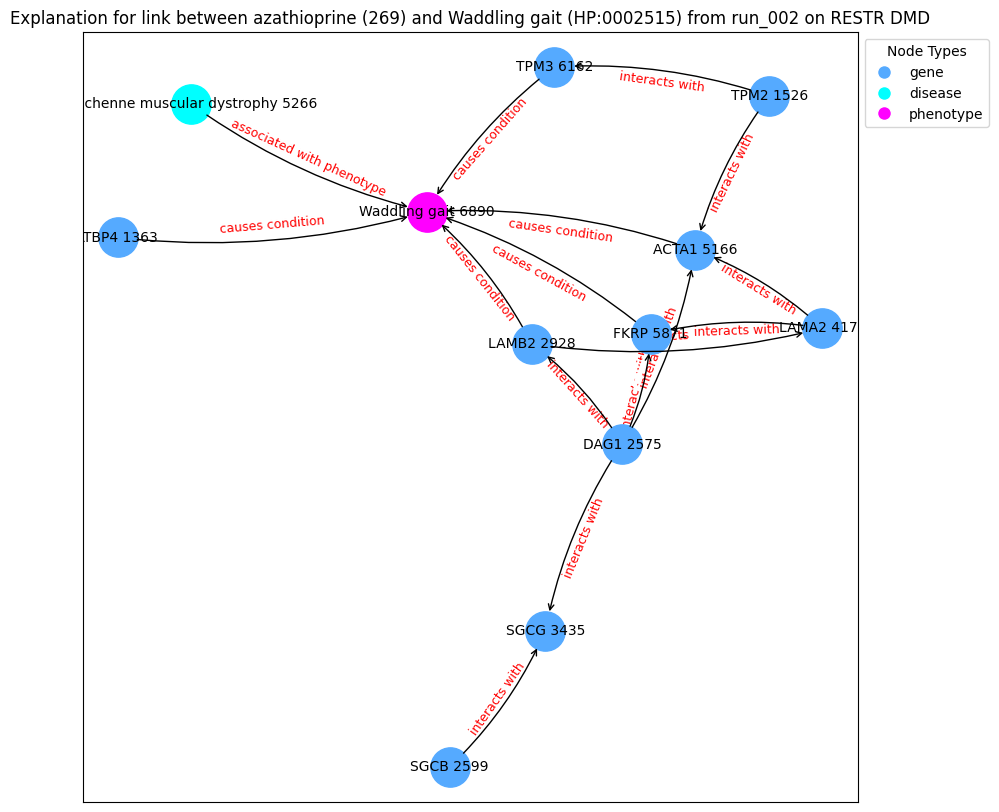

('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Waddling gait 6890', {'type': 'phenotype'})
('LTBP4 1363', 'Waddling gait 6890', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'SGCG 3435', {'label': 'interacts with'})
('DAG1 2575', 'LAMB2 2928', {'label': 'interacts with'})
('SGCB 2599', 'SGCG 3435', {'label': 'interacts with'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('LAMB2 2928', 'Waddling gait 6890', {'label': 'cau

Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 474.32it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.4518], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 496.09it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 479.63it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.7736], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 514.37it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9853], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 497.41it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8716], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 517.17it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.4677], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 462.43it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8178], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 493.82it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.0015], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 490.83it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2559], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6890 and 468: 100%|██████████| 700/700 [00:01<00:00, 506.67it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


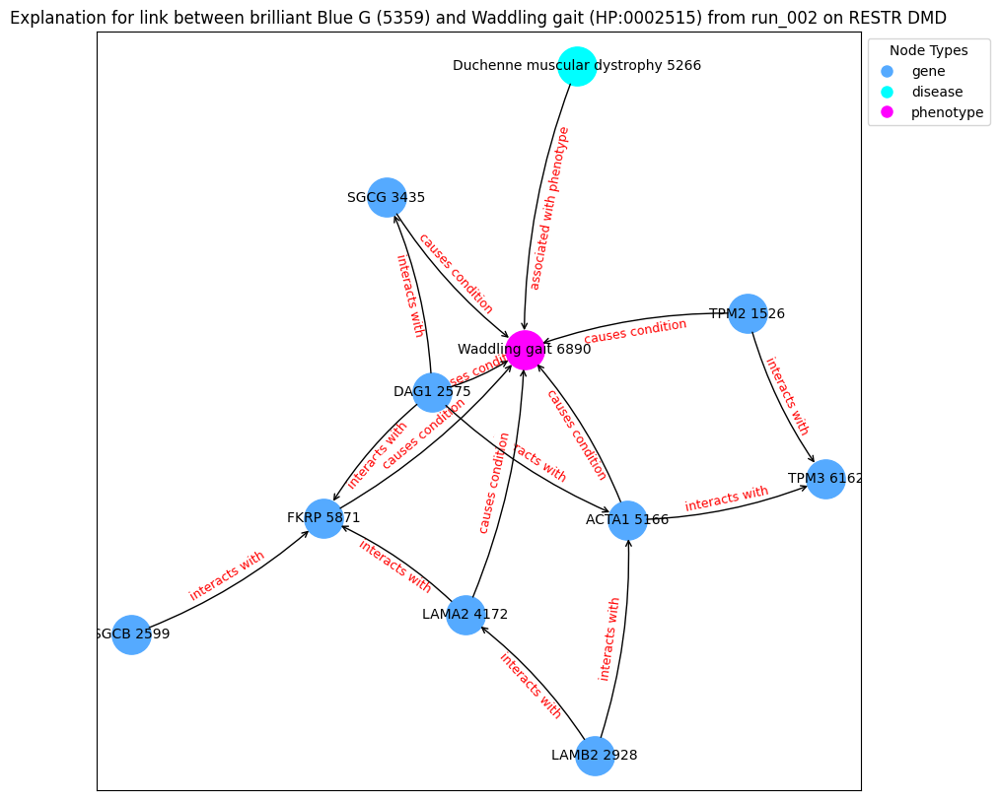

('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Waddling gait 6890', {'type': 'phenotype'})
('TPM2 1526', 'Waddling gait 6890', {'label': 'causes condition'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'SGCG 3435', {'label': 'interacts with'})
('DAG1 2575', 'Waddling gait 6890', {'label': 'causes condition'})
('SGCB 2599', 'FKRP 5871', {'label': 'interacts with'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('SGCG 3435', 'Waddling gait 6890', {'label': 'causes condition'})
('LAMA2

Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 528.59it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9497], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 548.95it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9243], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 556.83it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9642], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 520.64it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9516], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 513.06it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9585], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 531.10it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8263], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 552.67it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8877], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 552.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9629], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 555.49it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 468: 100%|██████████| 700/700 [00:01<00:00, 544.22it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                 label  semantic_id
5560      5560  HP:0100543  phenotype  Cognitive impairment            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9567], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 512.53it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2983], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 508.33it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5651], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 506.03it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9898], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 572.15it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5364], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 504.64it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9486], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 526.93it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8154], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 518.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7444], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 525.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4585], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 547.43it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4743], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 7729: 100%|██████████| 700/700 [00:01<00:00, 466.79it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                 label  semantic_id
5560      5560  HP:0100543  phenotype  Cognitive impairment            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.5012], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 551.41it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9233], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 512.60it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3800], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 496.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6251], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 534.83it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5191], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 552.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6248], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 519.66it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6296], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 520.49it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5988], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 536.48it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5877], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 534.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3628], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5560 and 370: 100%|██████████| 700/700 [00:01<00:00, 489.35it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic            label  semantic_id
10980     10980  HP:0002791  phenotype  Hypoventilation            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.0320], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 559.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1825], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 531.87it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8191], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 564.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4800], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 488.68it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9630], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 586.31it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7504], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 565.58it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5791], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 563.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5273], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 573.64it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3276], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 503.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2600], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 370: 100%|██████████| 700/700 [00:01<00:00, 566.93it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic            label  semantic_id
10980     10980  HP:0002791  phenotype  Hypoventilation            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.5677], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 530.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1299], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 544.50it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2010], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 544.31it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3734], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 536.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6442], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 510.87it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5664], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 532.52it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1723], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 533.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4381], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 507.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1122], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 552.02it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7208], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10980 and 7729: 100%|██████████| 700/700 [00:01<00:00, 544.04it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                       label  semantic_id
8020      8020  HP:0001263  phenotype  Global developmental delay            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9961], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 405.70it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9569], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 402.96it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9498], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 387.98it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9763], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 412.83it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9954], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 427.58it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9874], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 380.09it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9963], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 423.49it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9915], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 408.77it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9933], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 408.41it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9786], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 7729: 100%|██████████| 700/700 [00:01<00:00, 417.39it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


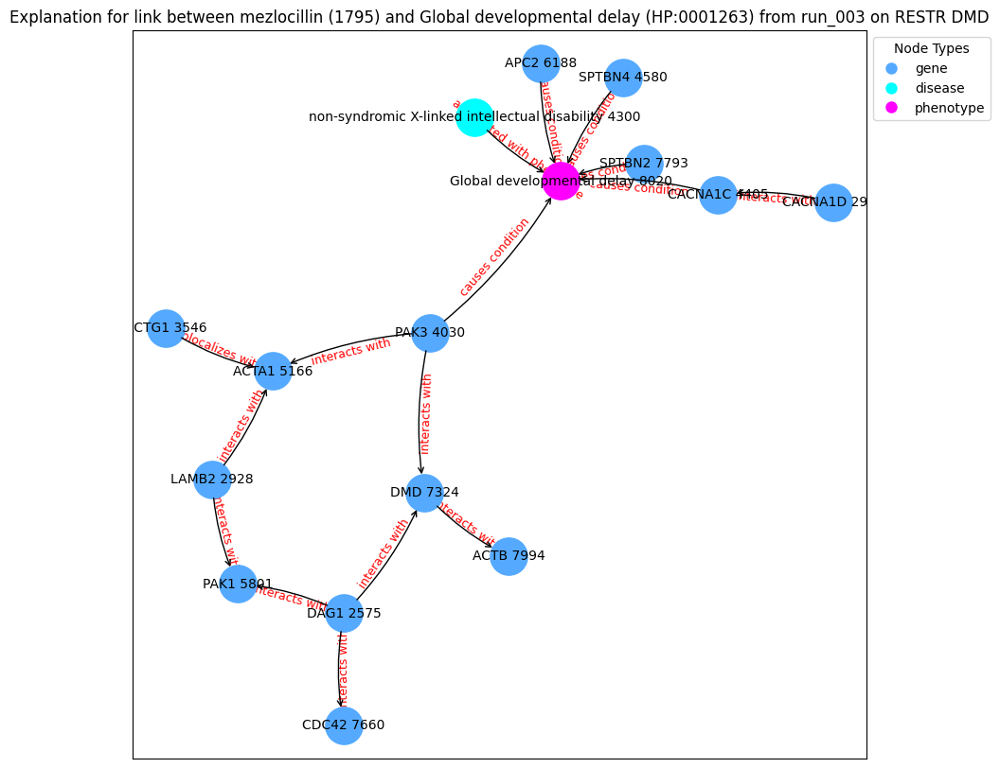

('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('CACNA1D 2956', {'type': 'gene'})
('ACTG1 3546', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('CACNA1C 4405', {'type': 'gene'})
('SPTBN4 4580', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('APC2 6188', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('SPTBN2 7793', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('Global developmental delay 8020', {'type': 'phenotype'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'PAK1 5801', {'label': 'interacts with'})
('DAG1 2575', 'CDC42 7660', {'label': 'interacts with'})
('LAMB2 2928', 'PAK1 5801', {'label': 'interacts with'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('CACNA1D 2956', 'CACNA1C 4405', {'label': 'interacts with'})
('ACTG1 3546', 'ACTA1 5166', {'label': 'colocalizes with'}

Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 364.65it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9962], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 410.28it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9535], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 384.57it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9792], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 424.75it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8620], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 404.58it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9722], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 425.67it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8384], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 393.35it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.2781], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 434.76it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9476], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 414.00it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9940], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 370: 100%|██████████| 700/700 [00:01<00:00, 411.30it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


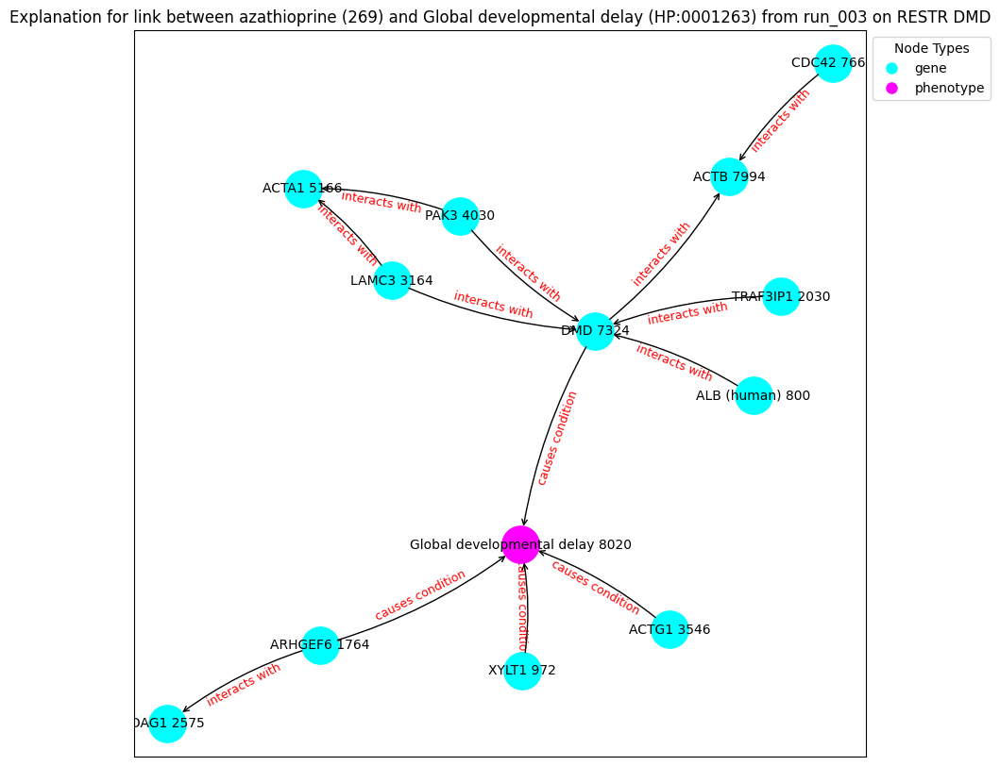

('ALB (human) 800', {'type': 'gene'})
('XYLT1 972', {'type': 'gene'})
('ARHGEF6 1764', {'type': 'gene'})
('TRAF3IP1 2030', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMC3 3164', {'type': 'gene'})
('ACTG1 3546', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('Global developmental delay 8020', {'type': 'phenotype'})
('ALB (human) 800', 'DMD 7324', {'label': 'interacts with'})
('XYLT1 972', 'Global developmental delay 8020', {'label': 'causes condition'})
('ARHGEF6 1764', 'DAG1 2575', {'label': 'interacts with'})
('ARHGEF6 1764', 'Global developmental delay 8020', {'label': 'causes condition'})
('TRAF3IP1 2030', 'DMD 7324', {'label': 'interacts with'})
('LAMC3 3164', 'ACTA1 5166', {'label': 'interacts with'})
('LAMC3 3164', 'DMD 7324', {'label': 'interacts with'})
('ACTG1 3546', 'Global developmental delay 8020', {'label': 'causes condition'})
('PA

Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 365.60it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9959], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 415.35it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9903], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 387.02it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9458], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 430.47it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9973], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 424.91it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8425], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 425.56it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9240], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 360.37it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9877], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 389.67it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9920], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 368.96it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9986], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8020 and 468: 100%|██████████| 700/700 [00:01<00:00, 370.15it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


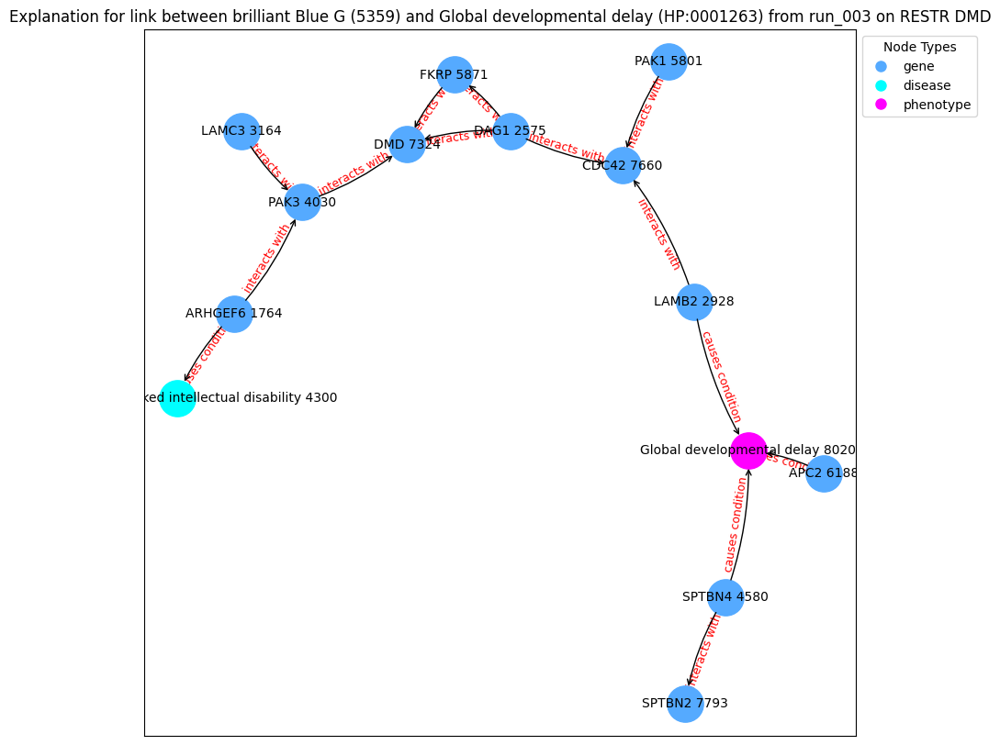

('ARHGEF6 1764', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('LAMC3 3164', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('SPTBN4 4580', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('APC2 6188', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('SPTBN2 7793', {'type': 'gene'})
('Global developmental delay 8020', {'type': 'phenotype'})
('ARHGEF6 1764', 'PAK3 4030', {'label': 'interacts with'})
('ARHGEF6 1764', 'non-syndromic X-linked intellectual disability 4300', {'label': 'causes condition'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'CDC42 7660', {'label': 'interacts with'})
('LAMB2 2928', 'CDC42 7660', {'label': 'interacts with'})
('LAMB2 2928', 'Global developmental delay 8020', {'label': 'causes condition'})
('

Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 375.85it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9949], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 449.73it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9003], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 431.65it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9892], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 469.91it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9981], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 487.21it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9988], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 458.03it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8295], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 472.06it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6275], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 459.56it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9902], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 437.42it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9684], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 7729: 100%|██████████| 700/700 [00:01<00:00, 457.11it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


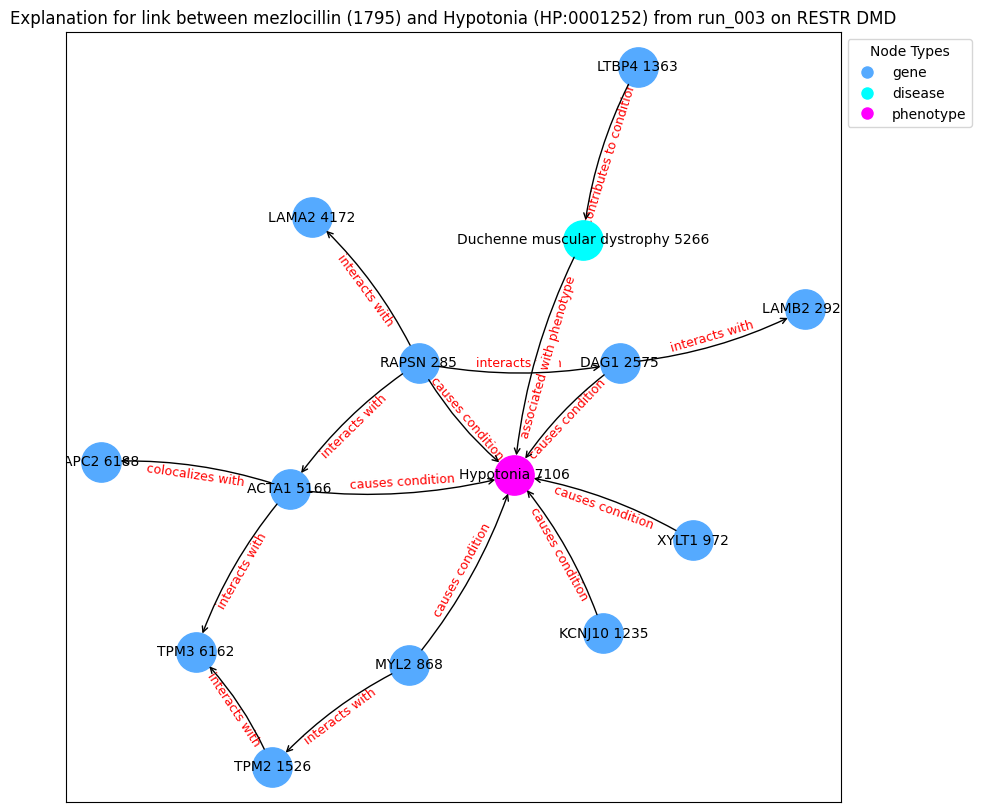

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('XYLT1 972', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('TPM3 6162', {'type': 'gene'})
('APC2 6188', {'type': 'gene'})
('Hypotonia 7106', {'type': 'phenotype'})
('RAPSN 285', 'ACTA1 5166', {'label': 'interacts with'})
('RAPSN 285', 'Hypotonia 7106', {'label': 'causes condition'})
('RAPSN 285', 'LAMA2 4172', {'label': 'interacts with'})
('RAPSN 285', 'DAG1 2575', {'label': 'interacts with'})
('MYL2 868', 'Hypotonia 7106', {'label': 'causes condition'})
('MYL2 868', 'TPM2 1526', {'label': 'interacts with'})
('XYLT1 972', 'Hypotonia 7106', {'label': 'causes condition'})
('KCNJ10 1235', 'Hypotonia 7106', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular

Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 462.52it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9015], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 450.76it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.8709], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 467.48it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9985], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 494.27it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9384], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 490.11it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9952], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 469.14it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9972], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 491.16it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9808], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 487.36it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9017], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 497.24it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9765], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 370: 100%|██████████| 700/700 [00:01<00:00, 433.97it/s]


Contribution threshold is tensor(0.0064)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


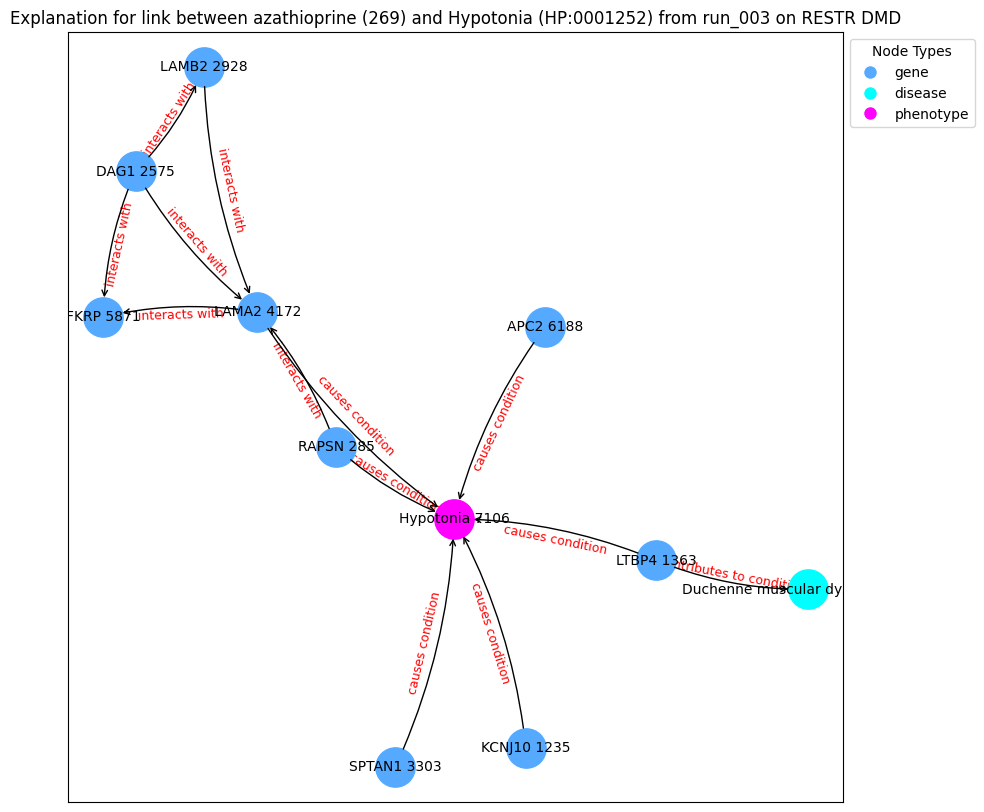

('RAPSN 285', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('SPTAN1 3303', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('APC2 6188', {'type': 'gene'})
('Hypotonia 7106', {'type': 'phenotype'})
('RAPSN 285', 'Hypotonia 7106', {'label': 'causes condition'})
('RAPSN 285', 'LAMA2 4172', {'label': 'interacts with'})
('KCNJ10 1235', 'Hypotonia 7106', {'label': 'causes condition'})
('LTBP4 1363', 'Hypotonia 7106', {'label': 'causes condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'LAMA2 4172', {'label': 'interacts with'})
('DAG1 2575', 'LAMB2 2928', {'label': 'interacts with'})
('LAMB2 2928', 'LAMA2 4172', {'label': 'interacts with'})
('SPTAN1 3303', 'Hypotonia 7106', {'la

Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 461.40it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.8306], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 459.65it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.6297], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 477.96it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9954], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 493.52it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9821], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 488.87it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9671], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 469.59it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9590], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 493.65it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.8012], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 487.66it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.8318], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 493.98it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9727], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7106 and 468: 100%|██████████| 700/700 [00:01<00:00, 492.02it/s]


Contribution threshold is tensor(0.9937)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


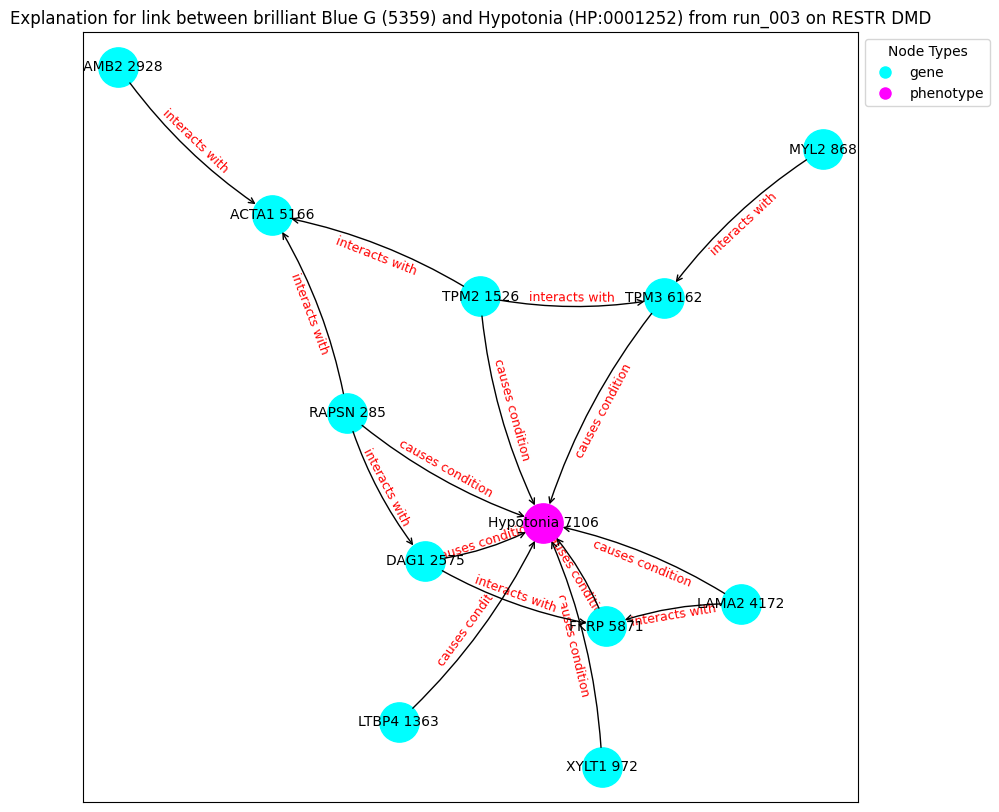

('RAPSN 285', {'type': 'gene'})
('MYL2 868', {'type': 'gene'})
('XYLT1 972', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('Hypotonia 7106', {'type': 'phenotype'})
('RAPSN 285', 'ACTA1 5166', {'label': 'interacts with'})
('RAPSN 285', 'Hypotonia 7106', {'label': 'causes condition'})
('RAPSN 285', 'DAG1 2575', {'label': 'interacts with'})
('MYL2 868', 'TPM3 6162', {'label': 'interacts with'})
('XYLT1 972', 'Hypotonia 7106', {'label': 'causes condition'})
('LTBP4 1363', 'Hypotonia 7106', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'Hypotonia 7106', {'label': 'causes condition'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575',

Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 473.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3704], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 551.67it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3497], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 528.61it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4308], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 529.83it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0202], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 531.52it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4273], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 538.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3415], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 544.90it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8562], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 528.07it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.1114], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 508.20it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2456], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 370: 100%|██████████| 700/700 [00:01<00:00, 539.14it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                         label  \
6618      6618  HP:0001328  phenotype  Specific learning disability   

      semantic_id  
6618            8  
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.4844], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 539.78it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0478], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 537.84it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9483], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 518.89it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7818], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 514.36it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8546], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 558.15it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6189], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 533.95it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3690], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 541.27it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9536], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 494.10it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4856], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 508.02it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9251], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 7729: 100%|██████████| 700/700 [00:01<00:00, 519.07it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                         label  \
6618      6618  HP:0001328  phenotype  Specific learning disability   

      semantic_id  
6618            8  
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.4410], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 528.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3583], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 566.58it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7995], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 528.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5809], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 515.29it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2690], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 541.99it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3850], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 519.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6624], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 549.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 513.20it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5782], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 502.42it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3173], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 6618 and 468: 100%|██████████| 700/700 [00:01<00:00, 510.58it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                  label  semantic_id
9599      9599  HP:0001290  phenotype  Generalized hypotonia            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9767], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 406.71it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8020], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 412.78it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9788], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 398.94it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9786], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 423.62it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9397], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 400.79it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8680], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 408.99it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7768], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 389.35it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9935], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 389.33it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9984], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 395.43it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9951], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 7729: 100%|██████████| 700/700 [00:01<00:00, 410.81it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


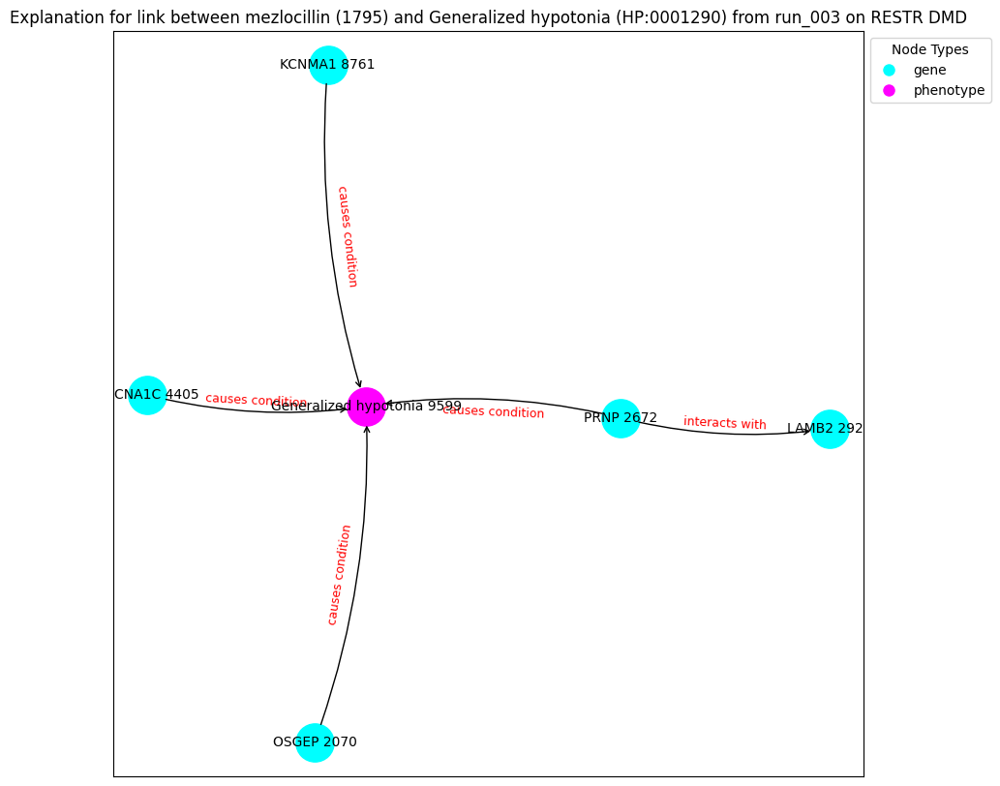

('OSGEP 2070', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('CACNA1C 4405', {'type': 'gene'})
('KCNMA1 8761', {'type': 'gene'})
('Generalized hypotonia 9599', {'type': 'phenotype'})
('OSGEP 2070', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('PRNP 2672', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('PRNP 2672', 'LAMB2 2928', {'label': 'interacts with'})
('CACNA1C 4405', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('KCNMA1 8761', 'Generalized hypotonia 9599', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_7_run_003_graph.gpickle
Explanation pair ids and names saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_7_run_003_pair.pkl
node1:
      index_id          id   semantic                  label  semantic_id
9599      9599  HP:0001290 

Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 373.07it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9577], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 393.54it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9867], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 405.61it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9692], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 396.55it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8509], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 364.83it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9894], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 399.85it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9509], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 388.08it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9914], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 416.12it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7531], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 399.27it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9911], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 468: 100%|██████████| 700/700 [00:01<00:00, 417.30it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


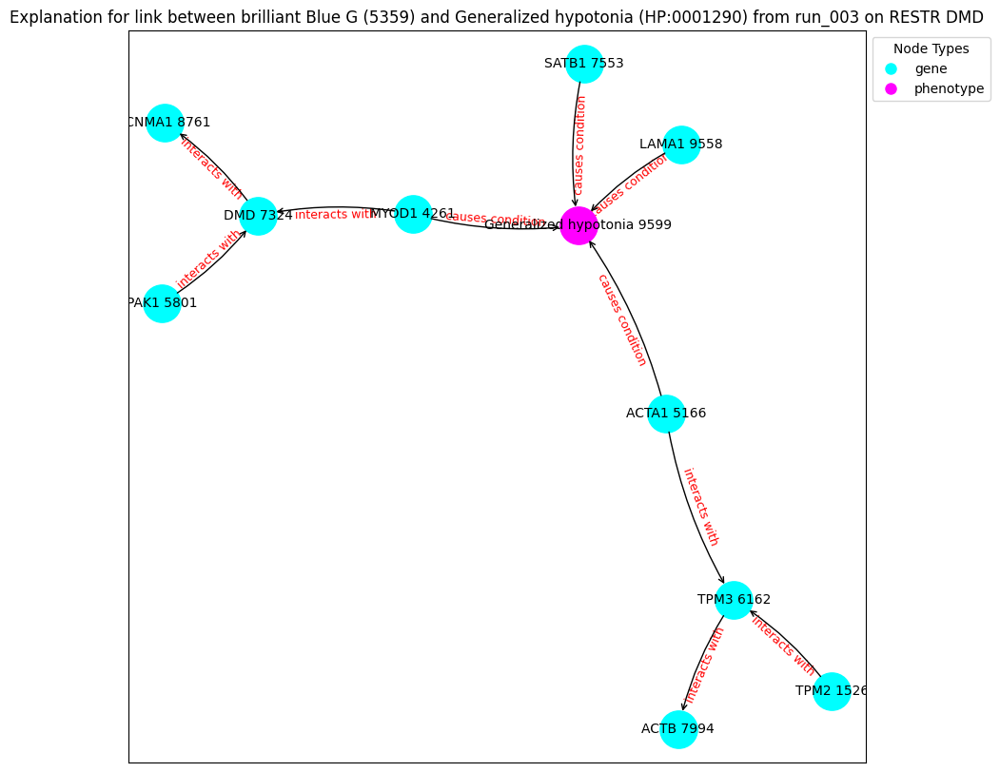

('TPM2 1526', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SATB1 7553', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('KCNMA1 8761', {'type': 'gene'})
('LAMA1 9558', {'type': 'gene'})
('Generalized hypotonia 9599', {'type': 'phenotype'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('MYOD1 4261', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('MYOD1 4261', 'DMD 7324', {'label': 'interacts with'})
('ACTA1 5166', 'TPM3 6162', {'label': 'interacts with'})
('ACTA1 5166', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('PAK1 5801', 'DMD 7324', {'label': 'interacts with'})
('TPM3 6162', 'ACTB 7994', {'label': 'interacts with'})
('DMD 7324', 'KCNMA1 8761', {'label': 'interacts with'})
('SATB1 7553', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('LAMA1 9558', 'Generalized hypotonia 9599', {'label': '

Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 371.64it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9586], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 400.33it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8438], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 396.16it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9925], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 401.96it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9944], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 415.99it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9976], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 360.42it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9806], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 390.88it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9145], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 398.48it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9172], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 366.23it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9996], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9599 and 370: 100%|██████████| 700/700 [00:01<00:00, 382.03it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


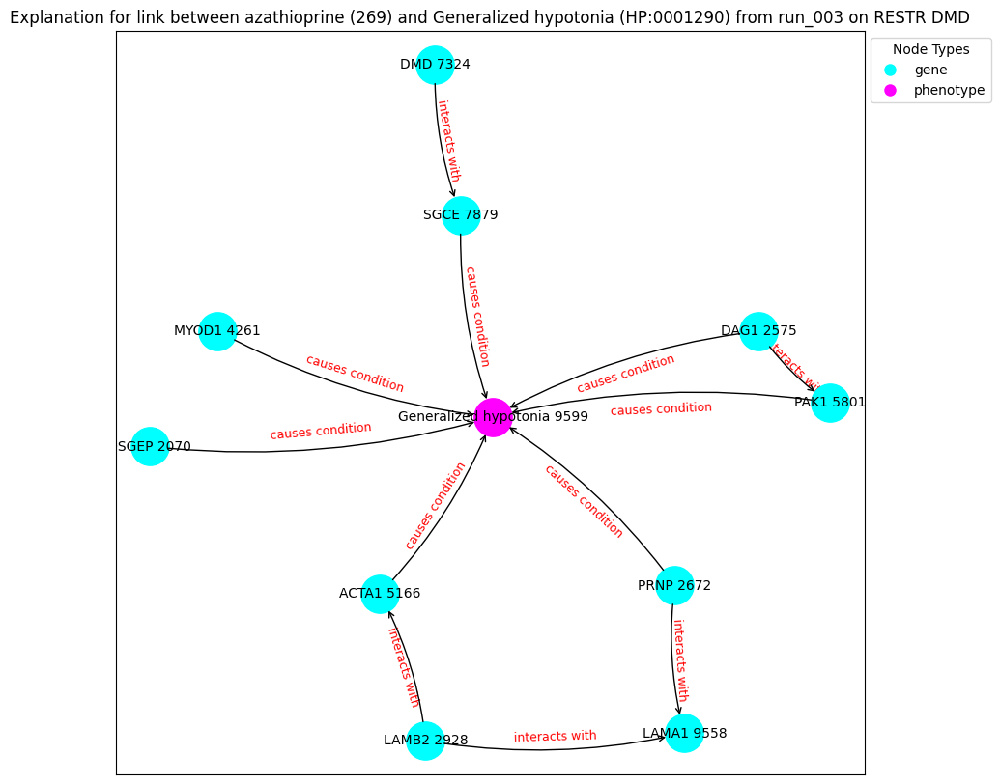

('OSGEP 2070', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('PAK1 5801', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('SGCE 7879', {'type': 'gene'})
('LAMA1 9558', {'type': 'gene'})
('Generalized hypotonia 9599', {'type': 'phenotype'})
('OSGEP 2070', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('DAG1 2575', 'PAK1 5801', {'label': 'interacts with'})
('DAG1 2575', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('PRNP 2672', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('PRNP 2672', 'LAMA1 9558', {'label': 'interacts with'})
('LAMB2 2928', 'LAMA1 9558', {'label': 'interacts with'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('MYOD1 4261', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('ACTA1 5166', 'Generalized hypotonia 9599', {'label': 'causes condition'})
('PAK1 5801', '

Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 373.23it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9953], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 418.48it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9845], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 368.33it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 394.34it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9964], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 409.01it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8070], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 394.65it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([1.0000], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 391.68it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9183], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 428.51it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9772], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 426.02it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.7845], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8695 and 4932: 100%|██████████| 700/700 [00:01<00:00, 431.21it/s]


Contribution threshold is tensor(0.9938)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


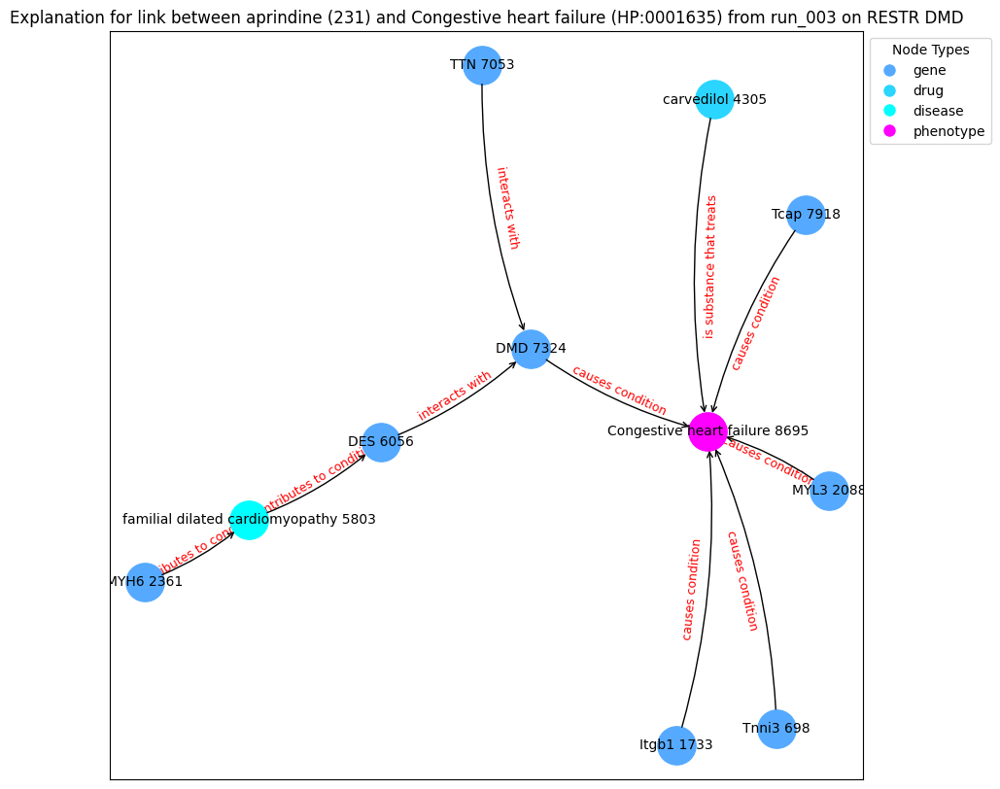

('Tnni3 698', {'type': 'gene'})
('Itgb1 1733', {'type': 'gene'})
('MYL3 2088', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('carvedilol 4305', {'type': 'drug'})
('familial dilated cardiomyopathy 5803', {'type': 'disease'})
('DES 6056', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Tcap 7918', {'type': 'gene'})
('Congestive heart failure 8695', {'type': 'phenotype'})
('Tnni3 698', 'Congestive heart failure 8695', {'label': 'causes condition'})
('Itgb1 1733', 'Congestive heart failure 8695', {'label': 'causes condition'})
('MYL3 2088', 'Congestive heart failure 8695', {'label': 'causes condition'})
('MYH6 2361', 'familial dilated cardiomyopathy 5803', {'label': 'contributes to condition'})
('carvedilol 4305', 'Congestive heart failure 8695', {'label': 'is substance that treats'})
('familial dilated cardiomyopathy 5803', 'DES 6056', {'label': 'contributes to condition'})
('DES 6056', 'DMD 7324', {'label': 'interacts with'})
('TTN 7053', 'DMD 7324'

Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 404.96it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9949], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 413.17it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9166], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 461.52it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9933], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 478.03it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7859], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 486.14it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9560], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 455.17it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9979], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 484.38it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9812], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 460.34it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9986], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 463.20it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9973], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8392 and 108: 100%|██████████| 700/700 [00:01<00:00, 488.12it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


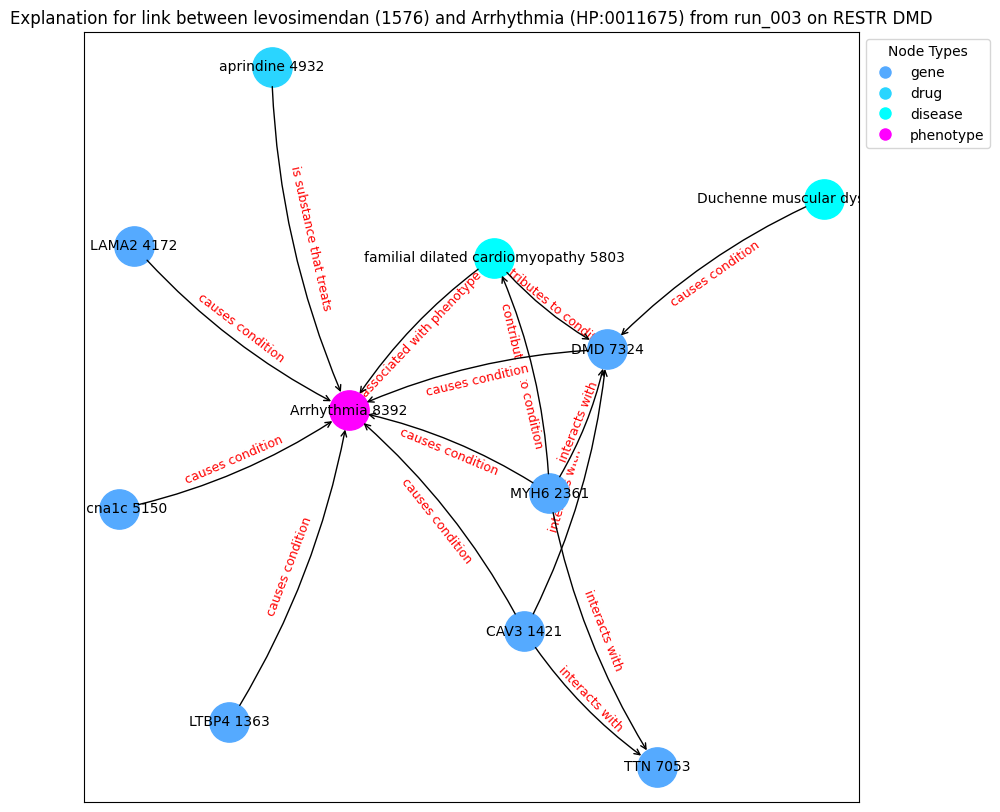

('LTBP4 1363', {'type': 'gene'})
('CAV3 1421', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('aprindine 4932', {'type': 'drug'})
('cacna1c 5150', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('familial dilated cardiomyopathy 5803', {'type': 'disease'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Arrhythmia 8392', {'type': 'phenotype'})
('LTBP4 1363', 'Arrhythmia 8392', {'label': 'causes condition'})
('CAV3 1421', 'Arrhythmia 8392', {'label': 'causes condition'})
('CAV3 1421', 'TTN 7053', {'label': 'interacts with'})
('CAV3 1421', 'DMD 7324', {'label': 'interacts with'})
('MYH6 2361', 'Arrhythmia 8392', {'label': 'causes condition'})
('MYH6 2361', 'TTN 7053', {'label': 'interacts with'})
('MYH6 2361', 'familial dilated cardiomyopathy 5803', {'label': 'contributes to condition'})
('MYH6 2361', 'DMD 7324', {'label': 'interacts with'})
('LAMA2 4172', 'Arrhythmia 8392', {'label': 'causes condition'})
('

Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 486.53it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9436], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 576.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8800], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 523.04it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0953], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 575.10it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3261], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 543.69it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9781], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 568.35it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9988], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 565.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8057], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 476.59it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9595], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 576.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9564], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3220 and 370: 100%|██████████| 700/700 [00:01<00:00, 557.74it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
5066      5066  HP:0003115  phenotype  Abnormal EKG            8
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9527], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 561.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9942], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 496.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9847], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 529.43it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 554.38it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9530], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 570.67it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9970], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 556.09it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9866], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 505.25it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9776], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 552.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9649], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 554.32it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9324], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 4932: 100%|██████████| 700/700 [00:01<00:00, 582.54it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
5066      5066  HP:0003115  phenotype  Abnormal EKG            8
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.9086], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 558.62it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9753], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 532.35it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9932], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 566.75it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9934], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 541.45it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9937], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 573.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9844], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 566.13it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9513], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 580.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8932], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 554.12it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9505], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 469.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9327], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5066 and 108: 100%|██████████| 700/700 [00:01<00:00, 540.16it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                label  semantic_id
3548      3548  HP:0001371  phenotype  Flexion contracture            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9900], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 532.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6122], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 545.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4919], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 533.69it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9548], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 482.95it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9953], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 534.61it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9214], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 492.05it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4014], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 502.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8799], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 491.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9624], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 550.34it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6851], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 7729: 100%|██████████| 700/700 [00:01<00:00, 546.94it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                label  semantic_id
3548      3548  HP:0001371  phenotype  Flexion contracture            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.9564], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 544.10it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9109], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 521.27it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9517], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 505.21it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7974], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 555.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5061], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 554.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0285], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 529.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9801], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 530.01it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9492], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 470.89it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2061], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 459.65it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9814], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 370: 100%|██████████| 700/700 [00:01<00:00, 477.83it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                label  semantic_id
3548      3548  HP:0001371  phenotype  Flexion contracture            8
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.6032], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 489.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8556], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 540.63it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9592], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 479.73it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9769], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 510.01it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9618], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 560.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9487], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 555.60it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8593], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 502.18it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7862], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 531.00it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8971], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 533.11it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9006], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 3548 and 468: 100%|██████████| 700/700 [00:01<00:00, 562.89it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
       index_id          id   semantic  \
10260     10260  HP:0003236  phenotype   

                                                   label  semantic_id  
10260  Elevated circulating creatine kinase concentra...            8  
node2:
     index_id    id semantic         label  semantic_id
108       108  1576     drug  levosimendan            3
Prediction from trained model: tensor([0.9965], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 372.53it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9087], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 340.88it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8810], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 359.72it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9671], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 356.97it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9973], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 353.02it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8613], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 363.22it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9787], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 320.45it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9748], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:02<00:00, 345.02it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9917], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 356.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9786], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 108: 100%|██████████| 700/700 [00:01<00:00, 351.27it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


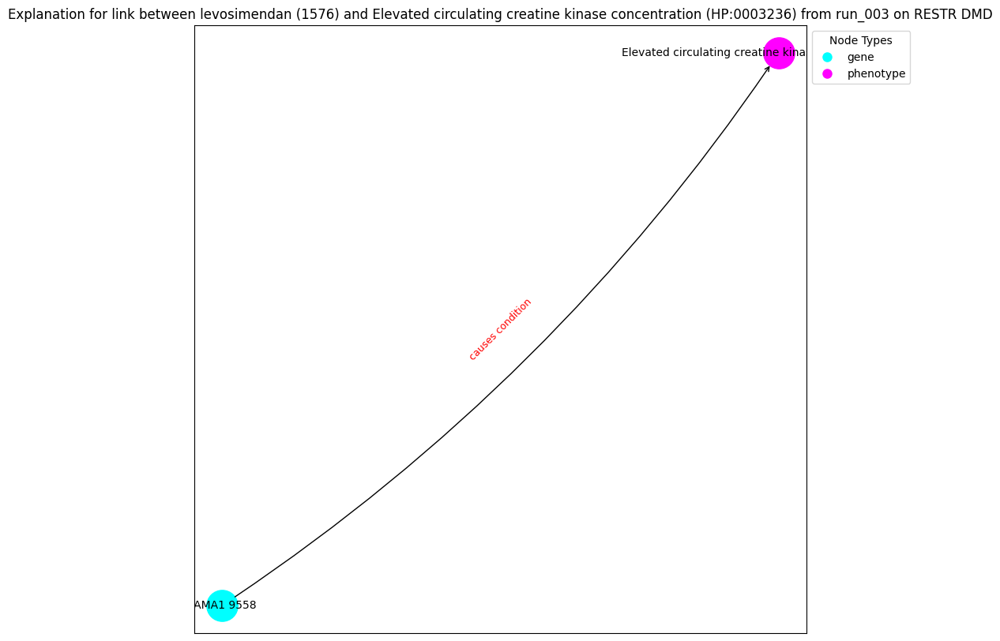

('LAMA1 9558', {'type': 'gene'})
('Elevated circulating creatine kinase concentration 10260', {'type': 'phenotype'})
('LAMA1 9558', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_12_run_003_graph.gpickle
Explanation pair ids and names saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_12_run_003_pair.pkl
node1:
       index_id          id   semantic  \
10260     10260  HP:0003236  phenotype   

                                                   label  semantic_id  
10260  Elevated circulating creatine kinase concentra...            8  
node2:
      index_id   id semantic      label  semantic_id
4932      4932  231     drug  aprindine            3
Prediction from trained model: tensor([0.9996], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 325.72it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9888], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 363.73it/s]


Contribution threshold is tensor(0.9940)
Prediction from trained model: tensor([0.9851], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 362.29it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9941], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:02<00:00, 349.65it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9720], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 359.90it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9532], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 363.77it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9860], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 357.95it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9993], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 367.25it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9924], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 350.43it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9859], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 10260 and 4932: 100%|██████████| 700/700 [00:01<00:00, 354.72it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


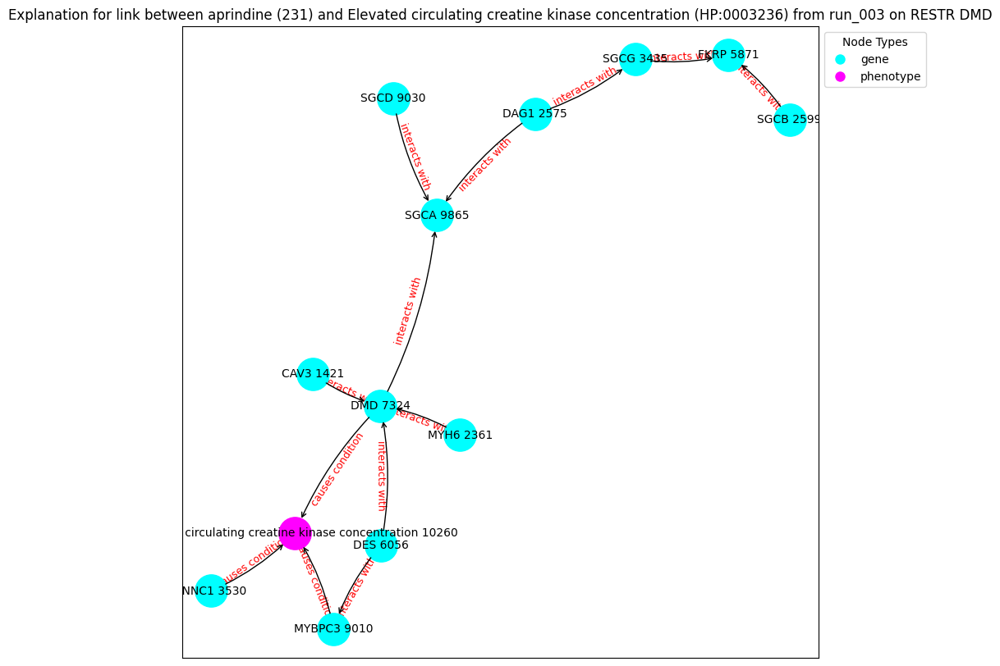

('CAV3 1421', {'type': 'gene'})
('MYH6 2361', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('TNNC1 3530', {'type': 'gene'})
('FKRP 5871', {'type': 'gene'})
('DES 6056', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('MYBPC3 9010', {'type': 'gene'})
('SGCD 9030', {'type': 'gene'})
('SGCA 9865', {'type': 'gene'})
('Elevated circulating creatine kinase concentration 10260', {'type': 'phenotype'})
('CAV3 1421', 'DMD 7324', {'label': 'interacts with'})
('MYH6 2361', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'SGCG 3435', {'label': 'interacts with'})
('DAG1 2575', 'SGCA 9865', {'label': 'interacts with'})
('SGCB 2599', 'FKRP 5871', {'label': 'interacts with'})
('SGCG 3435', 'FKRP 5871', {'label': 'interacts with'})
('TNNC1 3530', 'Elevated circulating creatine kinase concentration 10260', {'label': 'causes condition'})
('DES 6056', 'MYBPC3 9010', {'label': 'interacts with'})
('DES 6056', 'DMD 7324', {'label':

Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 493.00it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9862], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 518.38it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9924], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 465.30it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9969], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 491.45it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9885], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 512.70it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9927], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 494.69it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9937], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 489.18it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9570], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 495.12it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9926], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 481.47it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8151], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 370: 100%|██████████| 700/700 [00:01<00:00, 482.21it/s]


Contribution threshold is tensor(0.0063)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


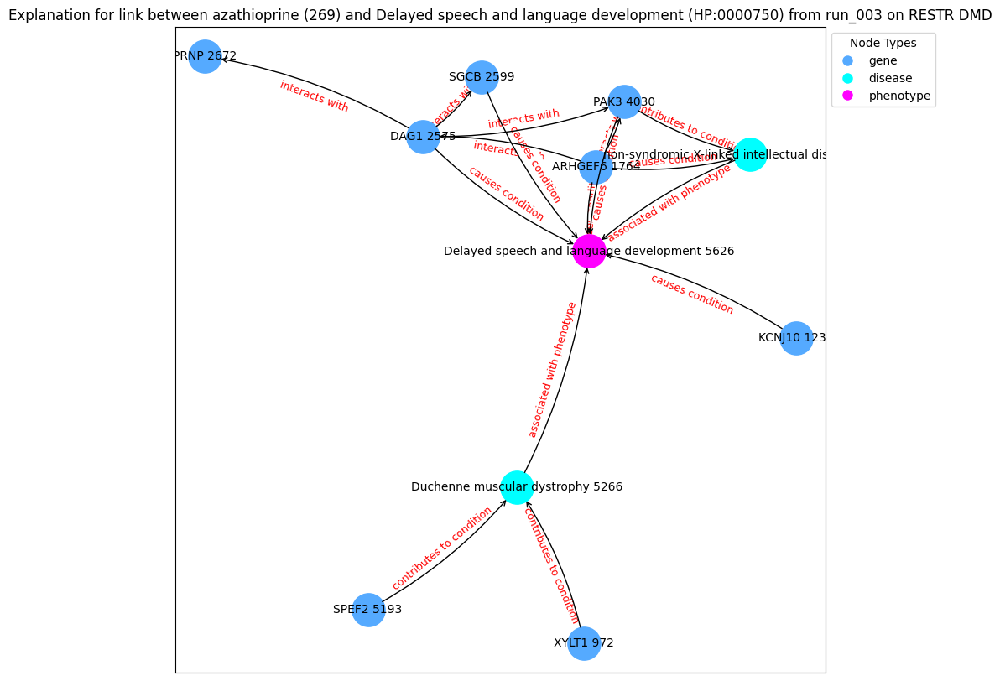

('XYLT1 972', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('ARHGEF6 1764', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('SPEF2 5193', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Delayed speech and language development 5626', {'type': 'phenotype'})
('XYLT1 972', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('KCNJ10 1235', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('ARHGEF6 1764', 'DAG1 2575', {'label': 'interacts with'})
('ARHGEF6 1764', 'PAK3 4030', {'label': 'interacts with'})
('ARHGEF6 1764', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('ARHGEF6 1764', 'non-syndromic X-linked intellectual disability 4300', {'label': 'causes condition'})
('DAG1 2575', 'PAK3 4030', {'l

Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 467.68it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8474], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 483.86it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9959], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 462.18it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9797], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 512.46it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9737], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 475.30it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.8307], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 492.18it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.8360], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 522.73it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9650], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 509.89it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9971], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 491.09it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.5955], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 7729: 100%|██████████| 700/700 [00:01<00:00, 436.45it/s]


Contribution threshold is tensor(0.0063)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


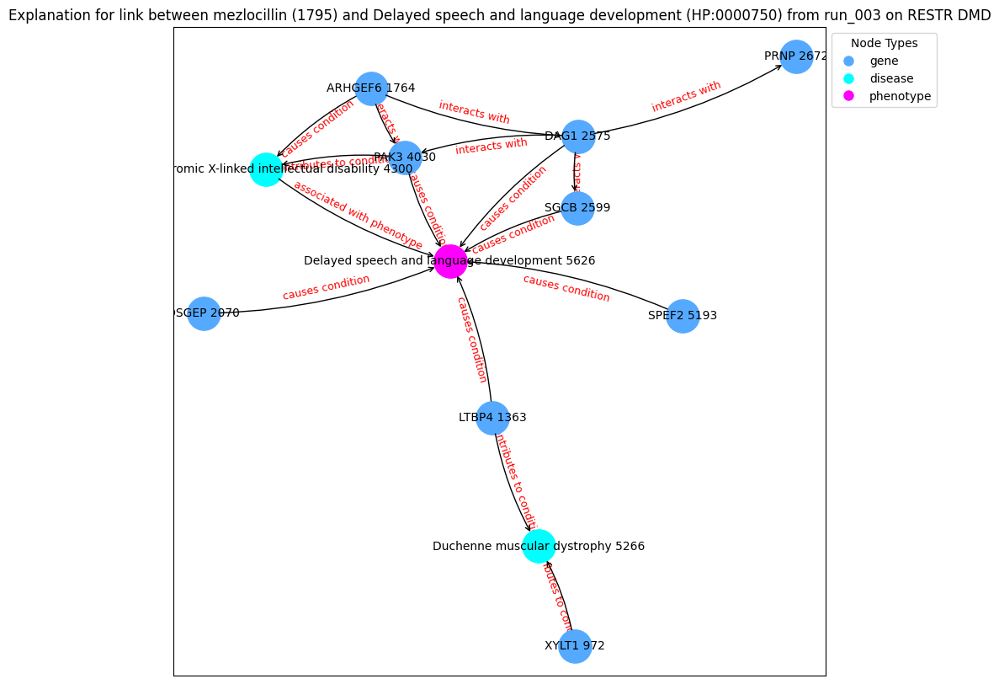

('XYLT1 972', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('ARHGEF6 1764', {'type': 'gene'})
('OSGEP 2070', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('SPEF2 5193', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Delayed speech and language development 5626', {'type': 'phenotype'})
('XYLT1 972', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('ARHGEF6 1764', 'DAG1 2575', {'label': 'interacts with'})
('ARHGEF6 1764', 'PAK3 4030', {'label': 'interacts with'})
('ARHGEF6 1764', 'non-syndromic X-linked intellectual disability 4300', {'label': 'causes condition'})
('OSG

Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 505.05it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9510], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 508.80it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.7818], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 451.90it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9885], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 499.39it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9985], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 517.15it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8025], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 505.72it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8949], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 511.14it/s]


Contribution threshold is tensor(0.0062)
Prediction from trained model: tensor([0.9370], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 514.05it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8078], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 506.41it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9300], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 5626 and 468: 100%|██████████| 700/700 [00:01<00:00, 515.29it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


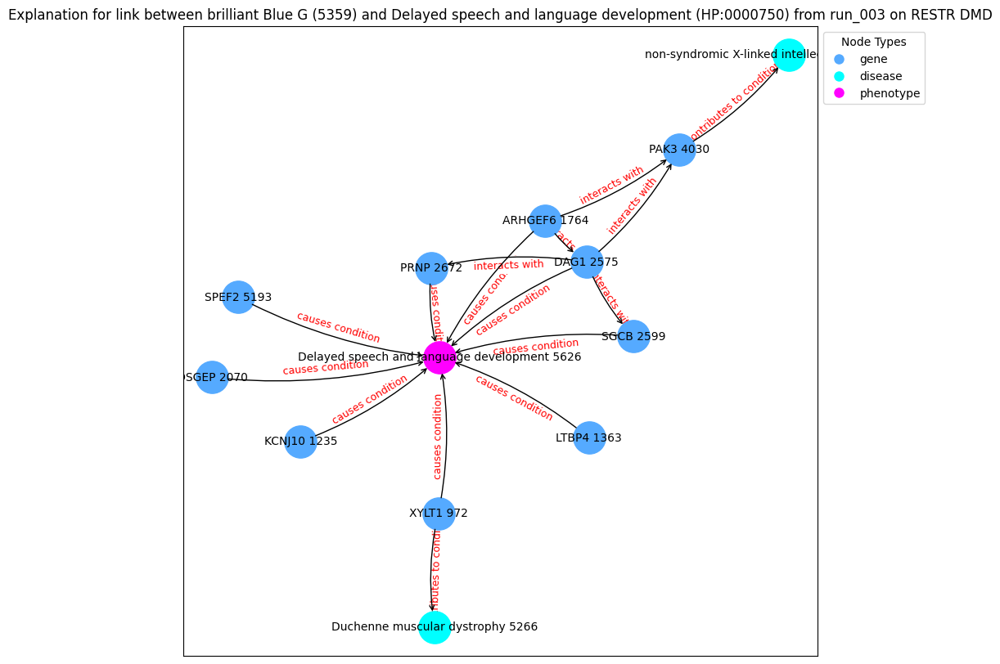

('XYLT1 972', {'type': 'gene'})
('KCNJ10 1235', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('ARHGEF6 1764', {'type': 'gene'})
('OSGEP 2070', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('PRNP 2672', {'type': 'gene'})
('PAK3 4030', {'type': 'gene'})
('non-syndromic X-linked intellectual disability 4300', {'type': 'disease'})
('SPEF2 5193', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Delayed speech and language development 5626', {'type': 'phenotype'})
('XYLT1 972', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('XYLT1 972', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('KCNJ10 1235', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('LTBP4 1363', 'Delayed speech and language development 5626', {'label': 'causes condition'})
('ARHGEF6 1764', 'DAG1 2575', {'label': 'interacts with'})
('ARHGEF6 1764', 'PAK3 4030', {'lab

Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 357.39it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8715], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 367.94it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5265], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 367.58it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9508], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 350.12it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9776], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 351.62it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9996], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 372.78it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9930], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 375.57it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9429], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 382.65it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0354], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:02<00:00, 347.20it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9981], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 4932: 100%|██████████| 700/700 [00:01<00:00, 376.81it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


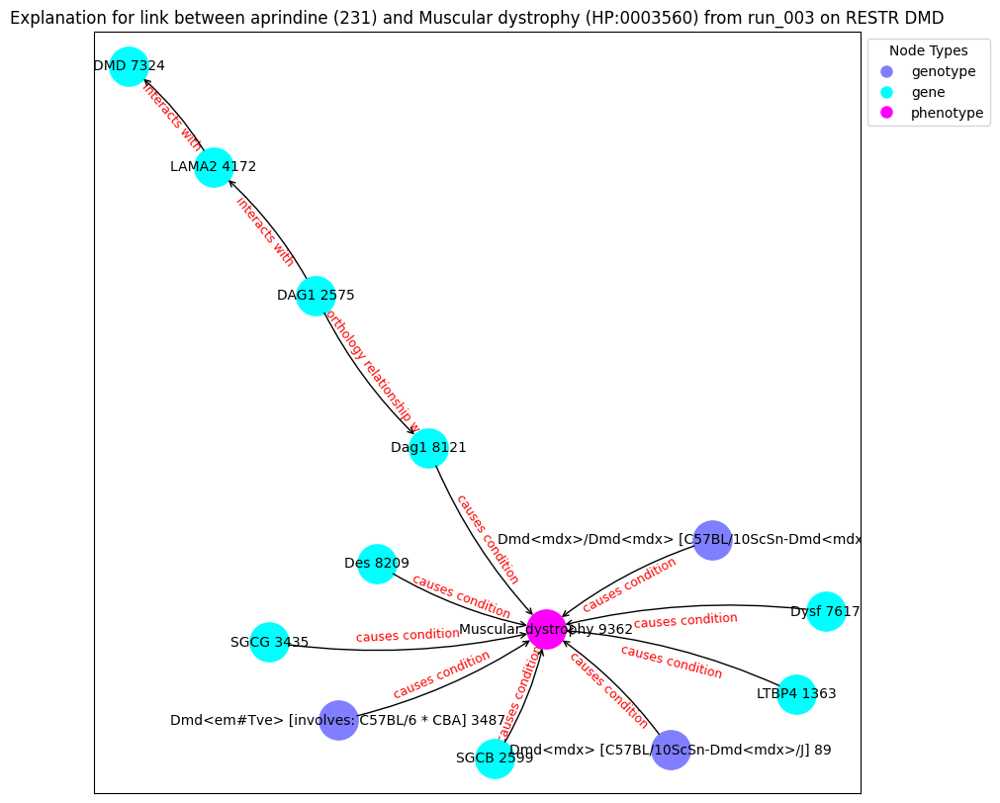

('Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 89', {'type': 'genotype'})
('LTBP4 1363', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('SGCB 2599', {'type': 'gene'})
('SGCG 3435', {'type': 'gene'})
('Dmd<em#Tve> [involves: C57BL/6 * CBA] 3487', {'type': 'genotype'})
('LAMA2 4172', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 6302', {'type': 'genotype'})
('DMD 7324', {'type': 'gene'})
('Dysf 7617', {'type': 'gene'})
('Dag1 8121', {'type': 'gene'})
('Des 8209', {'type': 'gene'})
('Muscular dystrophy 9362', {'type': 'phenotype'})
('Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 89', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('LTBP4 1363', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('DAG1 2575', 'Dag1 8121', {'label': 'in orthology relationship with'})
('DAG1 2575', 'LAMA2 4172', {'label': 'interacts with'})
('SGCB 2599', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('SGCG 3435', 'Muscular dystrophy 9362', {'label': 'causes condition'})
('Dmd<e

Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:02<00:00, 328.40it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9913], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 360.49it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8580], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 370.60it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.3877], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 371.03it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8380], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 365.38it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9841], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 379.33it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9788], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 378.36it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.0404], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 375.41it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.8958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 372.23it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9832], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 9362 and 108: 100%|██████████| 700/700 [00:01<00:00, 368.84it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


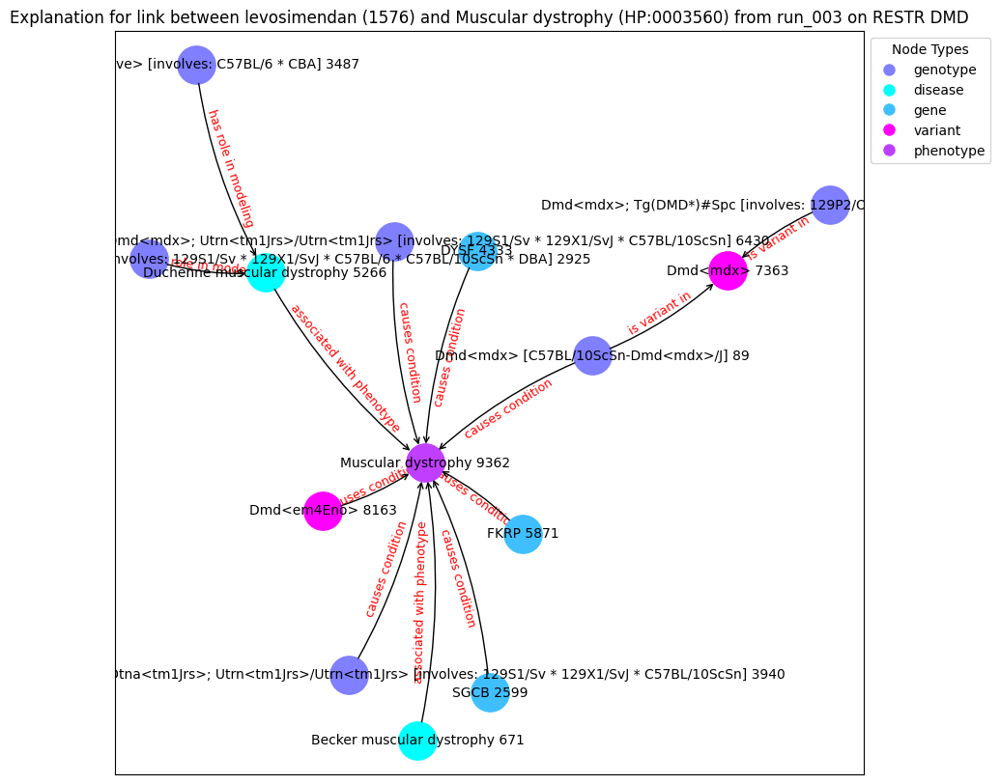

('Dmd<mdx> [C57BL/10ScSn-Dmd<mdx>/J] 89', {'type': 'genotype'})
('Becker muscular dystrophy 671', {'type': 'disease'})
('SGCB 2599', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx>; Utrn<tm1Ked>/Utrn<tm1Ked> [involves: 129S1/Sv * 129X1/SvJ * C57BL/6 * C57BL/10ScSn * DBA] 2925', {'type': 'genotype'})
('Dmd<em#Tve> [involves: C57BL/6 * CBA] 3487', {'type': 'genotype'})
('Dmd<mdx>; Dtna<tm1Jrs>/Dtna<tm1Jrs>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 3940', {'type': 'genotype'})
('DYSF 4333', {'type': 'gene'})
('Dmd<mdx>; Tg(DMD*)#Spc [involves: 129P2/OlaHsd * C57BL/10ScSn * DBA/2] 5186', {'type': 'genotype'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('Dmd<mdx>/Dmd<mdx>; Utrn<tm1Jrs>/Utrn<tm1Jrs> [involves: 129S1/Sv * 129X1/SvJ * C57BL/10ScSn] 6430', {'type': 'genotype'})
('Dmd<mdx> 7363', {'type': 'variant'})
('Dmd<em4Eno> 8163', {'type': 'variant'})
('Muscular dystrophy 9362', {'type': 'phenotype'})
('Dmd<mdx> [C57BL/

Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 554.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9931], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 592.14it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9994], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 571.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9800], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 571.43it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6329], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 522.82it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9852], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 539.78it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.6153], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 572.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9910], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 552.33it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9942], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 554.28it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8253], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 7729: 100%|██████████| 700/700 [00:01<00:00, 553.89it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic          label  semantic_id
1286      1286  HP:0003307  phenotype  Hyperlordosis            8
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.0007], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 575.01it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9982], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 595.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9499], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 585.89it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9886], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 573.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5637], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 578.31it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3352], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 589.55it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9258], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 600.33it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9446], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 507.11it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9387], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 539.07it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8627], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1286 and 468: 100%|██████████| 700/700 [00:01<00:00, 525.39it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                      label  semantic_id
2062      2062  HP:0002093  phenotype  Respiratory insufficiency            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.9385], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 485.88it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.2546], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 519.40it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.0317], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 509.20it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.3110], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 456.21it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9676], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 516.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4563], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 531.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8679], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 512.85it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7522], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 504.24it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5940], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 498.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9293], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 7729: 100%|██████████| 700/700 [00:01<00:00, 550.33it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                      label  semantic_id
2062      2062  HP:0002093  phenotype  Respiratory insufficiency            8
node2:
     index_id   id semantic         label  semantic_id
370       370  269     drug  azathioprine            3
Prediction from trained model: tensor([0.9708], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 502.47it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9976], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 538.56it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9889], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 471.48it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9968], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 523.92it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9976], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 471.22it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9508], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 541.84it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8986], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 501.81it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7080], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 455.27it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9190], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 464.57it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9534], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 370: 100%|██████████| 700/700 [00:01<00:00, 512.87it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                      label  semantic_id
2062      2062  HP:0002093  phenotype  Respiratory insufficiency            8
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.8525], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 481.96it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8493], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 554.06it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7579], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 511.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5227], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 532.74it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9505], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 466.38it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5049], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 522.75it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9736], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 469.99it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5991], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 498.68it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.7093], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 519.40it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9068], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 2062 and 468: 100%|██████████| 700/700 [00:01<00:00, 526.57it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic                    label  semantic_id
1436      1436  HP:0003202  phenotype  Skeletal muscle atrophy            8
node2:
     index_id    id semantic             label  semantic_id
468       468  5359     drug  brilliant Blue G            3
Prediction from trained model: tensor([0.9490], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 529.19it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9534], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 519.17it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9285], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 488.09it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5880], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 554.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.5931], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 511.37it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9117], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 565.20it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8154], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 496.54it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.8943], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 527.86it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.4737], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 499.84it/s]


Contribution threshold is tensor(0.)
Prediction from trained model: tensor([0.9860], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 1436 and 468: 100%|██████████| 700/700 [00:01<00:00, 554.40it/s]


Contribution threshold is tensor(0.)
No good explanation found after 10 iterations
node1:
      index_id          id   semantic         label  semantic_id
7346      7346  HP:0001265  phenotype  Hyporeflexia            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained model: tensor([0.7112], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 449.41it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5973], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 488.46it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.4871], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 444.82it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9724], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 478.01it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2425], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 466.66it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8987], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 498.22it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8967], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 501.11it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.4318], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 515.79it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7855], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 441.99it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.9125], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 7729: 100%|██████████| 700/700 [00:01<00:00, 486.86it/s]


Contribution threshold is tensor(0.9936)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


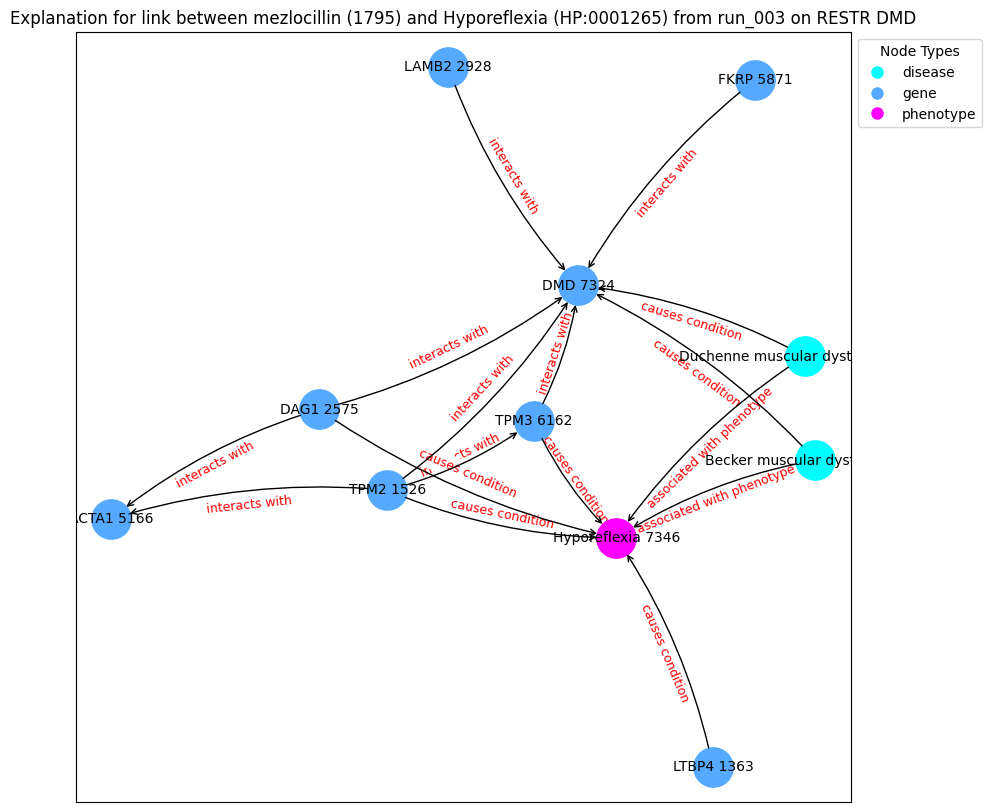

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Hyporeflexia 7346', {'label': 'associated with phenotype'})
('Becker muscular dystrophy 671', 'DMD 7324', {'label': 'causes condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'DMD 7324', {'label': 'interacts with'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('TPM2 1526', 'Hyporeflexia 7346', {'label': 'causes condition'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})

Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 506.44it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8647], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 456.17it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9106], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 515.89it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.9079], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 505.74it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8189], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 450.11it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.4905], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 497.82it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8526], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 520.43it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.5013], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 530.71it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.8210], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 502.08it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.4025], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 370: 100%|██████████| 700/700 [00:01<00:00, 514.13it/s]


Contribution threshold is tensor(0.0063)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


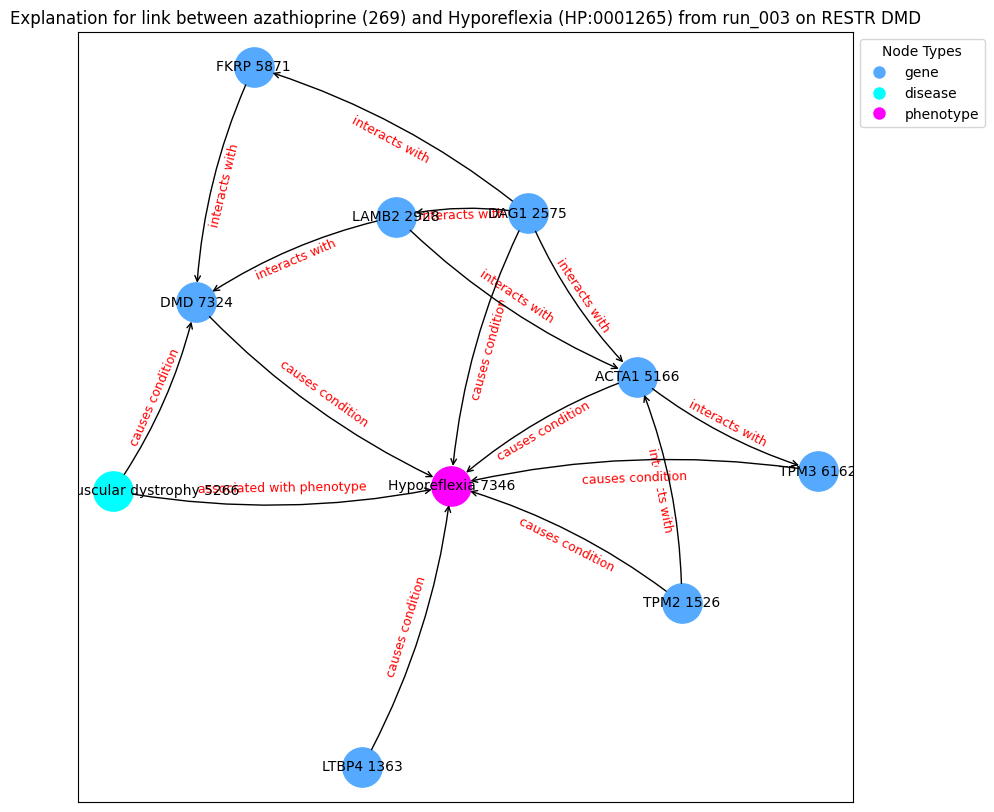

('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'ACTA1 5166', {'label': 'interacts with'})
('TPM2 1526', 'Hyporeflexia 7346', {'label': 'causes condition'})
('DAG1 2575', 'FKRP 5871', {'label': 'interacts with'})
('DAG1 2575', 'ACTA1 5166', {'label': 'interacts with'})
('DAG1 2575', 'Hyporeflexia 7346', {'label': 'causes condition'})
('DAG1 2575', 'LAMB2 2928', {'label': 'interacts with'})
('LAMB2 2928', 'DMD 7324', {'label': 'interacts with'})
('LAMB2 2928', 'ACTA1 5166', {'label': 'interacts with'})
('ACTA1 5166', 'TPM3 6162', {'label': 'interacts with'})
('ACTA1 5166', 'Hyporeflexia 7346', {'labe

Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 406.19it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.8340], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 483.59it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.9421], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 528.92it/s]


Contribution threshold is tensor(0.9936)
Prediction from trained model: tensor([0.4788], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 472.27it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.5223], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 466.18it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.7697], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 473.14it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2980], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 481.74it/s]


Contribution threshold is tensor(0.0064)
Prediction from trained model: tensor([0.2450], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 487.09it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.4042], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 503.46it/s]


Contribution threshold is tensor(0.0063)
Prediction from trained model: tensor([0.1427], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 7346 and 468: 100%|██████████| 700/700 [00:01<00:00, 527.66it/s]


Contribution threshold is tensor(0.0063)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


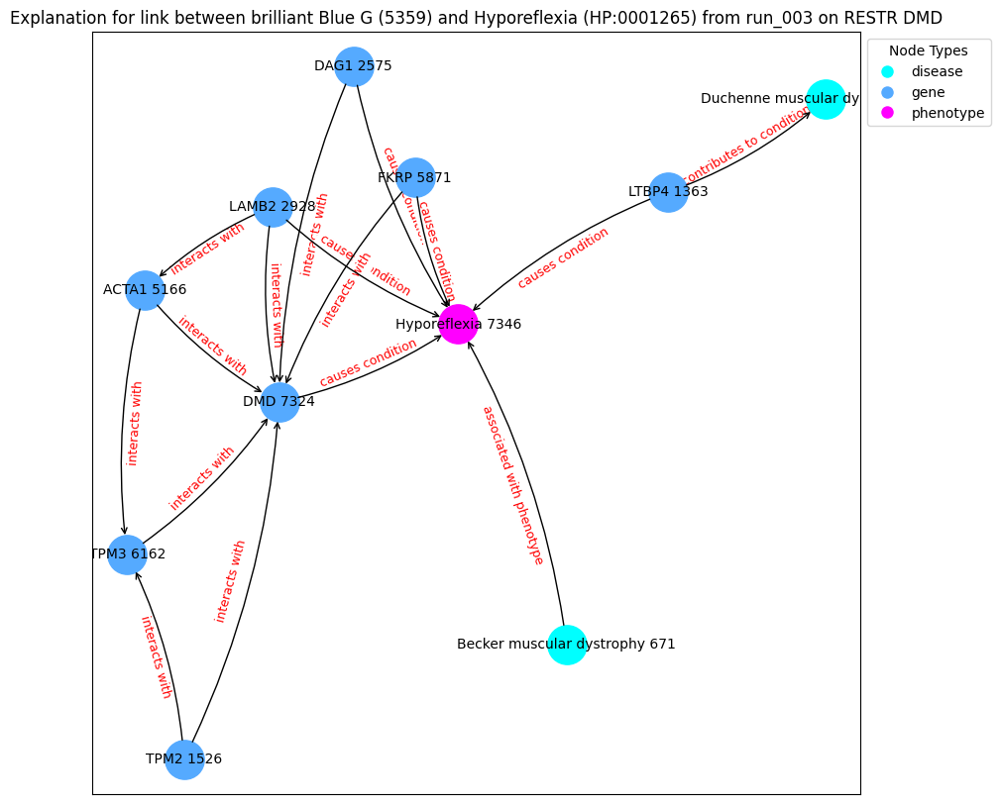

('Becker muscular dystrophy 671', {'type': 'disease'})
('LTBP4 1363', {'type': 'gene'})
('TPM2 1526', {'type': 'gene'})
('DAG1 2575', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('FKRP 5871', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('Hyporeflexia 7346', {'type': 'phenotype'})
('Becker muscular dystrophy 671', 'Hyporeflexia 7346', {'label': 'associated with phenotype'})
('LTBP4 1363', 'Duchenne muscular dystrophy 5266', {'label': 'contributes to condition'})
('LTBP4 1363', 'Hyporeflexia 7346', {'label': 'causes condition'})
('TPM2 1526', 'DMD 7324', {'label': 'interacts with'})
('TPM2 1526', 'TPM3 6162', {'label': 'interacts with'})
('DAG1 2575', 'DMD 7324', {'label': 'interacts with'})
('DAG1 2575', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'Hyporeflexia 7346', {'label': 'causes condition'})
('LAMB2 2928', 'DMD 7324', {'labe

Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 370.80it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9441], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 407.91it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9700], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 406.29it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9976], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 414.91it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9860], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 406.68it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9956], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 386.91it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9783], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 393.95it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5653], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 410.85it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9966], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 384.61it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9900], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 7729: 100%|██████████| 700/700 [00:01<00:00, 408.44it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


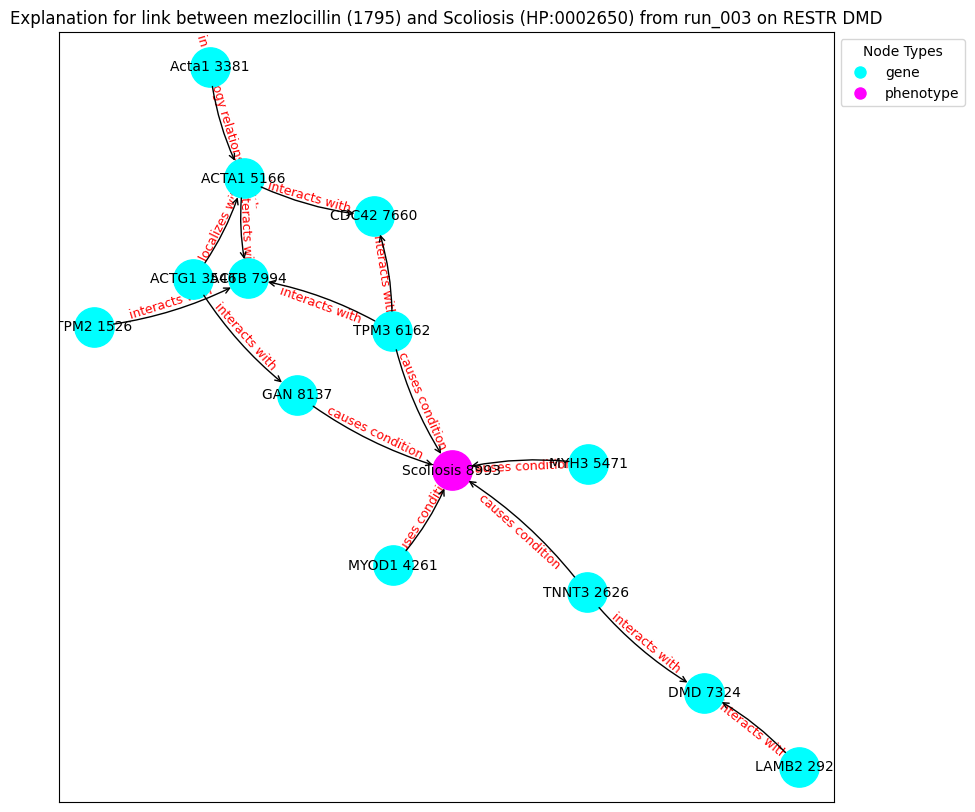

('TPM2 1526', {'type': 'gene'})
('TNNT3 2626', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('Acta1 3381', {'type': 'gene'})
('ACTG1 3546', {'type': 'gene'})
('MYOD1 4261', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('MYH3 5471', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('GAN 8137', {'type': 'gene'})
('Scoliosis 8993', {'type': 'phenotype'})
('TPM2 1526', 'ACTB 7994', {'label': 'interacts with'})
('TNNT3 2626', 'Scoliosis 8993', {'label': 'causes condition'})
('TNNT3 2626', 'DMD 7324', {'label': 'interacts with'})
('LAMB2 2928', 'DMD 7324', {'label': 'interacts with'})
('Acta1 3381', 'ACTA1 5166', {'label': 'in orthology relationship with'})
('ACTG1 3546', 'GAN 8137', {'label': 'interacts with'})
('ACTG1 3546', 'ACTA1 5166', {'label': 'colocalizes with'})
('MYOD1 4261', 'Scoliosis 8993', {'label': 'causes condition'})
('ACTA1 5166', 'ACTB 7994', {'label': 'interacts wi

Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 363.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9885], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 406.51it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.7530], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 374.75it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9900], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 384.43it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9956], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 392.77it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9937], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 371.20it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9929], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 354.31it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9344], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 403.53it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9645], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 389.24it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9688], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 468: 100%|██████████| 700/700 [00:01<00:00, 419.16it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


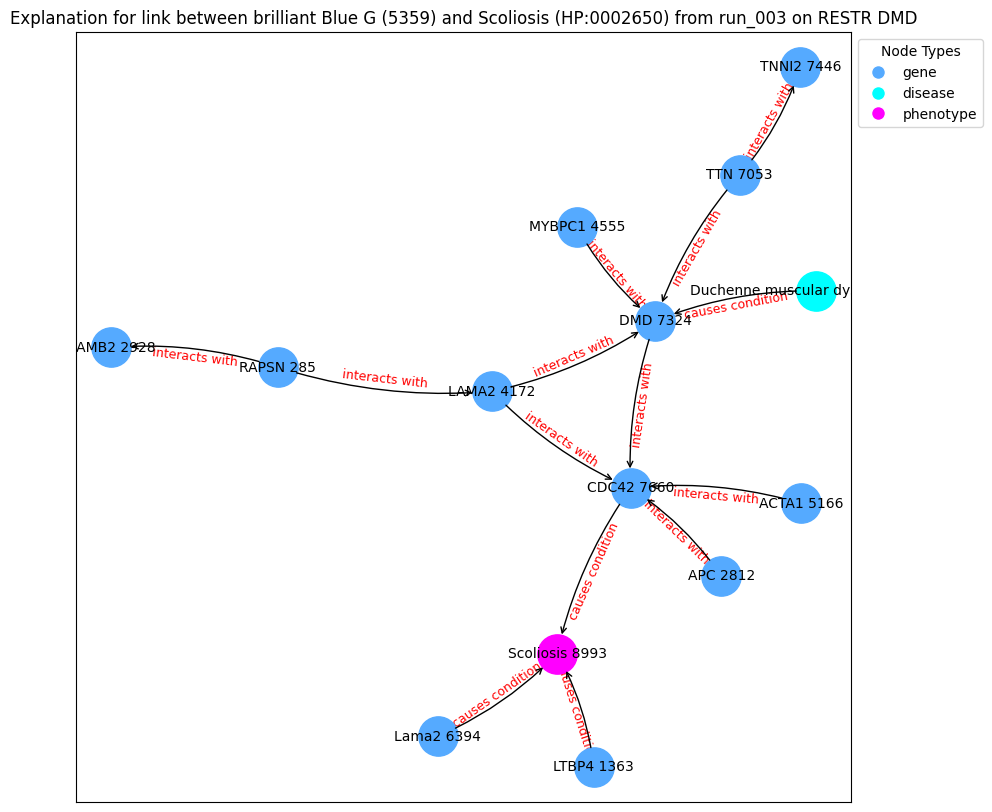

('RAPSN 285', {'type': 'gene'})
('LTBP4 1363', {'type': 'gene'})
('APC 2812', {'type': 'gene'})
('LAMB2 2928', {'type': 'gene'})
('LAMA2 4172', {'type': 'gene'})
('MYBPC1 4555', {'type': 'gene'})
('ACTA1 5166', {'type': 'gene'})
('Duchenne muscular dystrophy 5266', {'type': 'disease'})
('Lama2 6394', {'type': 'gene'})
('TTN 7053', {'type': 'gene'})
('DMD 7324', {'type': 'gene'})
('TNNI2 7446', {'type': 'gene'})
('CDC42 7660', {'type': 'gene'})
('Scoliosis 8993', {'type': 'phenotype'})
('RAPSN 285', 'LAMB2 2928', {'label': 'interacts with'})
('RAPSN 285', 'LAMA2 4172', {'label': 'interacts with'})
('LTBP4 1363', 'Scoliosis 8993', {'label': 'causes condition'})
('APC 2812', 'CDC42 7660', {'label': 'interacts with'})
('LAMA2 4172', 'CDC42 7660', {'label': 'interacts with'})
('LAMA2 4172', 'DMD 7324', {'label': 'interacts with'})
('MYBPC1 4555', 'DMD 7324', {'label': 'interacts with'})
('ACTA1 5166', 'CDC42 7660', {'label': 'interacts with'})
('Duchenne muscular dystrophy 5266', 'DMD 7324'

Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 361.28it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9574], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 390.23it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9245], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 387.47it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9626], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 415.28it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9862], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 411.68it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9985], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 398.34it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9598], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 392.61it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9976], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 405.24it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.5938], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 378.82it/s]


Contribution threshold is tensor(0.9939)
Prediction from trained model: tensor([0.9958], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8993 and 370: 100%|██████████| 700/700 [00:01<00:00, 383.83it/s]


Contribution threshold is tensor(0.9939)
No good explanation found after 10 iterations


c:\Users\rosa-\anaconda3\envs\xaifo\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


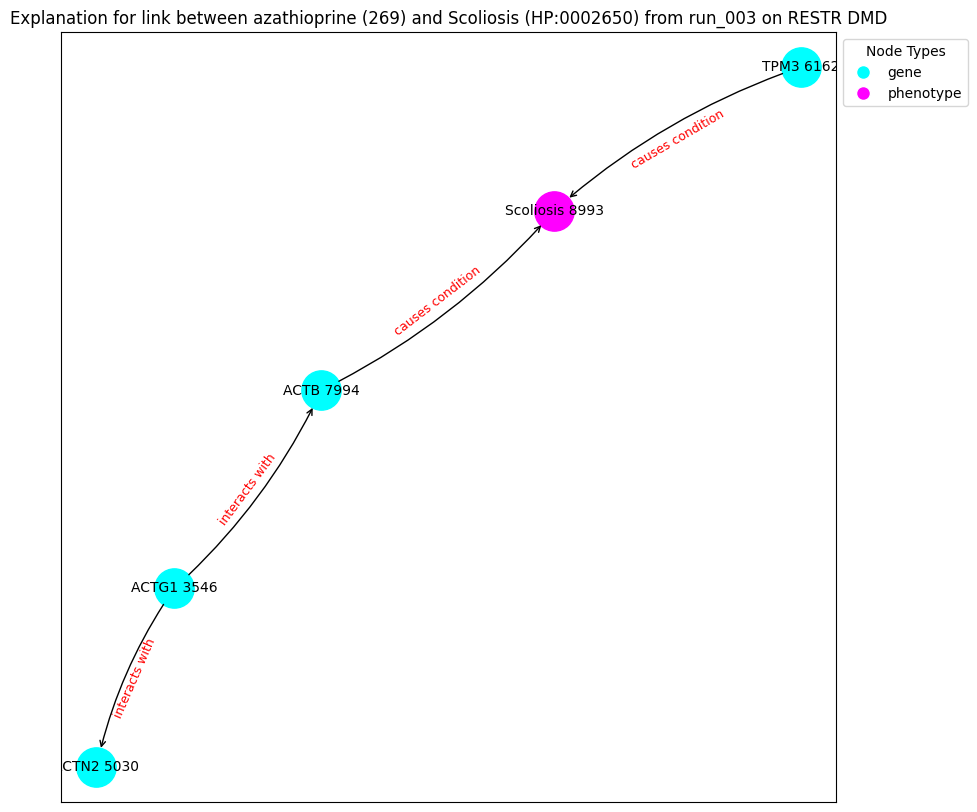

('ACTG1 3546', {'type': 'gene'})
('ACTN2 5030', {'type': 'gene'})
('TPM3 6162', {'type': 'gene'})
('ACTB 7994', {'type': 'gene'})
('Scoliosis 8993', {'type': 'phenotype'})
('ACTG1 3546', 'ACTB 7994', {'label': 'interacts with'})
('ACTG1 3546', 'ACTN2 5030', {'label': 'interacts with'})
('TPM3 6162', 'Scoliosis 8993', {'label': 'causes condition'})
('ACTB 7994', 'Scoliosis 8993', {'label': 'causes condition'})
Explanation graph saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_24_run_003_graph.gpickle
Explanation pair ids and names saved at c:\Users\rosa-\OneDrive\Documents\GitHub\XAI-FO\output\dmd\restr_e2v\expl_6/incomplete_explanation_24_run_003_pair.pkl
node1:
      index_id          id   semantic        label  semantic_id
8833      8833  HP:0001270  phenotype  Motor delay            8
node2:
      index_id    id semantic        label  semantic_id
7729      7729  1795     drug  mezlocillin            3
Prediction from trained

Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 390.01it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9900], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 440.08it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9452], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 463.67it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.6947], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 460.13it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.8972], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 454.88it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9973], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 461.65it/s]


Contribution threshold is tensor(0.9937)
Prediction from trained model: tensor([0.9797], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 421.90it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9521], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 429.53it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9971], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 421.91it/s]


Contribution threshold is tensor(0.9938)
Prediction from trained model: tensor([0.9613], grad_fn=<SigmoidBackward0>)


Explain edge between nodes 8833 and 7729: 100%|██████████| 700/700 [00:01<00:00, 437.54it/s]


In [14]:
def get_node_idx(id, nodes): 
    return nodes[nodes['id'] == id].index.values.astype(int)[0]

def is_overlapping_pair(symptom_id, drug_id):
    if symptom_id in overlapping_symptoms_drugs:
        if drug_id in overlapping_symptoms_drugs[symptom_id]:
            return True
    return False

found_explations_list = []

for run_dir in run_folders_paths:
    print(run_dir)
    run_name = run_dir.split('\\')[-1]
    
    symptoms_drugs = pd.read_pickle(f'{run_dir}/pred/{dataset_prefix}_{disease_prefix}_candidates_per_symptom_{embedding_method}.pkl')   
    
    embedding = loadEdge2VecEmbedding(current_run_dir=run_dir)
        
    G = create_graph(embedding=embedding)
    edge_labels_dict = dict([((n1, n2), G.edges[(n1,n2)]['edge_label']) for n1, n2 in G.edges])
    
    best_model = load_trained_model(current_run_dir=run_dir, embedding=embedding)
    
    x = torch.Tensor(embedding['Embedding'])
    edge_index = torch.Tensor(np.array(G.edges).transpose()).type(torch.int64).long()
    
    complete_explanation_nr = 0
    incomplete_explanation_nr = 0
    
    error_str = []
    
    for ind, edge in symptoms_drugs.iterrows(): 
        symptom_id = edge['Symptom']
        for drug_id in edge['Candidates']:
            try:
                if is_overlapping_pair(symptom_id=symptom_id, drug_id=drug_id):
                
                    node_idx1 = get_node_idx(symptom_id, nodes)
                    print('node1:')
                    print(nodes.loc[[node_idx1]])

                    node_idx2 = get_node_idx(str(drug_id), nodes)
                    print('node2:')
                    print(nodes.loc[[node_idx2]])
                    
                    found_edge_mask, found_limit, is_complete = explain_edge(node_idx1=node_idx1, node_idx2=node_idx2,
                                                                            model=best_model, x=x, edge_index=edge_index, G=G)
                    
                    if found_edge_mask is not None and found_limit is not None:
                        if is_complete:
                            complete_explanation_nr += 1
                            explanation_nr = complete_explanation_nr
                        else:
                            incomplete_explanation_nr += 1
                            explanation_nr = incomplete_explanation_nr
                        
                        found_explanation= {'symptom': symptom_id, 'drug': drug_id, 
                                            'node_idx1': node_idx1, 'node_idx2': node_idx2, 
                                            'found_edge_mask': found_edge_mask, 'found_limit': found_limit, 
                                            'complete': is_complete, 'run': run_name}
                        
                        found_explations_list.append(found_explanation)
                        
                        
                        visualize_explanation(explanation_nr, found_explanation, edge_index, edge_labels_dict)
                            
            except Exception as e:
                error_str.append(f'Error for {run_name} {drug_id} {symptom_id}: {e}')
        
    with open(f'{expl_output_dir}/{run_name}_explanations.txt', 'w') as f:
        f.write(f'Total of {complete_explanation_nr} complete explanations found and total of {incomplete_explanation_nr} incomplete explanations found for run {run_name}')

In [ ]:
found_explations_list

[{'symptom': 'HP:0001263',
  'drug': '1795',
  'node_idx1': 8020,
  'node_idx2': 7729,
  'found_edge_mask': tensor([0., 0., 0.,  ..., 0., 0., 0.]),
  'found_limit': tensor(0.9939),
  'complete': False,
  'run': 'run_001'},
 {'symptom': 'HP:0001263',
  'drug': '269',
  'node_idx1': 8020,
  'node_idx2': 370,
  'found_edge_mask': tensor([0., 0., 0.,  ..., 0., 0., 0.]),
  'found_limit': tensor(0.9938),
  'complete': False,
  'run': 'run_001'},
 {'symptom': 'HP:0001252',
  'drug': '269',
  'node_idx1': 7106,
  'node_idx2': 370,
  'found_edge_mask': tensor([0., 0., 0.,  ..., 0., 0., 0.]),
  'found_limit': tensor(0.9936),
  'complete': False,
  'run': 'run_001'},
 {'symptom': 'HP:0001290',
  'drug': '269',
  'node_idx1': 9599,
  'node_idx2': 370,
  'found_edge_mask': tensor([0., 0., 0.,  ..., 0., 0., 0.]),
  'found_limit': tensor(0.9939),
  'complete': False,
  'run': 'run_001'},
 {'symptom': 'HP:0001635',
  'drug': '231',
  'node_idx1': 8695,
  'node_idx2': 4932,
  'found_edge_mask': tensor(